<a href="https://colab.research.google.com/github/saeedutsha/Retinal-Blood-Vessel-Segmentation/blob/main/IPProjectRetina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DRIVE Dataset

## **Loading Data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import os
import numpy as np
import cv2
from glob import glob
from tqdm import tqdm
import imageio
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from scipy.ndimage import gaussian_filter
from skimage import morphology
from sklearn.metrics import confusion_matrix
from copy import deepcopy
import numpy as np
from math import gamma
from scipy.special import xlogy


In [ ]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def load_data(path):
    """ X = Images and Y = masks """

    train_x = sorted(glob(os.path.join(path, "training", "images", "*.tif")))
    train_y = sorted(glob(os.path.join(path, "training", "1st_manual", "*.gif")))
    mask = sorted(glob(os.path.join(path, "training", "mask", "*.gif")))


    return train_x, train_y, mask

In [ ]:
if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)

    """ Load the data """
    data_path = "/content/drive/MyDrive/Colab Notebooks/DRIVE"
    # data_path='/content/DRIVE/'
    (train_x, train_y, mask) = load_data(data_path)

    print(f"Train: {len(train_x)} - {len(train_y)}")
    

Train: 20 - 20


In [ ]:
def read_gif(path):
  cap = cv2.VideoCapture(path)
  ret, maskImg = cap.read()

  cap.release()
  return maskImg

## **Top-hat**

In [ ]:
# def optimized_top_hat(image, openingRadius, closingRadius):
#   imageComplement = image.max() - image

#   opening_kernel = morphology.disk(openingRadius)
#   closing_kernel = morphology.disk(closingRadius)

#   openedImage=morphology.opening(imageComplement, opening_kernel)
#   closedImage=morphology.closing(openedImage, closing_kernel)

#   # closedImage=morphology.closing(image, closing_kernel)
#   # openedImage=morphology.opening(closedImage, opening_kernel)
  
  
#   return imageComplement-closedImage


# def optimized_top_hat2(image, openingRadius, closingRadius):
#   imageComplement = 255 - image

#   opening_kernel = morphology.disk(openingRadius)
#   closing_kernel = morphology.disk(closingRadius)

#   openedImage=morphology.opening(imageComplement, opening_kernel)
#   closedImage=morphology.closing(imageComplement-openedImage, closing_kernel)

#   # closedImage=morphology.closing(image, closing_kernel)
#   # openedImage=morphology.opening(closedImage, opening_kernel)
  
  
#   return closedImage

def top_hat(image, openingRadius):

  opening_kernel = morphology.disk(openingRadius)

  openedImage=morphology.opening(image, opening_kernel)

  return image-openedImage

## **Homomorphic Filtering**

In [ ]:
class HomomorphicFilter:

    def __init__(self, a = 0.5, b = 1.5):
        self.a = float(a)
        self.b = float(b)

    def __gaussian_filter(self, I_shape, filter_params):
        P = I_shape[0]/2
        Q = I_shape[1]/2
        H = np.zeros(I_shape)
        U, V = np.meshgrid(range(I_shape[0]), range(I_shape[1]), sparse=False, indexing='ij')
        Duv = (((U-P)**2+(V-Q)**2)).astype(float)
        H = np.exp((-Duv/(2*(filter_params)**2)))
        return (1 - H)

    def __apply_filter(self, I, H):
        H = np.fft.fftshift(H)
        I_filtered = (self.a + self.b*H)*I
        return I_filtered

    def filter(self, I, filter_params):

        #  Validating image
        if len(I.shape) is not 2:
            raise Exception('Improper image')

        # Take the image to log domain and then to frequency domain 
        I_log = np.log1p(np.array(I, dtype="float"))
        I_fft = np.fft.fft2(I_log)

        # Filter
        H = self.__gaussian_filter(I_shape = I_fft.shape, filter_params = filter_params)
        
        # Apply filter on frequency domain then take the image back to spatial domain
        I_fft_filt = self.__apply_filter(I = I_fft, H = H)
        I_filt = np.fft.ifft2(I_fft_filt)
        I = np.exp(np.real(I_filt))-1
        return np.uint8(I)

## Matched Filter

In [ ]:
import math
def get_matched_filter(sgementLength, sigma,orientation):
  
  
  kernelSize=math.ceil(np.sqrt((6*(math.ceil(sigma))+1)**2 + sgementLength**2))
  matchedFilter=np.zeros((kernelSize,kernelSize))
  matchedFilter2=np.zeros((kernelSize,kernelSize))

  halfKernel = round((kernelSize - 1) / 2);
  row=0


  for j in range(halfKernel,-halfKernel,-1):
    col=0
    # x=np.arange(-halfKernel,halfKernel,1)
 
    # xRotated= x*np.cos(orientation)+j*np.sin(orientation)
    # yRotated= -x*np.sin(orientation)+j*np.cos(orientation) 
    # xRotated[np.abs(xRotated) > 3.5*math.ceil(sigma)]=0
    # print(yRotated)

    # yRotated[np.abs(yRotated) >((sgementLength-1)/2)]=0
    # yRotated[yRotated!=0]=1
    # matchedFilter2[row,:yRotated.shape[0]]=(-np.exp(-.5*np.power((xRotated/sigma),2))/(np.sqrt(2*np.pi)*sigma))*yRotated
    # print(-np.exp(-.5*np.power((xRotated/sigma),2))/(np.sqrt(2*np.pi)*sigma)*yValid)
    
    for i in range(-halfKernel,halfKernel,1):
      xRotated= i*np.cos(orientation)+j*np.sin(orientation)
      yRotated= -i*np.sin(orientation)+j*np.cos(orientation)
      if abs(xRotated) > 3.5*math.ceil(sigma):
        matchedFilter[row,col] = 0
      elif abs(yRotated) > (sgementLength-1) / 2:
        matchedFilter[row,col] = 0
      else:
        matchedFilter[row,col] = -np.exp(-.5*np.power((xRotated/sigma),2))/(np.sqrt(2*np.pi)*sigma)
      
      col+=1
    row +=1

  ##subtract mean
  mean=np.sum(matchedFilter.reshape(-1))/np.sum(matchedFilter.reshape(-1)<0)
  matchedFilter[matchedFilter<0]=matchedFilter[matchedFilter<0]- mean
                
        
  return matchedFilter


In [ ]:
# import numpy as np
# from tabulate import tabulate


# x=get_matched_filter(7,0.8,np.pi/12)
# # tabulate data
# table = tabulate(x, tablefmt="fancy_grid")

# # output
# print(table)


In [ ]:
from scipy.signal import convolve2d 
def matched_filter_1(img, segmentLength,sigma,rotationStep):

  matchedFilterBank=np.zeros((img.shape[0],img.shape[1],int(180/rotationStep)+1))
  i=0
  for theta in np.arange(0,np.pi,rotationStep*np.pi/180):
    matchedFilter=get_matched_filter(segmentLength,sigma,theta)
    matchedFilterBank[:,:,i]=convolve2d(img,matchedFilter,mode='same')
    i+=1
    
  return np.amax(matchedFilterBank, 2)

## MCET-HHO

In [ ]:
class BaseHHO():
    """
    Harris Hawks Optimization: Algorithm and Applications
    """
    ID_POS = 0
    ID_FIT = 1

    def __init__(self, pop_size=100,iterations=500,thresholdCount=4,histogram=None):
        self.epoch = iterations
        self.pop_size = pop_size
        
        self.domain_range=(0,256)
        
        self.thresholdCount=thresholdCount
        self.histogram=histogram
        self.ID_MIN_PROBLEM=0
        self.loss_train=[]
        self.pop = [self.create_solution() for _ in range(0, self.pop_size)]

        self.gbest = self.get_global_best(self.pop, self.ID_FIT, self.ID_MIN_PROBLEM)


    def fitness_score(self,solution):
      
      #calulating the first term
      intenstiyValues=np.arange(start=self.domain_range[0], stop=self.domain_range[1])
      

      score=np.sum(intenstiyValues*xlogy(self.histogram,intenstiyValues))
      
      # Appending 0,...,255 to the 4 threshold values to compute the cross_entropy_score
      thresholdValues=np.append(solution,self.domain_range[1])

      thresholdValues[thresholdValues>255]=255
      thresholdValues[thresholdValues<0]=0

      thresholdValues=sorted(np.insert(thresholdValues, 0,self.domain_range[0]).astype(int))

      #calculating H1....Hk
      for i in range(self.thresholdCount):
        subIntensityValues=np.arange(start=thresholdValues[i], stop=thresholdValues[i+1])
        i_hi=np.sum(subIntensityValues*self.histogram[thresholdValues[i]:thresholdValues[i+1]])
        sub_hi_sum=np.sum(self.histogram[thresholdValues[i]:thresholdValues[i+1]])
        subMean= i_hi/sub_hi_sum if sub_hi_sum!=0 else 0
        
        score-=xlogy(i_hi,subMean) 
        
      return score
    
    def create_solution(self):
      solution = np.random.uniform(self.domain_range[0], self.domain_range[1], self.thresholdCount)
      fitness = self.fitness_score(solution)
      return [solution, fitness]
    
    def get_global_best(self, pop=None, id_fitness=None, id_best=None):
      sorted_pop = sorted(pop, key=lambda temp: temp[id_fitness])
      return deepcopy(sorted_pop[id_best])
    
    def train(self):
        pop = [self.create_solution() for _ in range(0, self.pop_size)]
        gbest = self.get_global_best(pop, self.ID_FIT, self.ID_MIN_PROBLEM)
        for epoch in range(0, self.epoch):
            # Update the location of Harris' hawks
            for i in range(0, self.pop_size):
                E0 = 2 * np.random.uniform() - 1                        # -1 < E0 < 1
                E = 2 * E0 * (1 - (epoch + 1) * 1.0 / self.epoch)       # factor to show the decreasing energy of rabbit
                J = 2 * (1 - np.random.uniform())

                # -------- Exploration phase Eq. (1) in paper -------------------
                if (np.abs(E) >= 1):
                    # Harris' hawks perch randomly based on 2 strategy:
                    if (np.random.uniform() >= 0.5):        # perch based on other family members
                        X_rand = deepcopy(pop[np.random.randint(0, self.pop_size)][self.ID_POS])
                        pop[i][self.ID_POS] = X_rand - np.random.uniform() * np.abs(X_rand - 2 * np.random.uniform() * pop[i][self.ID_POS])

                    else:           # perch on a random tall tree (random site inside group's home range)
                        X_m = np.mean([x[self.ID_POS] for x in pop])
                        pop[i][self.ID_POS] = (gbest[self.ID_POS] - X_m) - np.random.uniform()*(
                            self.domain_range[0] + np.random.uniform() * (self.domain_range[1] - self.domain_range[0]))

                # -------- Exploitation phase -------------------
                else:
                    # Attacking the rabbit using 4 strategies regarding the behavior of the rabbit
                    # phase 1: ----- surprise pounce (seven kills) ----------
                    # surprise pounce (seven kills): multiple, short rapid dives by different hawks
                    if (np.random.uniform() >= 0.5):
                        delta_X = gbest[self.ID_POS] - pop[i][self.ID_POS]
                        if (np.abs(E) >= 0.5):          # Hard besiege Eq. (6) in paper
                            pop[i][self.ID_POS] = delta_X - E * np.abs( J * gbest[self.ID_POS] - pop[i][self.ID_POS] )
                        else:                           # Soft besiege Eq. (4) in paper
                            pop[i][self.ID_POS] = gbest[self.ID_POS] - E * np.abs(delta_X)
                    else:
                        xichma = np.power((gamma(1 + 1.5) * np.sin(np.pi * 1.5 / 2.0)) / (gamma((1 + 1.5) * 1.5 * np.power(2, (1.5 - 1) / 2)) / 2.0), 1.0 / 1.5)
                        LF_D = 0.01 * np.random.uniform() * xichma / np.power(np.abs(np.random.uniform()), 1.0 / 1.5)
                        fit_Y, Y = None, None
                        if (np.abs(E) >= 0.5):      # Soft besiege Eq. (10) in paper
                            Y = gbest[self.ID_POS] - E * np.abs( J * gbest[self.ID_POS] - pop[i][self.ID_POS] )
                            fit_Y = self.fitness_score(Y)
                        else:                       # Hard besiege Eq. (11) in paper
                            X_m = np.mean([x[self.ID_POS] for x in pop])
                            Y = gbest[self.ID_POS] - E * np.abs( J * gbest[self.ID_POS] - X_m )
                            fit_Y = self.fitness_score(Y)

                        Z = Y + np.random.uniform(self.domain_range[0], self.domain_range[1], self.thresholdCount) * LF_D
                        fit_Z = self.fitness_score(Z)

                        if fit_Y < pop[i][self.ID_FIT]:
                            pop[i] = [Y, fit_Y]
                        if fit_Z < pop[i][self.ID_FIT]:
                            pop[i] = [Z, fit_Z]

            current_best = self.get_global_best(pop, self.ID_FIT, self.ID_MIN_PROBLEM)
            if current_best[self.ID_FIT] < gbest[self.ID_FIT]:
                gbest = deepcopy(current_best)
            self.loss_train.append(gbest[self.ID_FIT])
            # print("Epoch = {}, Fit = {}".format(epoch + 1, gbest[self.ID_FIT]))

        return gbest[self.ID_POS], self.loss_train

#Method-1 Diaz et al 

In [ ]:
X_data_method2 = []
mask_data_method2 = []
for data in train_x:
  image = cv2.imread(data)
  # cv2_imshow(image)
  # Extracting Green Channel
  green_channel = image[:,:,1]
  X_data_method2.append(green_channel)

for m in mask:
  maskImg=read_gif(m)
  maskImg=cv2.cvtColor(maskImg, cv2.COLOR_BGR2GRAY)
  mask_data_method2.append(maskImg/255)

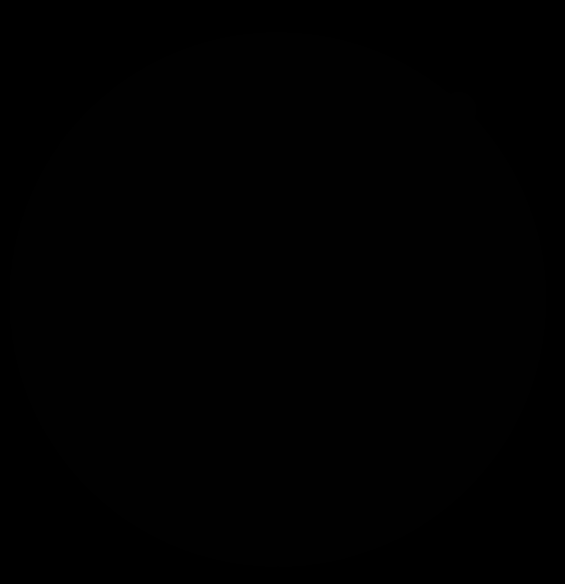

236 0
[56.43505577865489, 99.8779638396566, 255.0]


In [ ]:
  image = X_data_method2[0]
  mask = mask_data_method2[0]
  kernel=np.ones((5,5))
  maskGrayEroded=cv2.erode(mask,kernel,iterations =2 )

  replaceBlackRing=image*maskGrayEroded

  # cv2_imshow(maskGrayEroded)
  cv2_imshow(mask_data_method2[0])
  replaceBlackRing[replaceBlackRing==0]=np.mean(replaceBlackRing)
  

  # clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  # replaceBlackRing= clahe.apply(replaceBlackRing.astype('uint8'))

  closing_kernel = np.ones((9,9))
  closedImage=morphology.closing(replaceBlackRing, closing_kernel)
  bottomHatImage=closedImage-replaceBlackRing


  homo_filter = HomomorphicFilter(a = 0.75, b = 1.25)
  img_filtered = homo_filter.filter(I=bottomHatImage, filter_params=2)

  medianImage = cv2.medianBlur(img_filtered, 3)
  
  bottomHatImage=medianImage
  
  print(bottomHatImage.max(),bottomHatImage.min())
  
  
  #lateral
  lateralKernel=[[-0.025,-0.025,-0.025,-0.025,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.075,1,-0.075,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.025,-0.025,-0.025,-0.025]]

  Ienhanced=bottomHatImage+convolve2d(bottomHatImage,lateralKernel,mode='same')


  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255
  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255


  #MCET-HHO
  histogram, bin_edges = np.histogram(Ienhanced, bins=256, range=(0, 255))
  histogram=histogram/(Ienhanced.shape[0]*Ienhanced.shape[1])
  histogram[0]=0
  hho=BaseHHO(30,250,3,histogram)
  gbest,_=hho.train()

  #binarizing based on best threshold
  gbest[gbest<0]=0
  gbest[gbest>255]=255
  th=sorted(gbest)
  print(th)
  Ienhanced[Ienhanced>th[2]]=0
  Ienhanced[Ienhanced<th[0]]=0
  Ienhanced[Ienhanced!=0]=255
  

  kernel = np.ones((5,5),np.uint8)
  Ienhanced = morphology.closing(Ienhanced,kernel)
  

  cleaned = morphology.remove_small_objects(Ienhanced.astype(bool), min_size=30, connectivity=8).astype(int)

  cleaned[cleaned==True]=255
  

In [ ]:
def diazEtAl(image,mask):
  
  kernel=np.ones((5,5))
  maskGrayEroded=cv2.erode(mask,kernel,iterations =2 )


  replaceBlackRing=image*maskGrayEroded

  replaceBlackRing[replaceBlackRing==0]=np.mean(replaceBlackRing)

  # clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  # replaceBlackRing= clahe.apply(replaceBlackRing.astype('uint8'))

  closing_kernel = np.ones((9,9))
  closedImage=morphology.closing(replaceBlackRing, closing_kernel)
  bottomHatImage=closedImage-replaceBlackRing


  homo_filter = HomomorphicFilter(a = 0.75, b = 1.25)
  img_filtered = homo_filter.filter(I=bottomHatImage, filter_params=2)
  medianImage = cv2.medianBlur(img_filtered, 3)
  
  bottomHatImage=medianImage
  cv2_imshow(bottomHatImage)
  
  print(bottomHatImage.max(),bottomHatImage.min())
  
  
  #lateral
  lateralKernel=[[-0.025,-0.025,-0.025,-0.025,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.075,1,-0.075,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.025,-0.025,-0.025,-0.025]]

  Ienhanced=bottomHatImage+convolve2d(bottomHatImage,lateralKernel,mode='same')


  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255
  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255



  cv2_imshow(Ienhanced)


  #MCET-HHO
  histogram, bin_edges = np.histogram(Ienhanced, bins=256, range=(0, 255))
  histogram=histogram/(Ienhanced.shape[0]*Ienhanced.shape[1])
  histogram[0]=0
  hho=BaseHHO(30,250,3,histogram)
  gbest,_=hho.train()

  #binarizing based on best threshold
  gbest[gbest<0]=0
  gbest[gbest>255]=255
  th=sorted(gbest)
  print(th)
  Ienhanced[Ienhanced>th[2]]=0
  Ienhanced[Ienhanced<th[0]]=0
  Ienhanced[Ienhanced!=0]=255
  

  kernel = np.ones((5,5),np.uint8)
  Ienhanced = morphology.closing(Ienhanced,kernel)
  

  cv2_imshow(Ienhanced)
  cleaned = morphology.remove_small_objects(Ienhanced.astype(bool), min_size=30, connectivity=8).astype(int)

  cleaned[cleaned==True]=255

  return cleaned
def diazEtAl_noMask(image):
  
  kernel=np.ones((5,5))

  replaceBlackRing=image

  replaceBlackRing[replaceBlackRing==0]=np.mean(replaceBlackRing)

  # clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  # replaceBlackRing= clahe.apply(replaceBlackRing.astype('uint8'))

  closing_kernel = np.ones((9,9))
  closedImage=morphology.closing(replaceBlackRing, closing_kernel)
  bottomHatImage=closedImage-replaceBlackRing


  homo_filter = HomomorphicFilter(a = 0.75, b = 1.25)
  img_filtered = homo_filter.filter(I=bottomHatImage, filter_params=2)
  medianImage = cv2.medianBlur(img_filtered, 3)
  
  bottomHatImage=medianImage
  cv2_imshow(bottomHatImage)
  
  print(bottomHatImage.max(),bottomHatImage.min())
  
  
  #lateral
  lateralKernel=[[-0.025,-0.025,-0.025,-0.025,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.075,1,-0.075,-0.025],
                [-0.025,-0.075,-0.075,-0.075,-0.025],
                [-0.025,-0.025,-0.025,-0.025,-0.025]]

  Ienhanced=bottomHatImage+convolve2d(bottomHatImage,lateralKernel,mode='same')


  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255
  Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  Ienhanced*=255



  cv2_imshow(Ienhanced)


  #MCET-HHO
  histogram, bin_edges = np.histogram(Ienhanced, bins=256, range=(0, 255))
  histogram=histogram/(Ienhanced.shape[0]*Ienhanced.shape[1])
  histogram[0]=0
  hho=BaseHHO(30,250,3,histogram)
  gbest,_=hho.train()

  #binarizing based on best threshold
  gbest[gbest<0]=0
  gbest[gbest>255]=255
  th=sorted(gbest)
  print(th)
  Ienhanced[Ienhanced>th[2]]=0
  Ienhanced[Ienhanced<th[0]]=0
  Ienhanced[Ienhanced!=0]=255
  

  kernel = np.ones((5,5),np.uint8)
  Ienhanced = morphology.closing(Ienhanced,kernel)
  

  cv2_imshow(Ienhanced)
  cleaned = morphology.remove_small_objects(Ienhanced.astype(bool), min_size=30, connectivity=8).astype(int)

  cleaned[cleaned==True]=255

  return cleaned


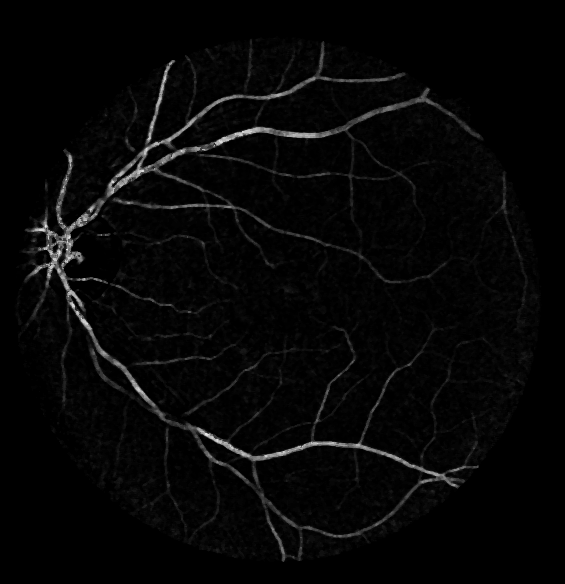

236 0


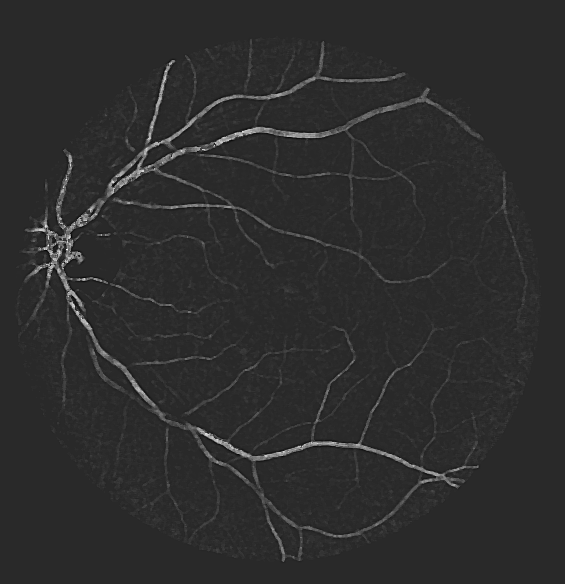

[58.53730432587377, 108.7424634938368, 254.37349459828513]


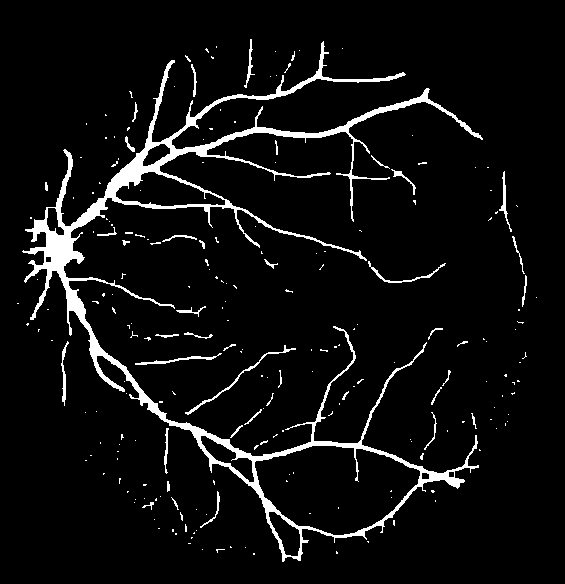

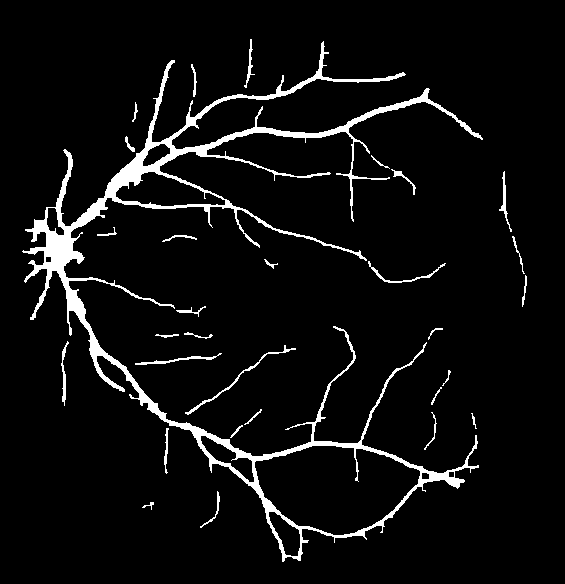

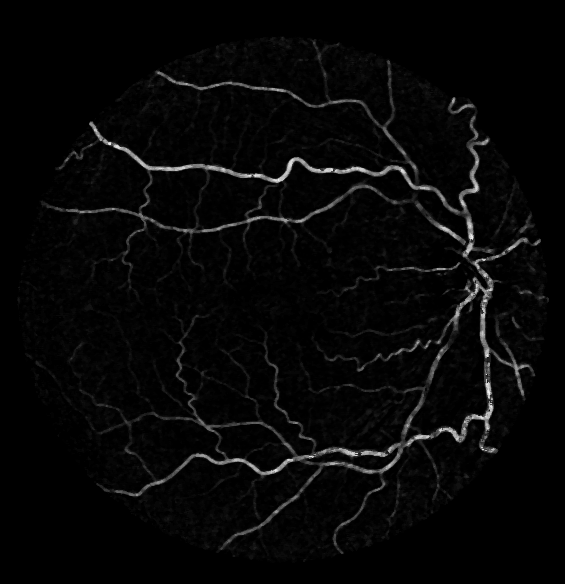

244 0


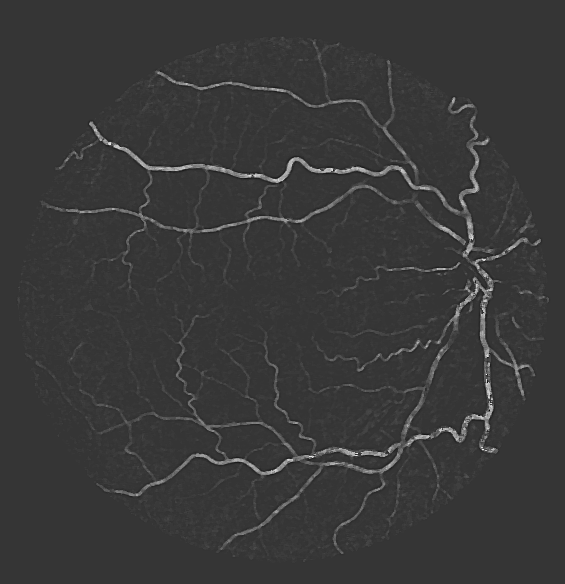

[68.18246797255007, 110.89746181760685, 253.19204518057754]


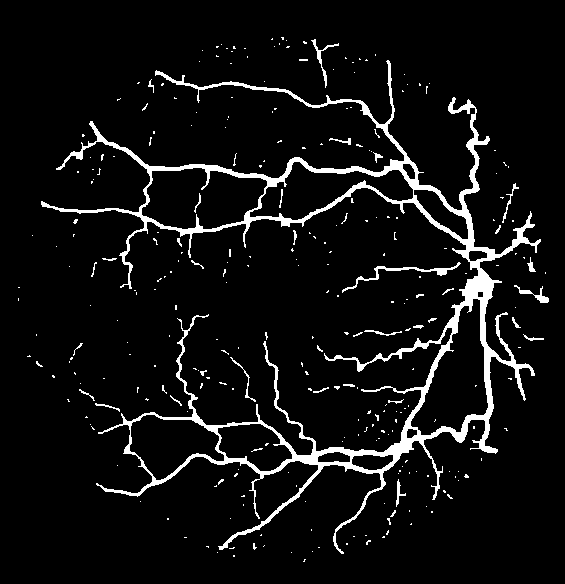

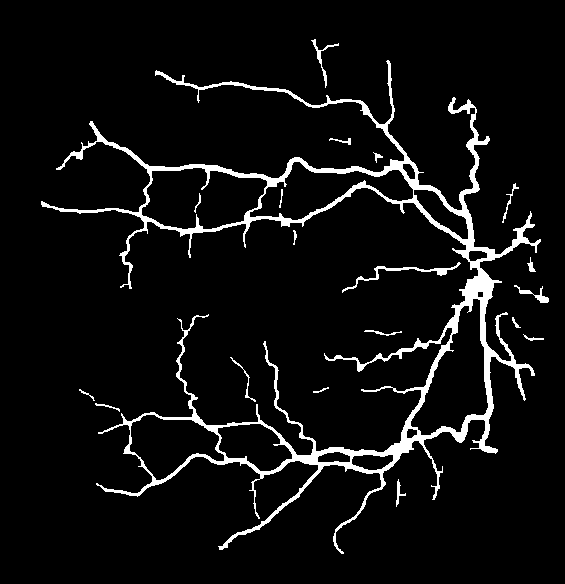

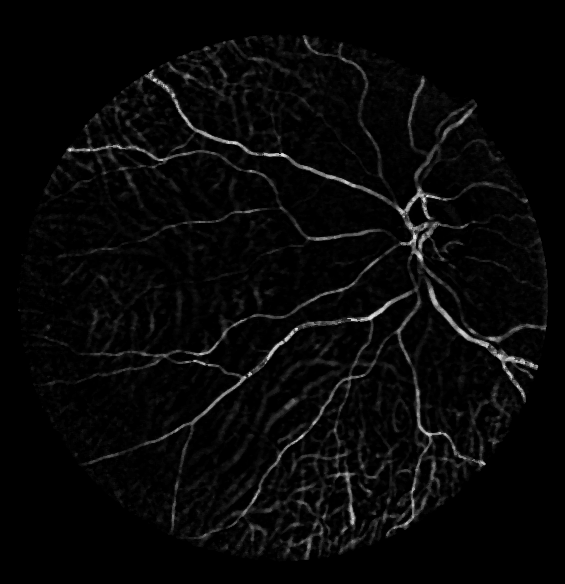

236 0


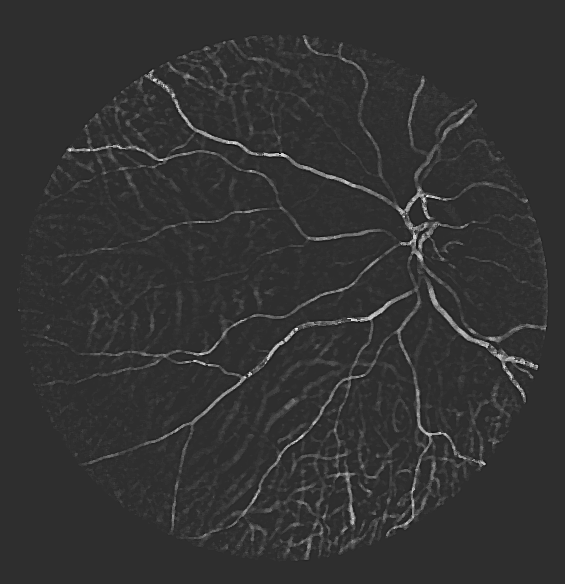

[59.43869643415907, 104.83420353954894, 253.59465176783178]


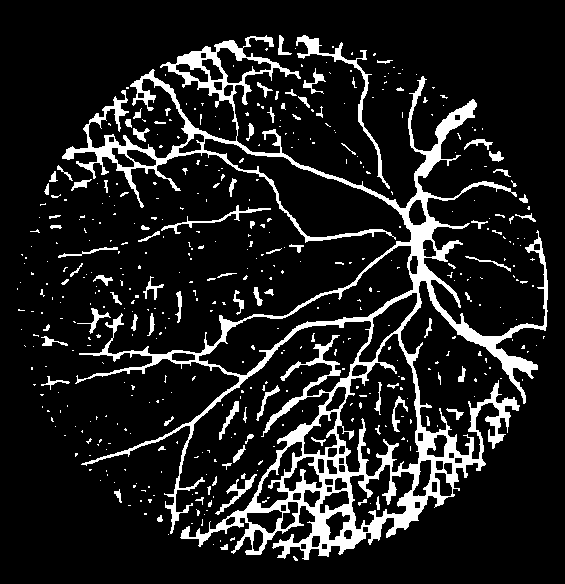

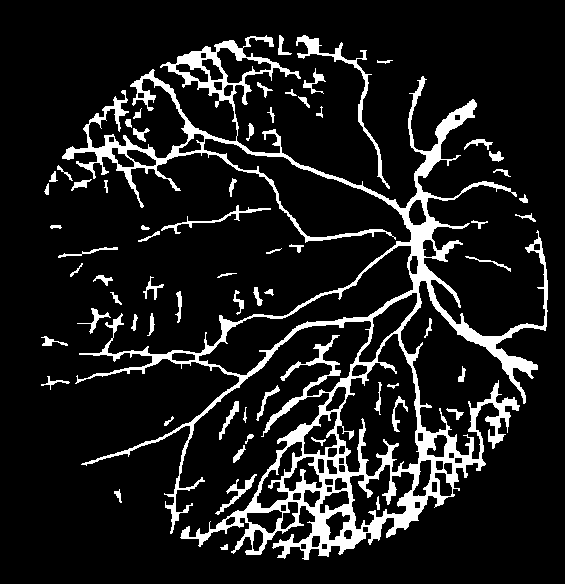

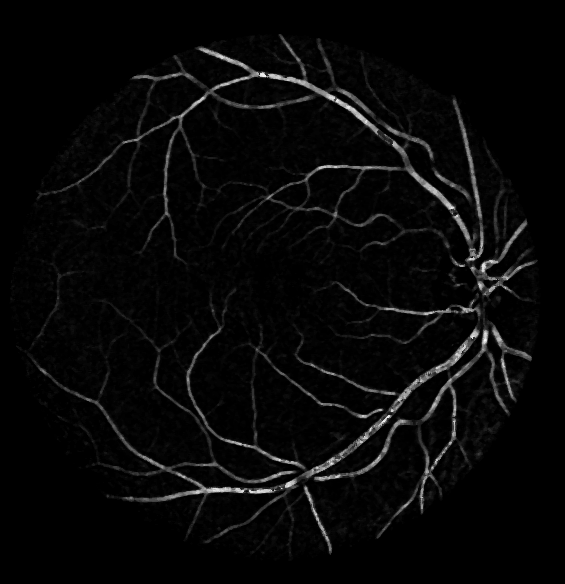

251 0


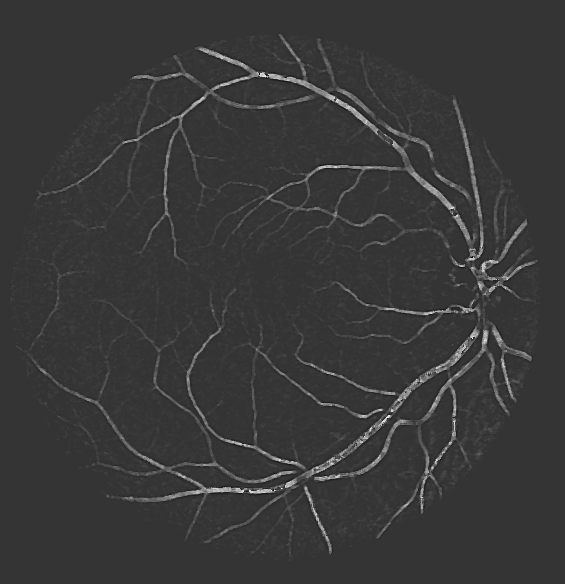

[70.9568500586345, 116.32571882109585, 245.03471701076862]


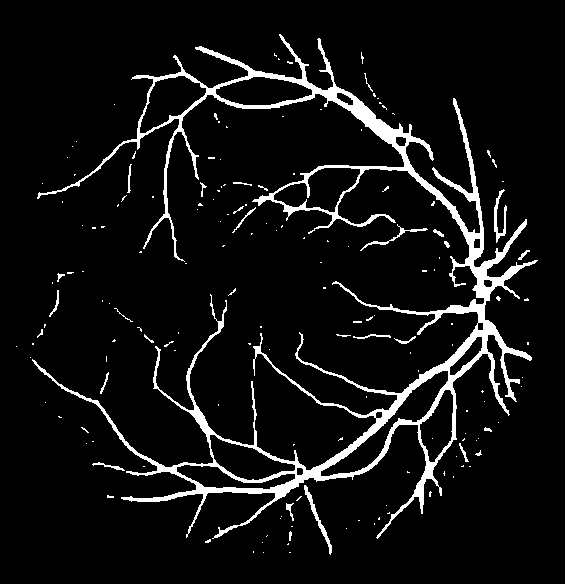

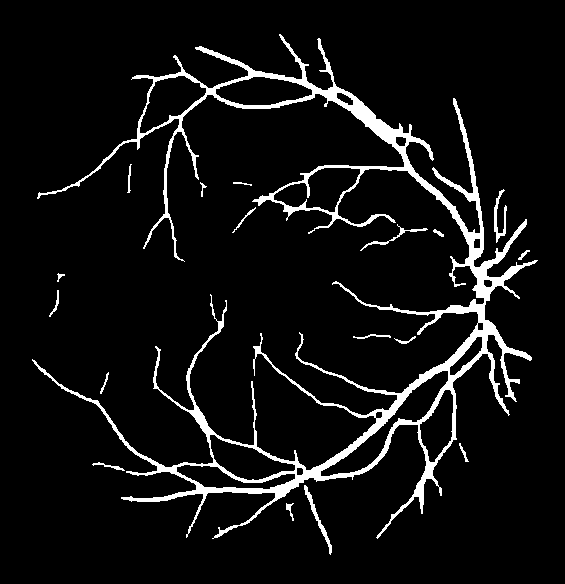

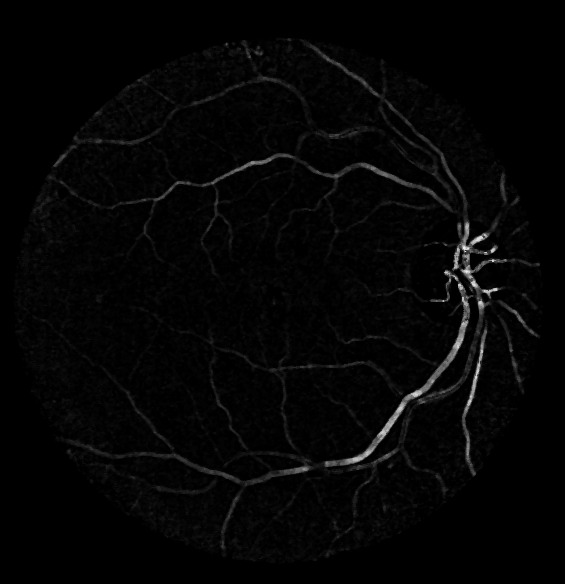

238 0


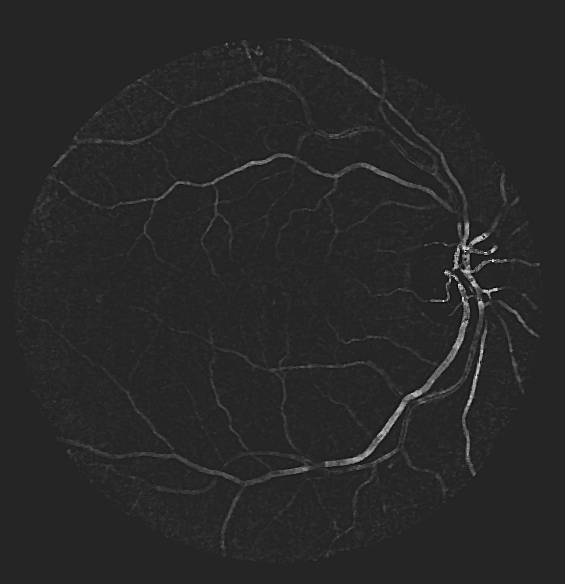

[50.08003206558236, 102.96973756204487, 244.44632515929482]


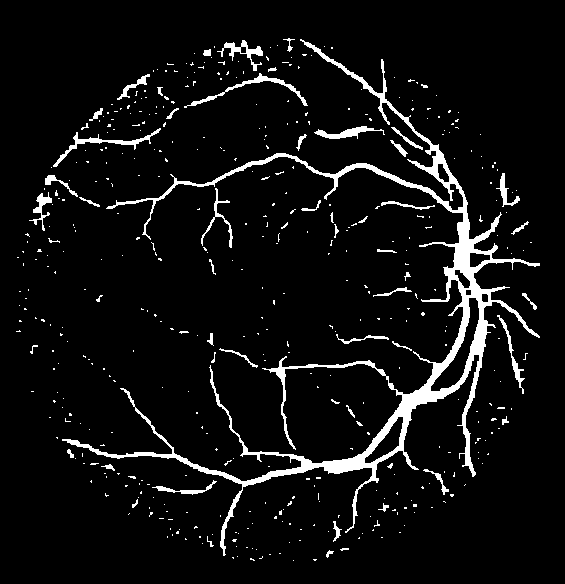

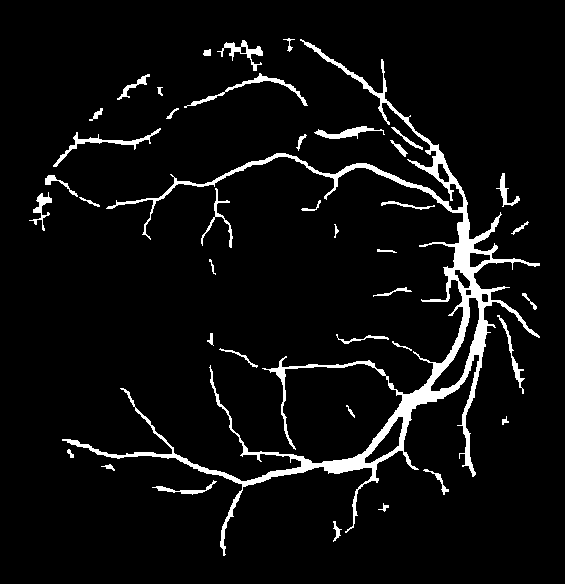

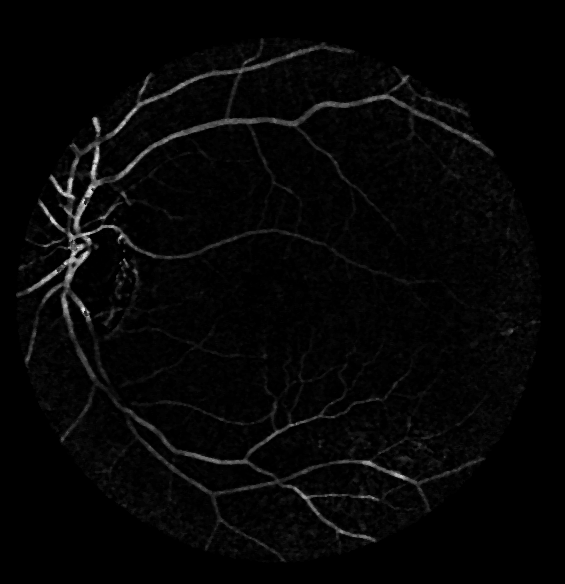

237 0


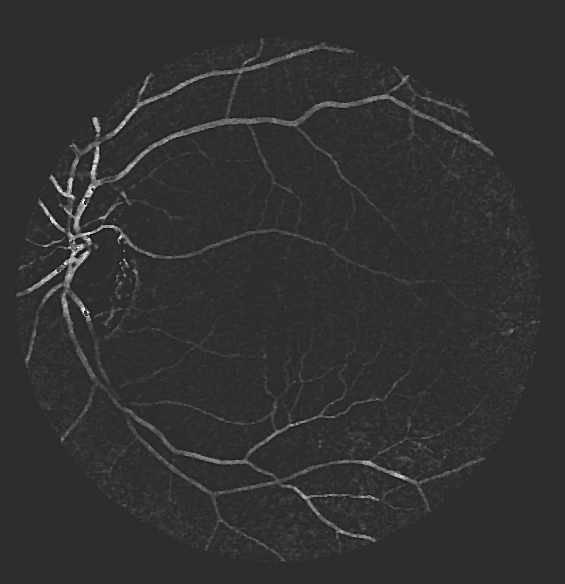

[61.10151536014796, 108.99750471675323, 255.0]


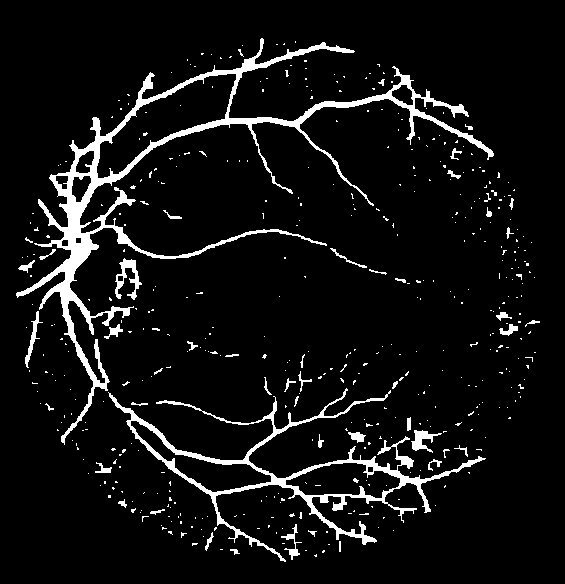

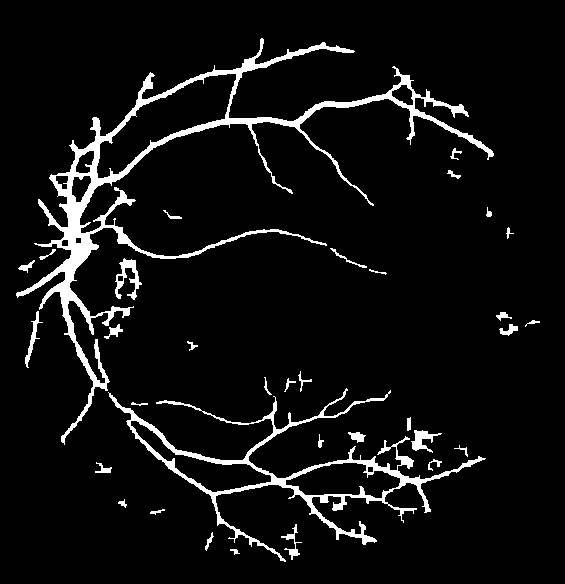

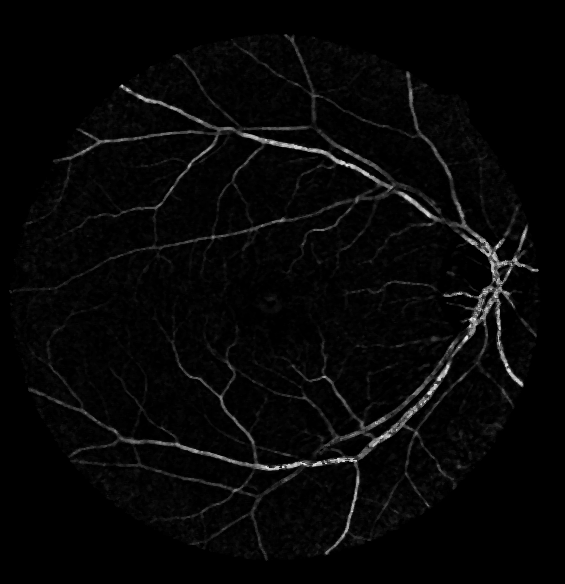

238 0


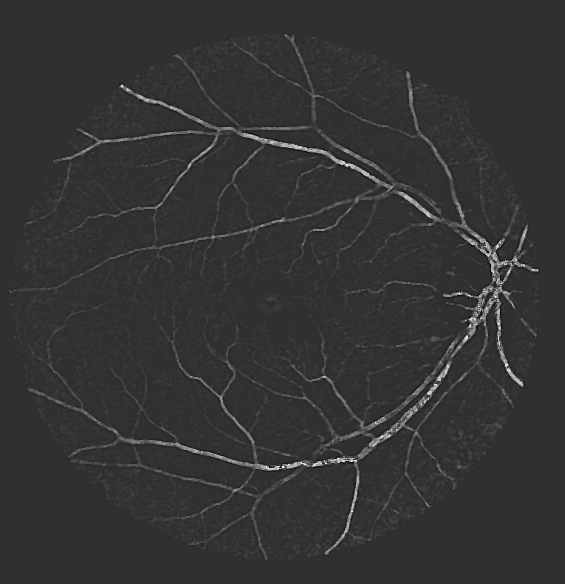

[64.34078658373413, 112.8881010778271, 255.0]


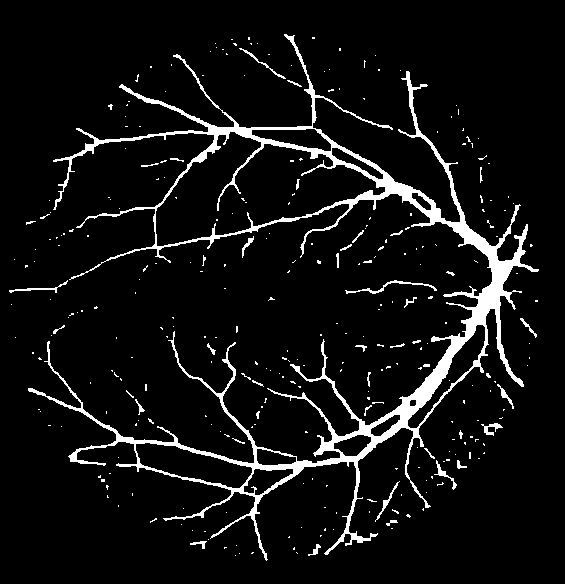

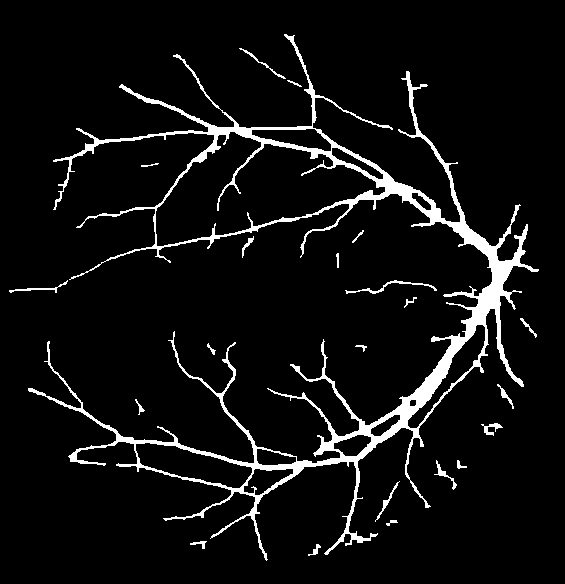

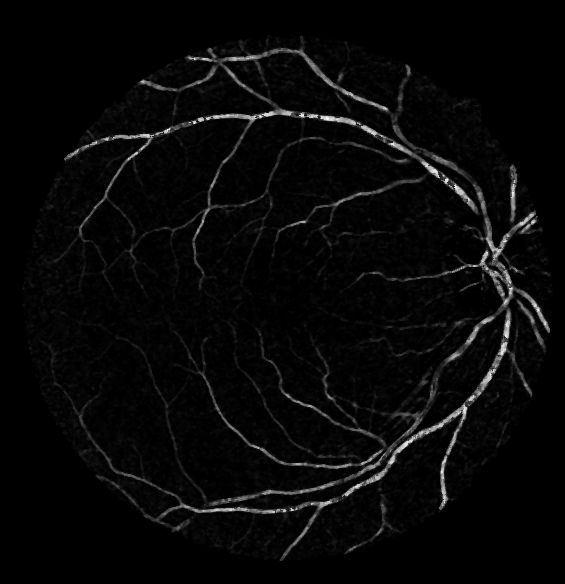

251 0


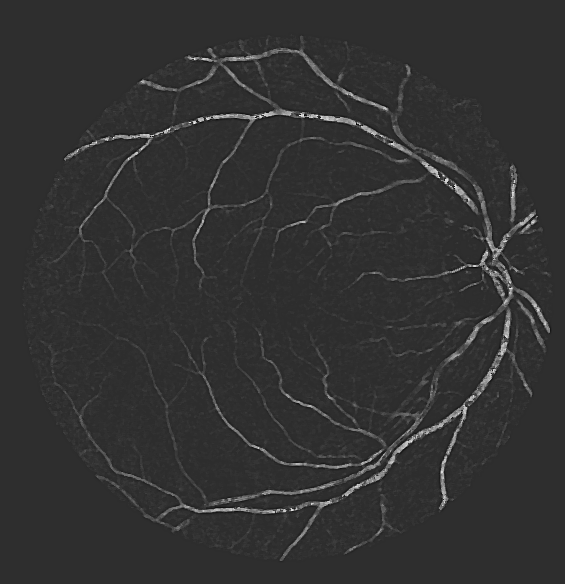

[62.22132791454355, 110.68906106830114, 255.0]


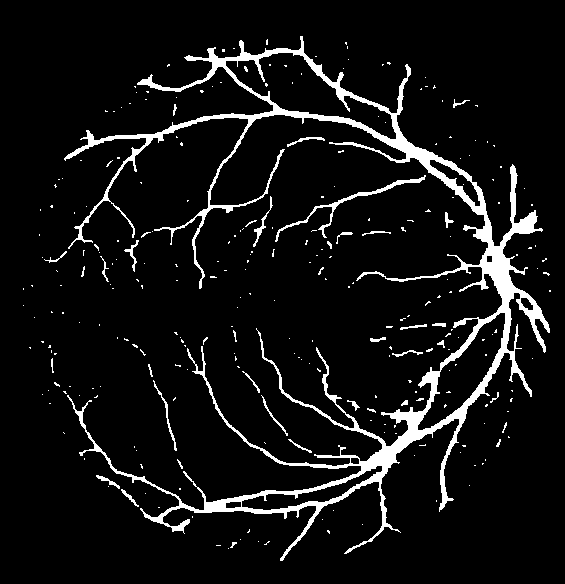

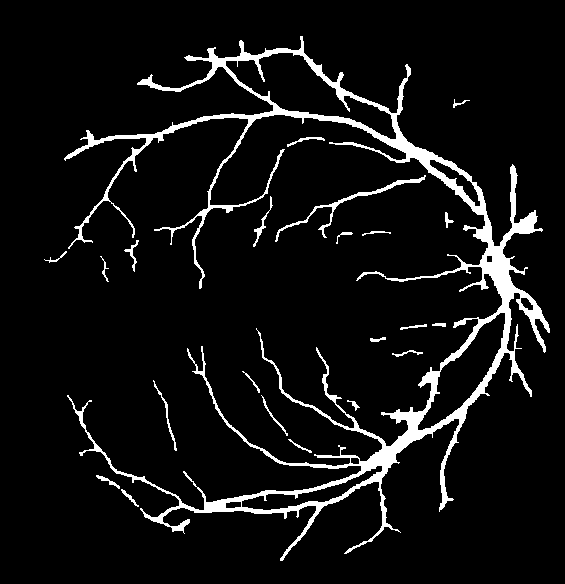

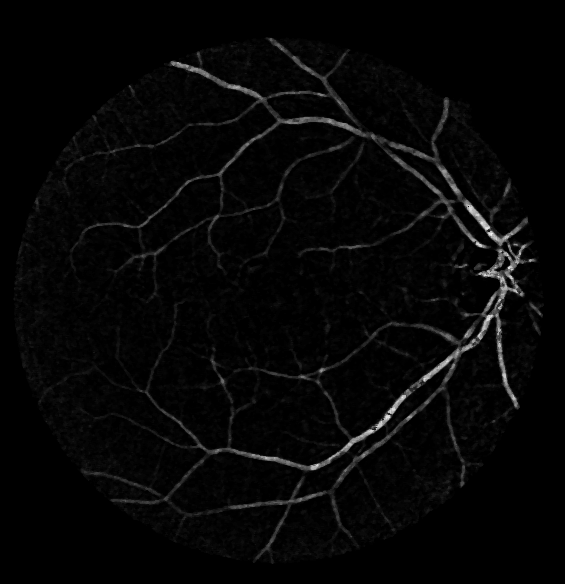

244 0


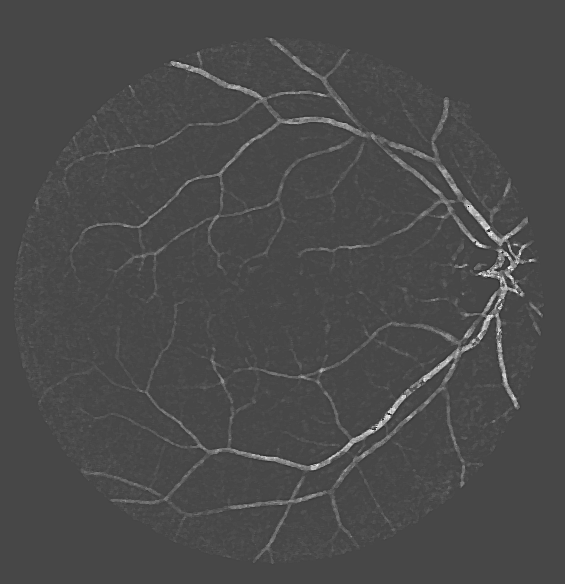

[87.50917008300985, 128.82285188907187, 255.0]


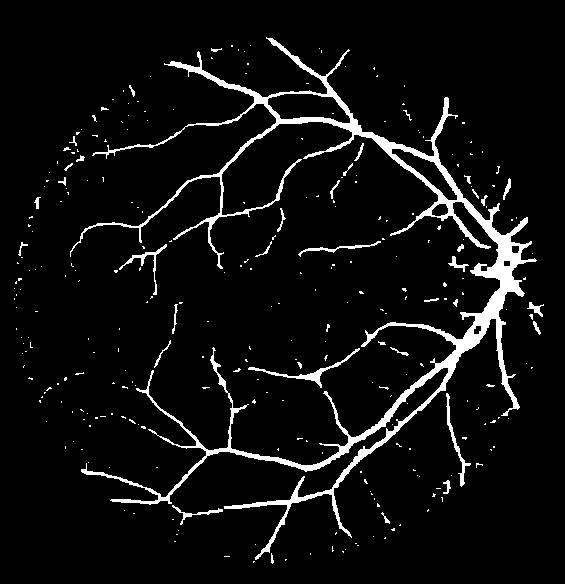

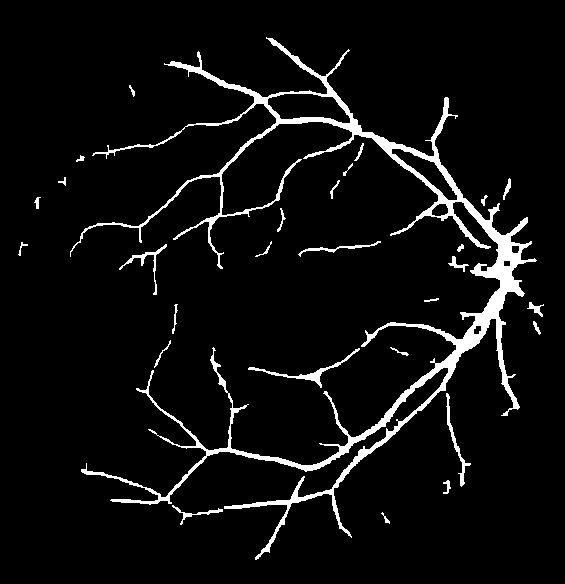

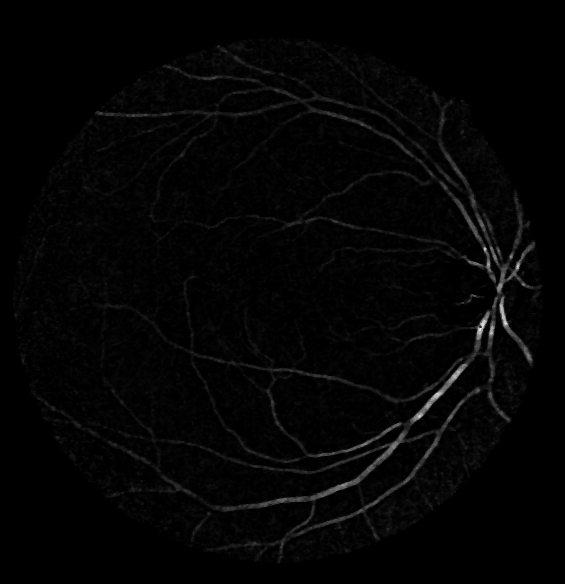

235 0


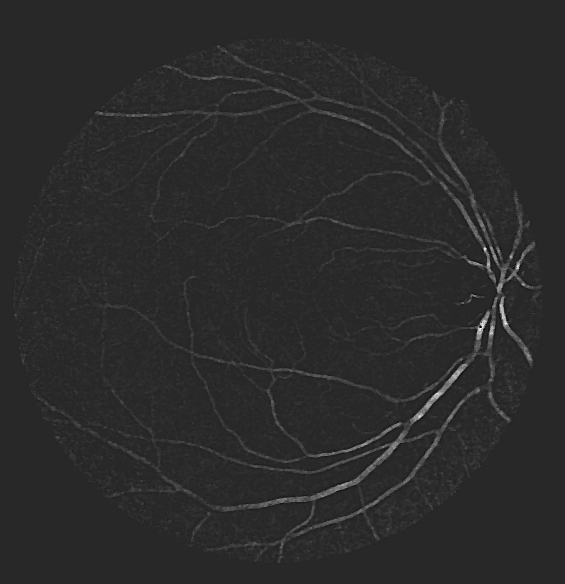

[51.09240347434628, 94.9828002480273, 252.05223792578172]


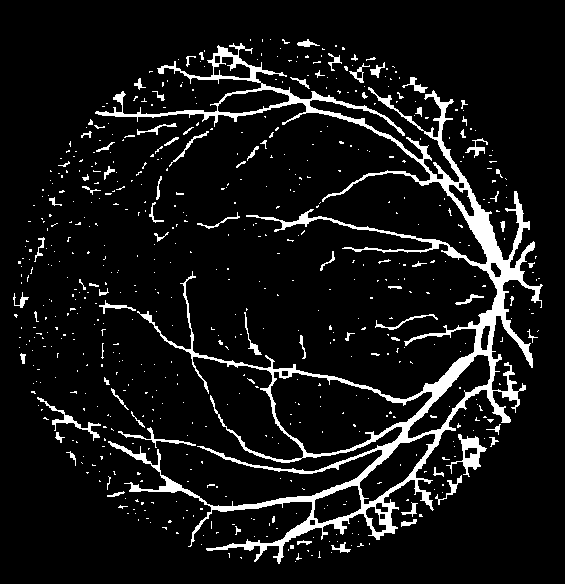

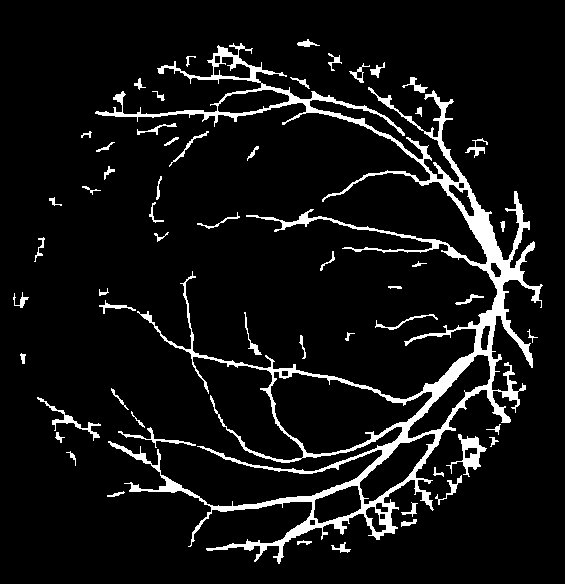

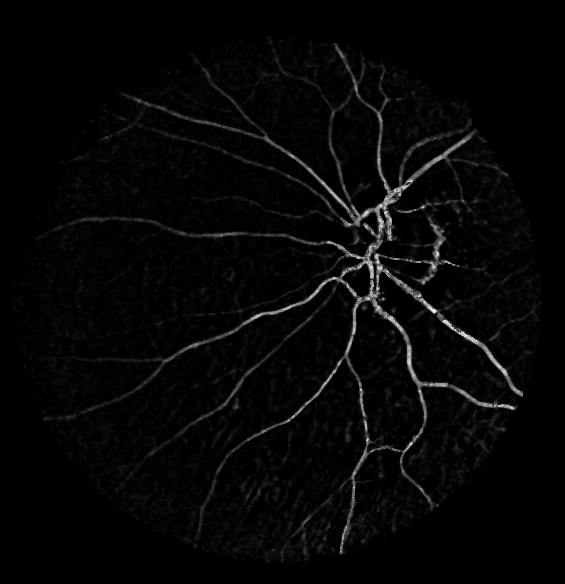

244 0


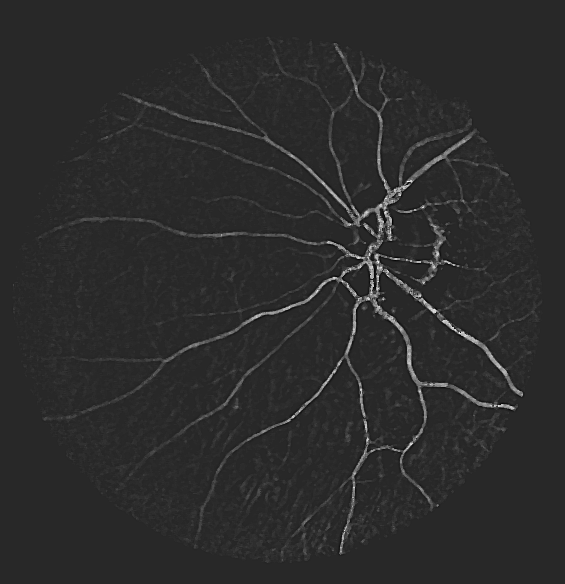

[56.19077672727428, 110.94650888655515, 250.72691733338306]


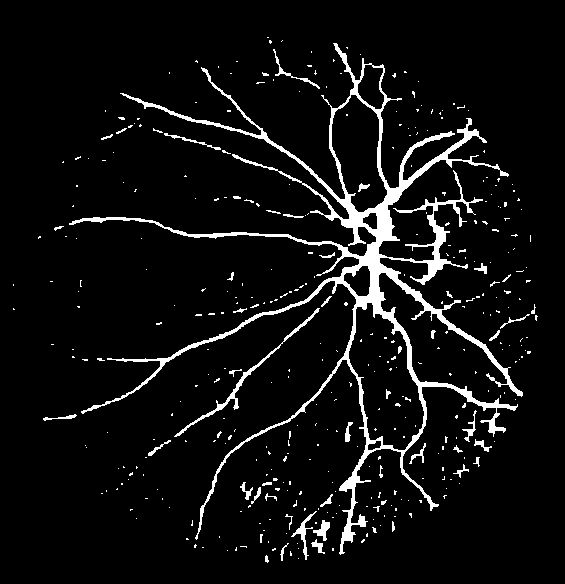

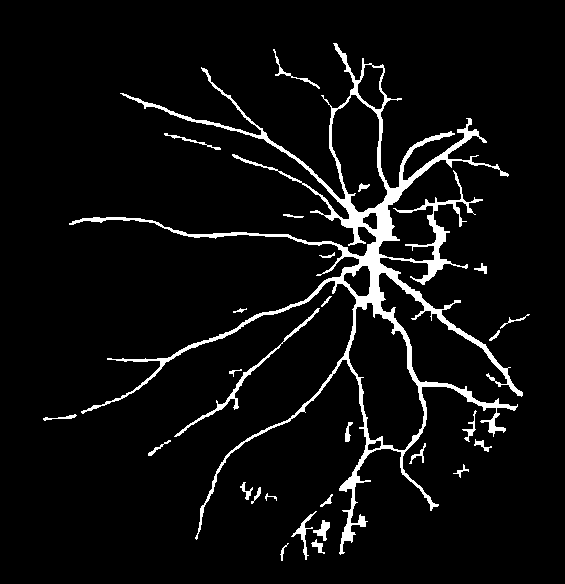

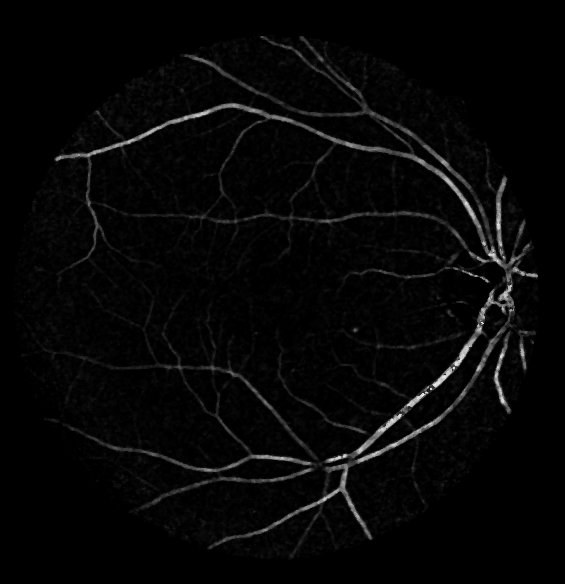

249 0


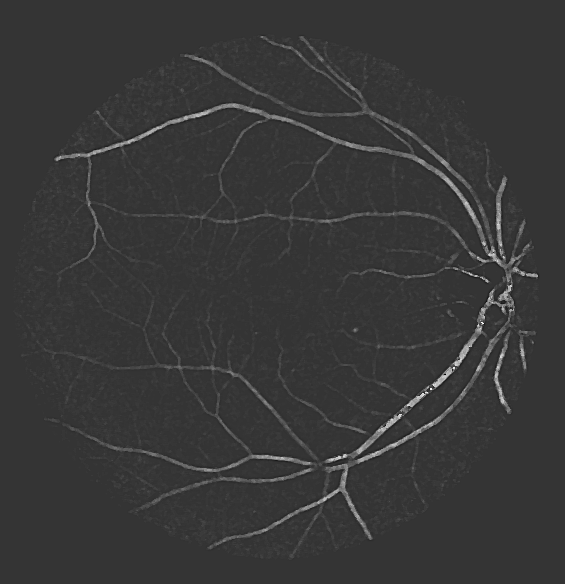

[70.32075028647057, 118.99757406279384, 255.0]


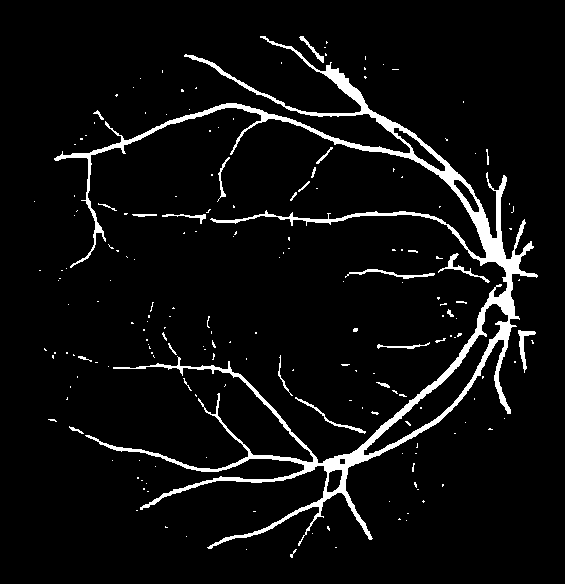

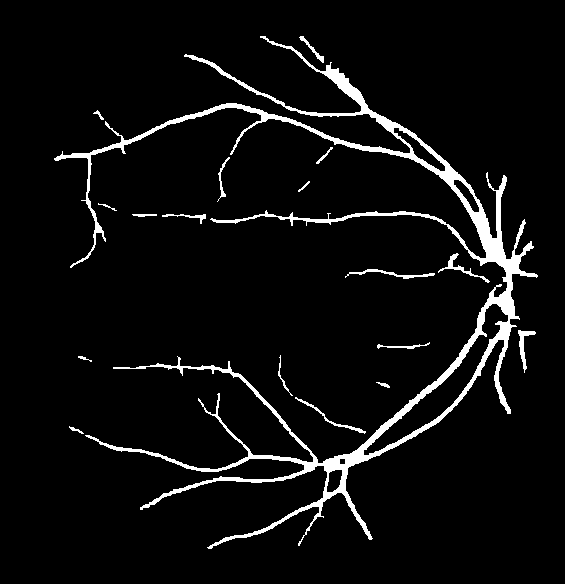

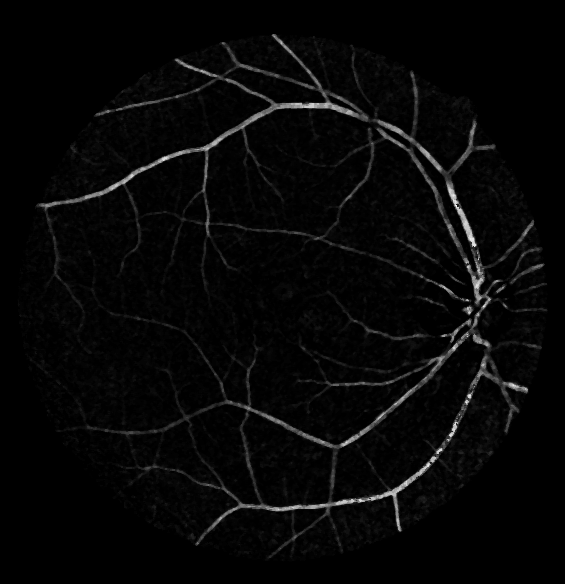

251 0


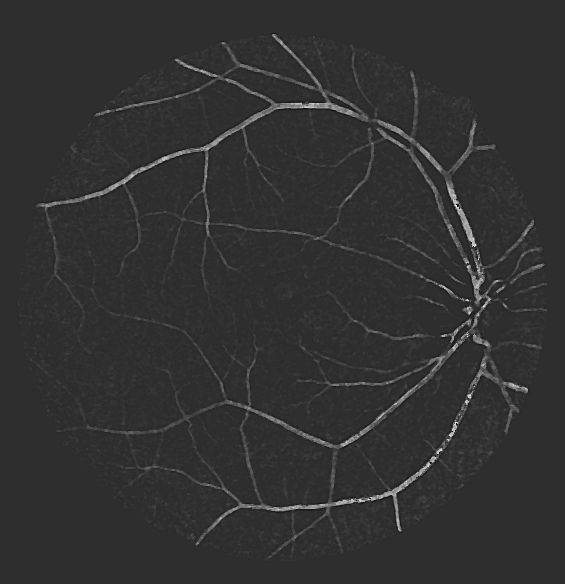

[63.358683441997954, 113.79363631581887, 249.68010369437283]


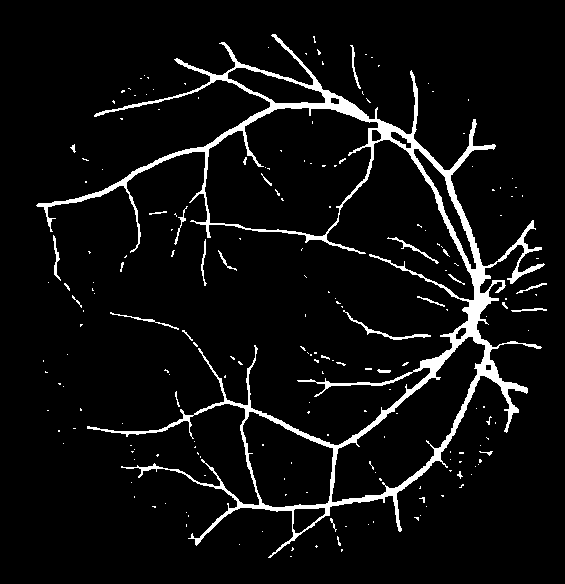

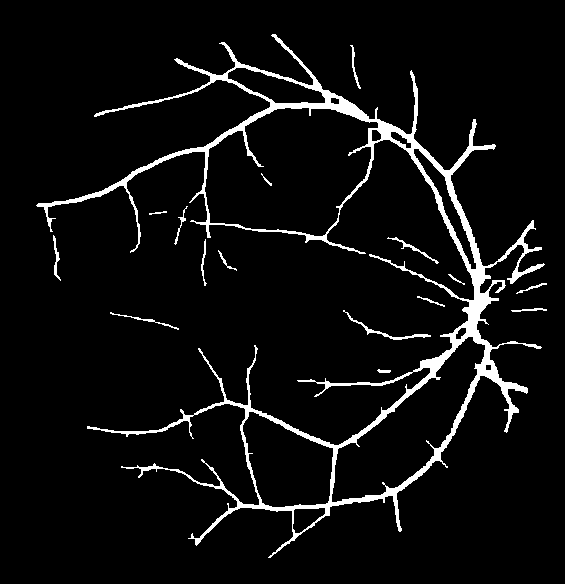

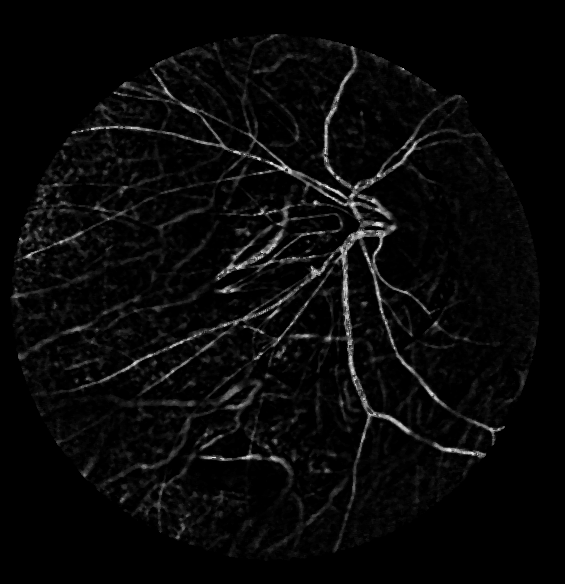

241 0


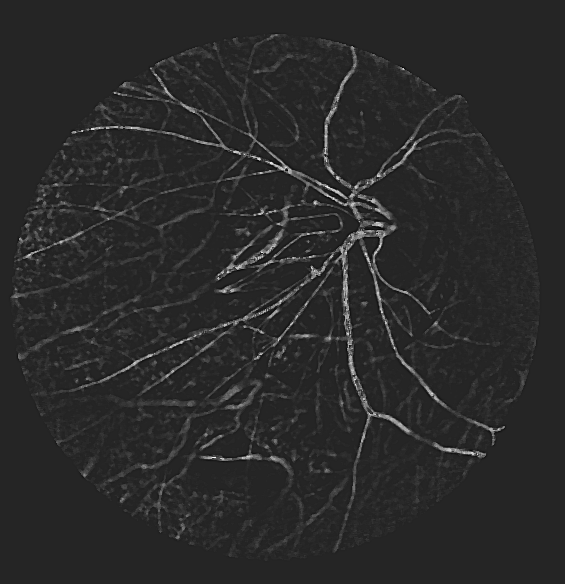

[50.32994486679214, 98.81927527746141, 255.0]


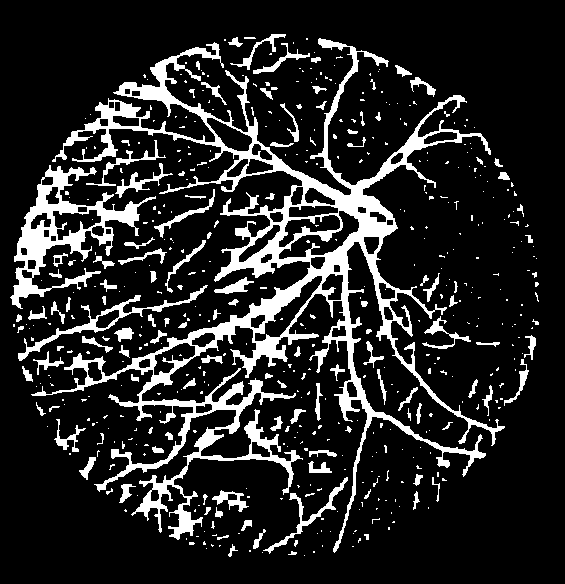

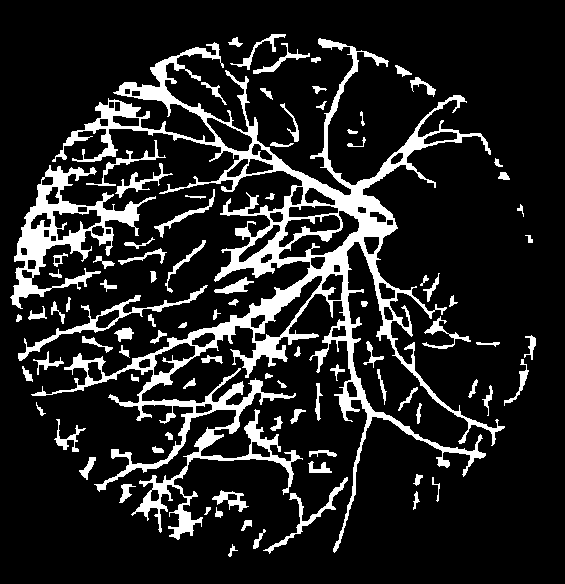

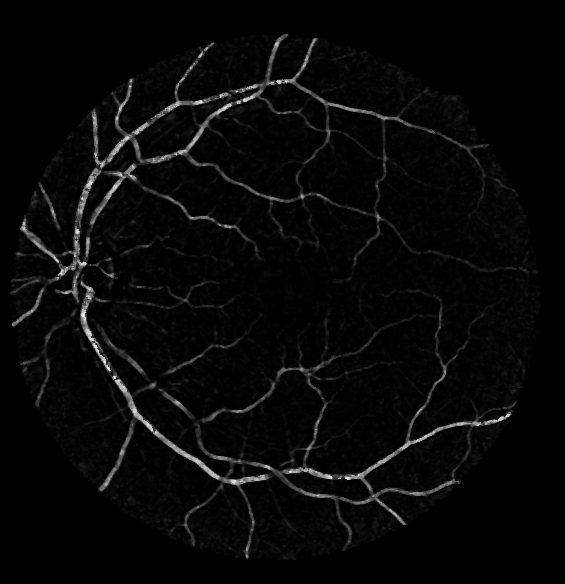

239 0


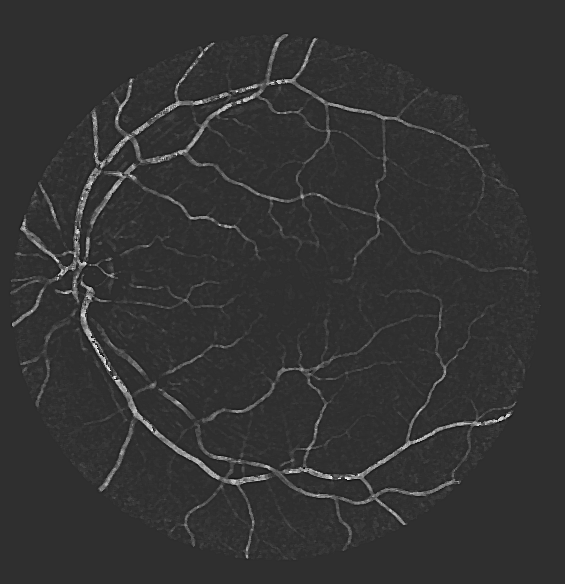

[64.1547220116452, 111.952582999441, 252.76467627279084]


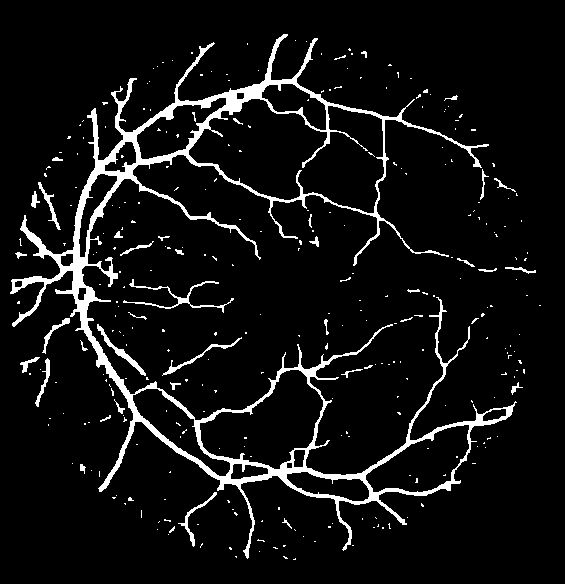

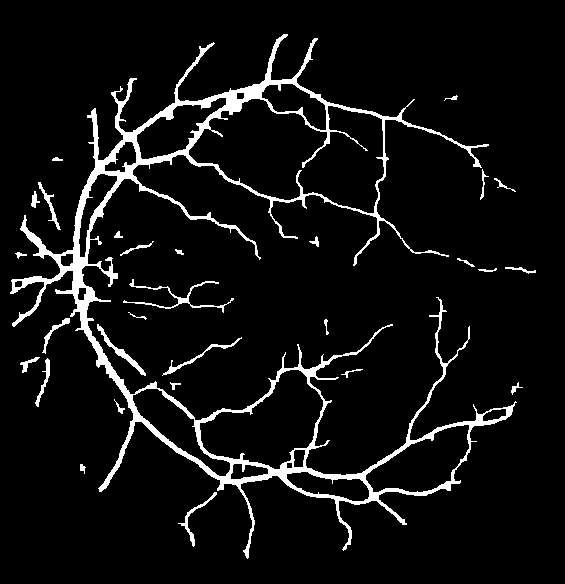

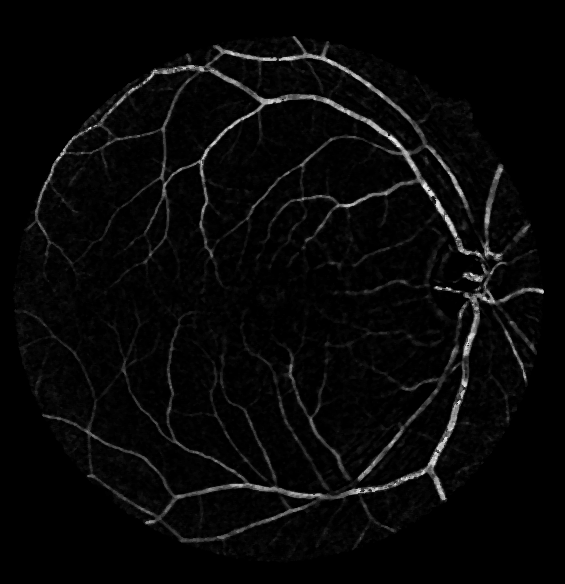

244 0


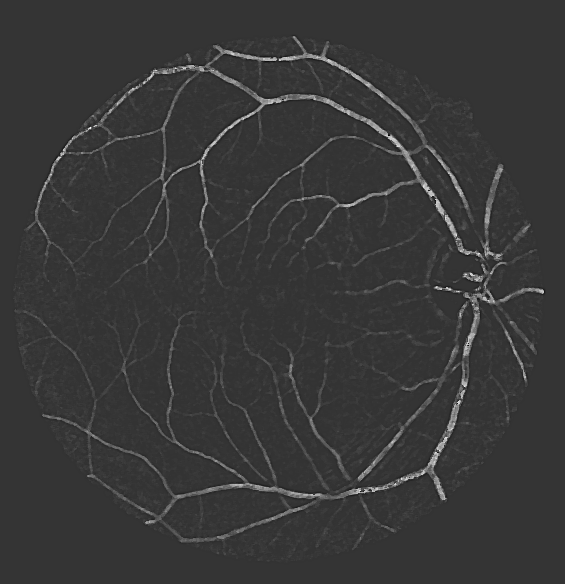

[68.048796018005, 115.8035604318838, 243.87242450304134]


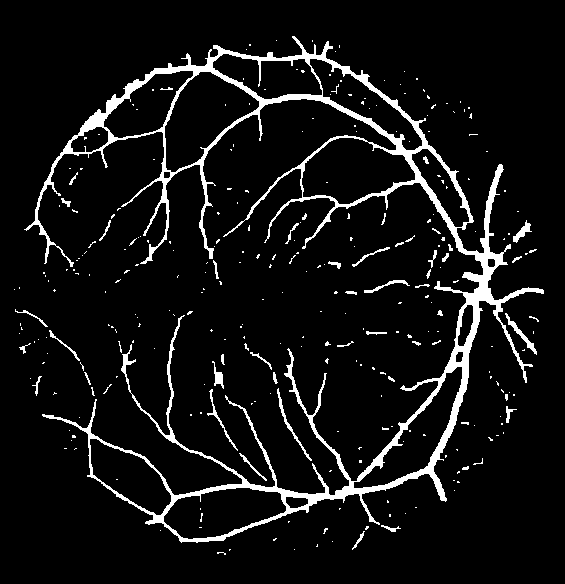

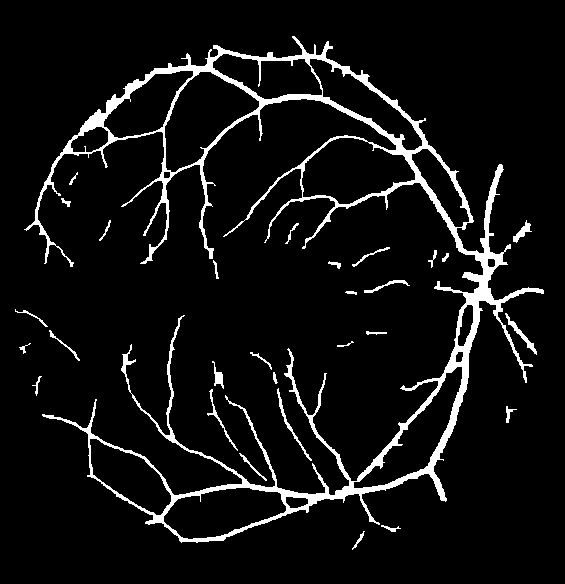

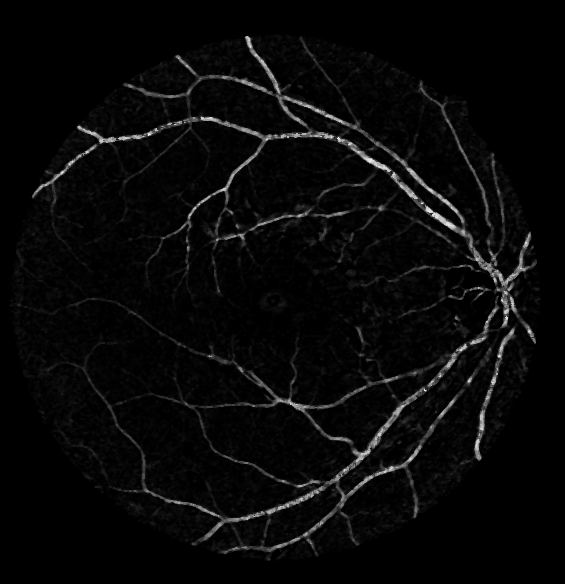

244 0


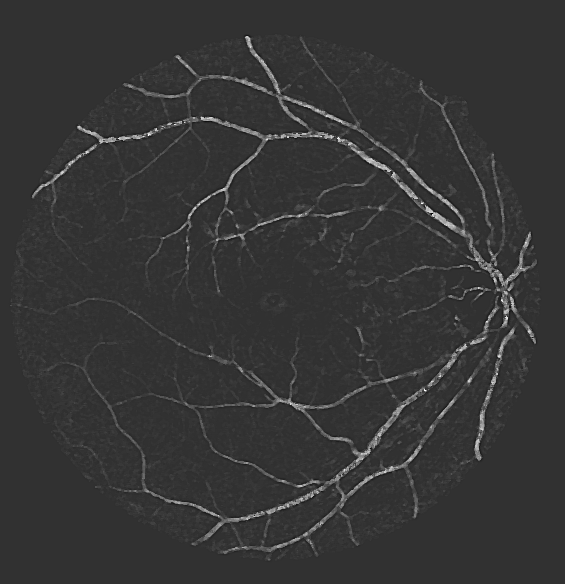

[65.22838001166171, 114.97997152232702, 254.44085681172]


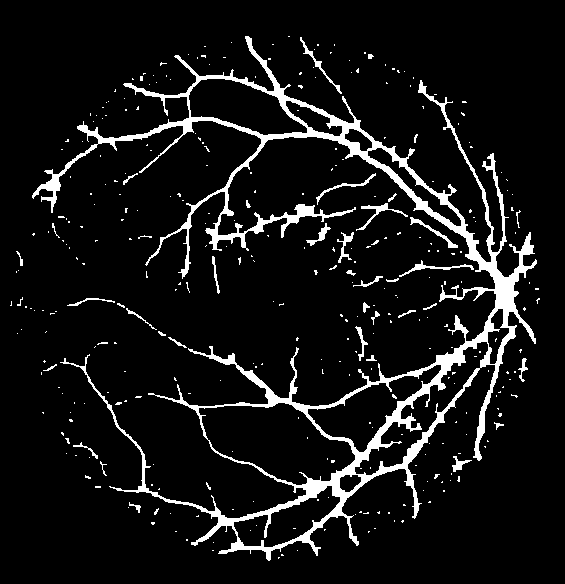

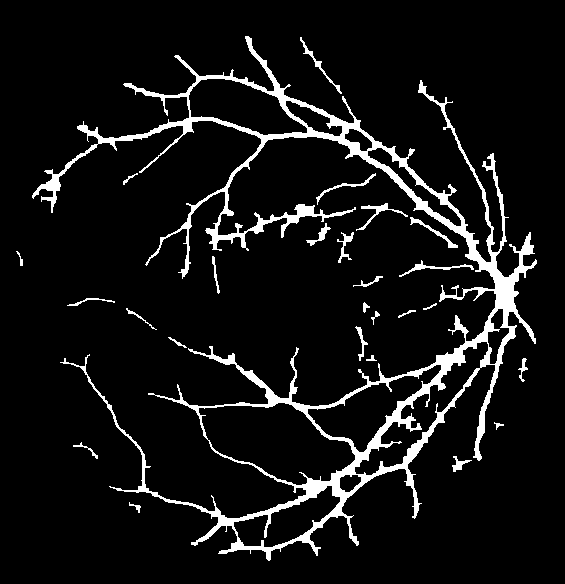

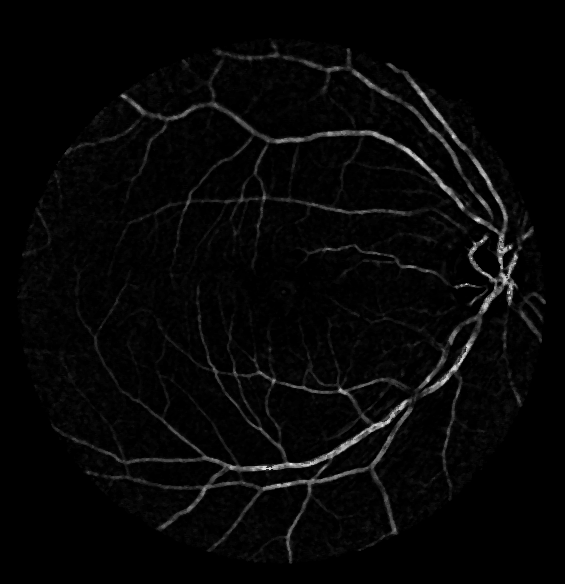

230 0


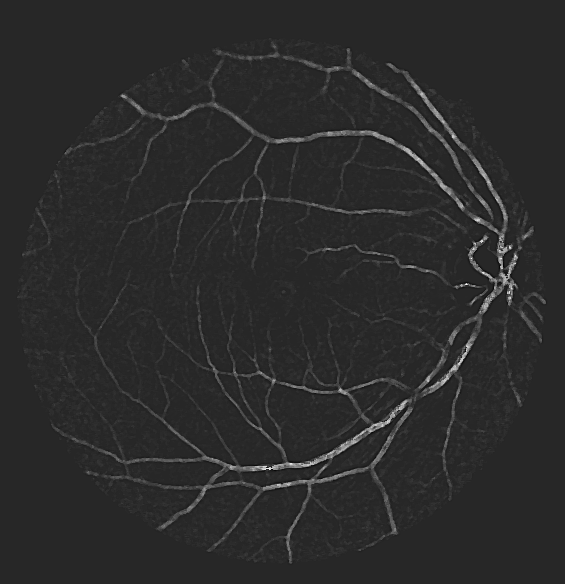

[57.38251992864449, 112.8572875863979, 247.6981161795272]


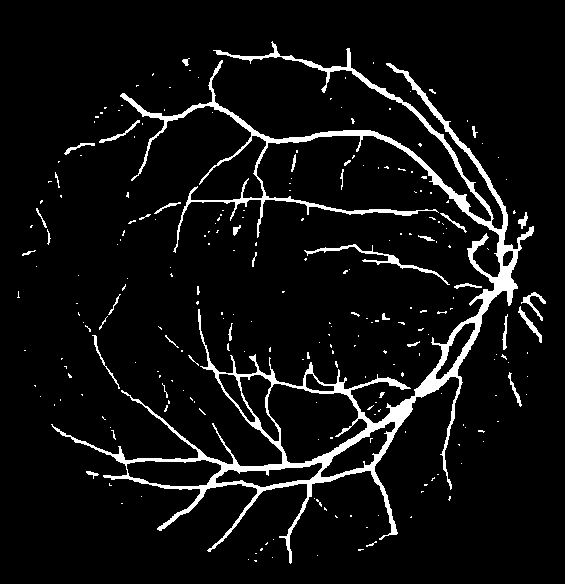

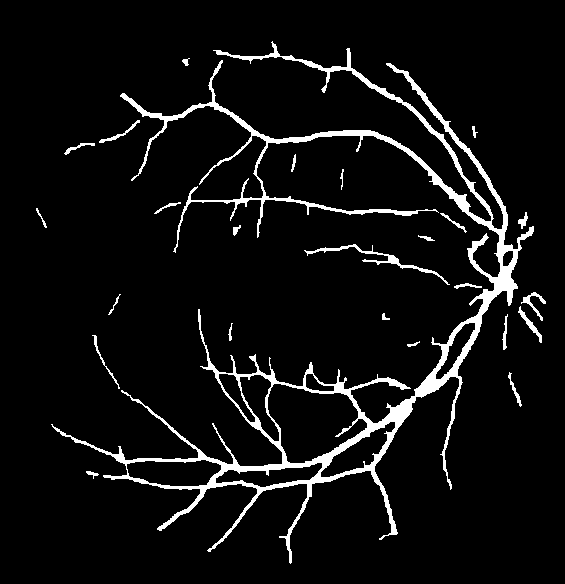

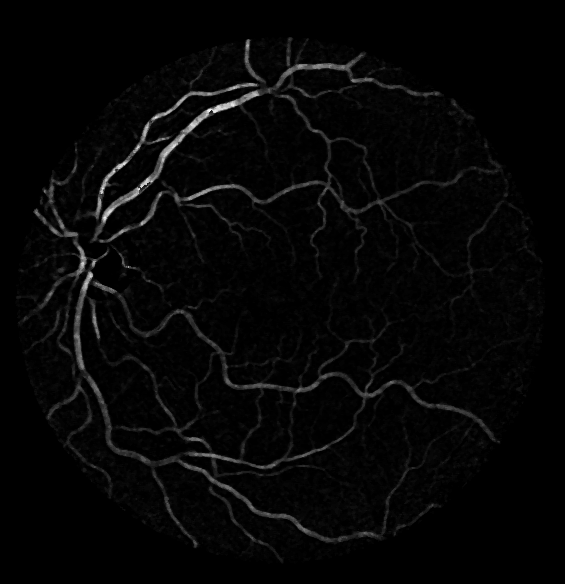

249 0


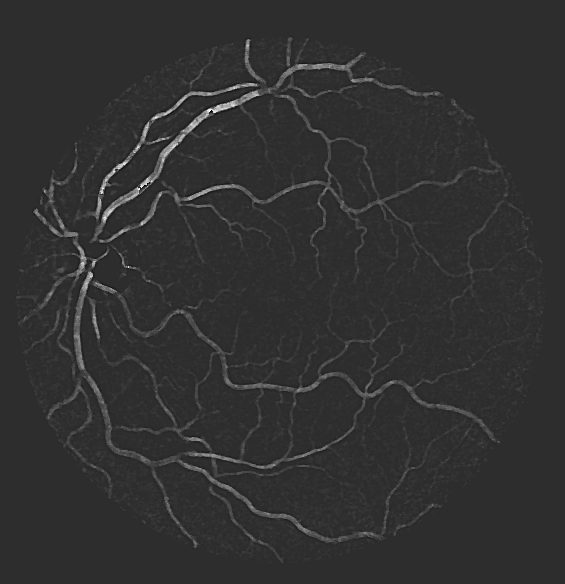

[62.00925083650481, 115.95618417731401, 255.0]


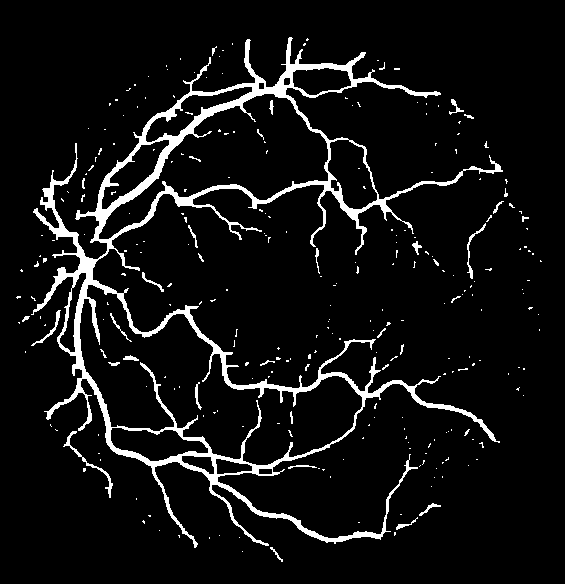

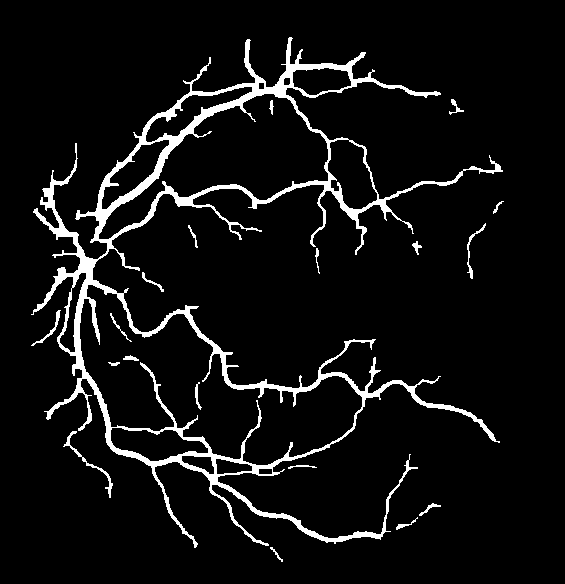

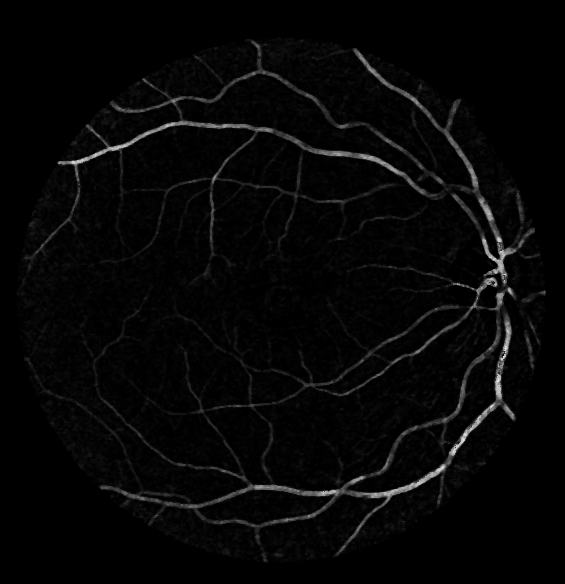

233 0


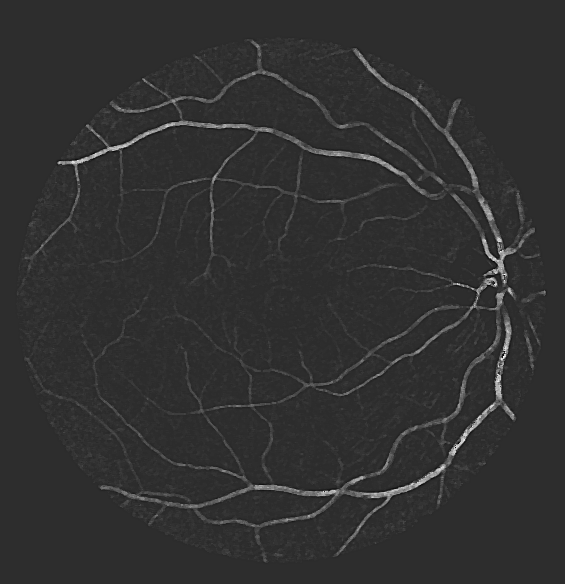

[61.116885515737636, 108.90062557837399, 255.0]


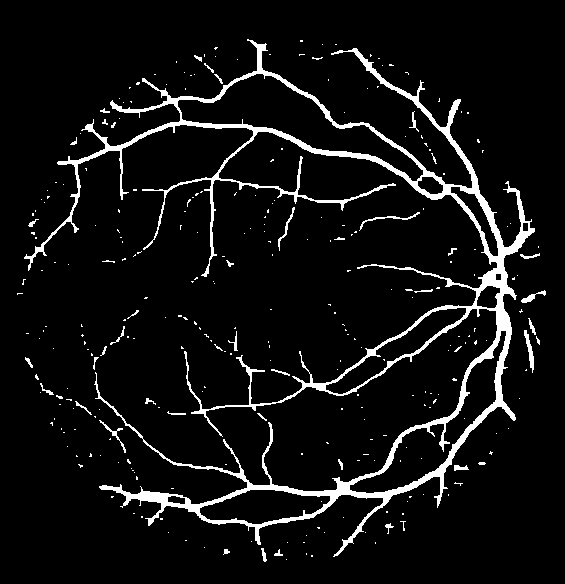

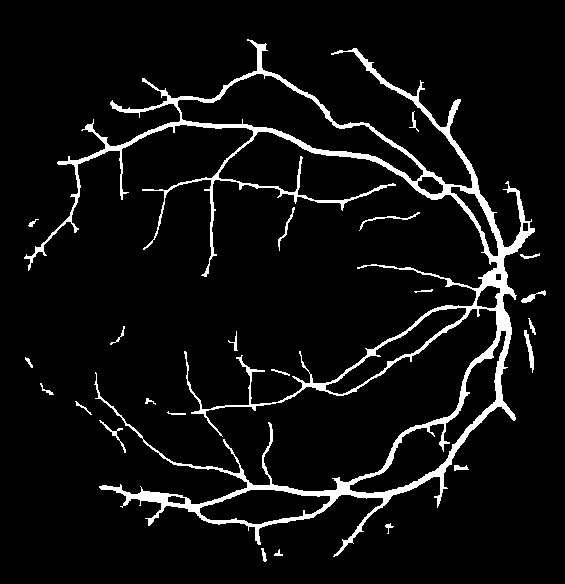

In [ ]:
from copy import deepcopy
import numpy as np
from math import gamma
from scipy.special import xlogy
from scipy.signal import convolve2d 

diazEtAlList=[]
for i in range(len(X_data_method2)):
  np.random.seed(0)
  diazEtal = diazEtAl(X_data_method2[i],mask_data_method2[i])
  diazEtAlList.append(diazEtal)
  cv2_imshow(diazEtal)
  # break


In [ ]:
from sklearn.metrics import confusion_matrix

results=[]
for idx,data in enumerate(train_y):
  result=[]
  result.append(data.split('/')[-1].split('_')[0])
  np.random.seed(0)

  imageTrue = read_gif(data)
  imageTrue=cv2.cvtColor(imageTrue,cv2.COLOR_BGR2GRAY)/255
  #TODO our prediction
  imagePredict=diazEtAlList[idx].astype(int)/255
  
  print(result[0])
  tn, fp, fn, tp = confusion_matrix(imageTrue.reshape(-1), imagePredict.reshape(-1)).ravel()
  specificity = tn / (tn+fp)
  sensitivity= tp/(tp+fn)
  accuraccy=(tp+tn)/(tp+tn+fp+fn)
  dice= 2*np.sum(imagePredict*imageTrue)/(np.sum(imageTrue)+ np.sum(imagePredict))

  result.append(specificity)
  result.append(sensitivity)
  result.append(accuraccy)
  result.append(dice)
  results.append(result)

21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40


In [ ]:
import numpy as np
from tabulate import tabulate

header=['Image','Specificity','Sensitivity','Accuracy','Dice']
# tabulate data
tableList=results.append(['Average']+list(np.mean(np.array(results)[:,1:].astype(float),axis=0)))
table = tabulate(results, tablefmt="fancy_grid",headers=header)

# output
print(table)


╒═════════╤═══════════════╤═══════════════╤════════════╤══════════╕
│ Image   │   Specificity │   Sensitivity │   Accuracy │     Dice │
╞═════════╪═══════════════╪═══════════════╪════════════╪══════════╡
│ 21      │      0.993027 │      0.651837 │   0.967529 │ 0.750023 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 22      │      0.99339  │      0.581368 │   0.956167 │ 0.705576 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 23      │      0.925937 │      0.716015 │   0.912117 │ 0.517552 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 24      │      0.995674 │      0.543488 │   0.943284 │ 0.689487 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 25      │      0.99246  │      0.510057 │   0.94616  │ 0.645204 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 26      │      0.984629 │      0.579154 │   0.950746 │ 0.662752 │
├─────────┼───────────────┼───────────────┼─────

#Method-2 Farko

In [ ]:
import math
def get_gaussian_filter(sgementLength, sigma,orientation,derivative):
  
  
  kernelSize=math.ceil(np.sqrt((6*(math.ceil(sigma))+1)**2 + sgementLength**2))
  gaussianFilter=np.zeros((kernelSize,kernelSize))

  halfKernel = round((kernelSize - 1) / 2);
  row=0


  for j in range(halfKernel,-halfKernel,-1):
    col=0

    for i in range(-halfKernel,halfKernel,1):
      xRotated= i*np.cos(orientation)+j*np.sin(orientation)
      yRotated= -i*np.sin(orientation)+j*np.cos(orientation)
      if abs(xRotated) > 3.5*math.ceil(sigma):
        gaussianFilter[row,col] = 0
      elif abs(yRotated) > (sgementLength-1) / 2:
        gaussianFilter[row,col] = 0
      else:
        gaussianFilter[row,col] = -np.exp(-.5*np.power((xRotated/sigma),2))/(np.sqrt(2*np.pi)*sigma)
        if derivative:
         gaussianFilter[row,col]*=xRotated/(sigma**2)  

      col+=1
    
    row +=1

  ##subtract mean               
        
  return gaussianFilter

from scipy.signal import convolve2d 

def matched_filter(img, segmentLength,sigma,rotationStep,weighted_coefficient):

  matchedFilterBank=np.zeros((img.shape[0],img.shape[1],int(180/rotationStep)+1))
  gaussianDerivativeBank=np.zeros((img.shape[0],img.shape[1],int(180/rotationStep)+1))

  i=0
  for theta in np.arange(0,np.pi,rotationStep*np.pi/180):
      #Get matched Filter
    matchedFilter=get_gaussian_filter(segmentLength,sigma,theta,False)
    mean=np.sum(matchedFilter.reshape(-1))/np.sum(matchedFilter.reshape(-1)<0)
    matchedFilter[matchedFilter<0]=matchedFilter[matchedFilter<0]- mean
    
    #Get gaussian Derivative
    gaussianDerivativeFilter=get_gaussian_filter(segmentLength,sigma,theta,True)

    matchedFilterBank[:,:,i]=convolve2d(img,matchedFilter,mode='same')

    gaussianDerivativeBank[:,:,i]=convolve2d(img,gaussianDerivativeFilter,mode='same')
    i+=1

  matchedFilterMax= np.amax(matchedFilterBank, 2)
  gaussianFilterMax=np.amax(gaussianDerivativeBank, 2)
  # cv2_imshow(matchedFilterMax)

  # Ienhanced=(matchedFilterMax-matchedFilterMax.min())/matchedFilterMax.max()
  # Ienhanced*=255
  # Ienhanced=(Ienhanced-Ienhanced.min())/Ienhanced.max()
  # Ienhanced*=255
  # print(Ienhanced.max())

  # cv2_imshow(Ienhanced)


  # #MCET-HHO
  # histogram, bin_edges = np.histogram(Ienhanced, bins=256, range=(0, 255))
  # histogram=histogram/(Ienhanced.shape[0]*Ienhanced.shape[1])
  # histogram[0]=0
  # hho=BaseHHO(30,250,3,histogram)
  # gbest,_=hho.train()
  

  # gbest[gbest<0]=0
  # gbest[gbest>255]=255
  # th=sorted(gbest)

  # Ienhanced[Ienhanced>th[2]]=0
  # Ienhanced[Ienhanced<th[0]]=0
  # Ienhanced[Ienhanced!=0]=255
  
  # cv2_imshow(Ienhanced)

  gaussianMaxBlur=cv2.blur(gaussianFilterMax,(31,31))
  # cv2_imshow(gaussianMaxBlur)
  

  gaussianMaxBlur=(gaussianMaxBlur-gaussianMaxBlur.min())/gaussianMaxBlur.max()

  weight=np.mean(matchedFilterMax)*weighted_coefficient
  
  gaussianFinal=weight*(1+ gaussianMaxBlur)
  # cv2_imshow(gaussianFinal)
  
  return (matchedFilterMax>=gaussianFinal).astype('uint8')*255

In [ ]:
def farko_method(data): 
  image = cv2.imread(data[0])
  imageGreen=image[:,:,1]
  #Create mask if not available
  # mask=image[:,:,1]>=20
  # mask=mask.astype(int)
  print(data)
  
  maskImg=read_gif(mask[1])
  maskImg=cv2.cvtColor(maskImg, cv2.COLOR_BGR2GRAY)/255
  
  erosionKernel=morphology.disk(3)
  
  erodedMask=cv2.erode(maskImg, erosionKernel, iterations=2)
  
  # cv2_imshow(imageGreen)


  #histogram Eq adaptive
  clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  clacheImg= clahe.apply(imageGreen)
  # cv2_imshow(clacheImg)
  
  # Remove black ring
  replaceBlackRing=imageGreen*erodedMask
  meanImage=np.mean(replaceBlackRing)
  replaceBlackRing[replaceBlackRing==0]=meanImage
  
  #Top hat
  imgComplement=255-replaceBlackRing
  # cv2_imshow(imgComplement)
  
  topHatedImg=top_hat(imgComplement,10)*erodedMask
  # cv2_imshow(topHatedImg)
  topHatedImg = topHatedImg.astype('uint8')

  #Otsu
  ret, thresh1 = cv2.threshold(topHatedImg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)  
  
  thresh1=thresh1*erodedMask.astype('uint8')

  # cv2_imshow(thresh1)
  
  #Cleaning small objects less than 100
  cleaned = morphology.remove_small_objects(thresh1.astype(bool), min_size=100, connectivity=8)

  cleanedImg=cleaned.astype('uint8')*255

  # cv2_imshow(cleanedImg)

  #is it close the min pixel(backgorund) or to the max pixel(vessel)
  filteredImage=np.abs(imgComplement-imgComplement.max())<np.abs(imgComplement-meanImage)
  filteredImage=filteredImage.astype('uint8')*cleanedImg
  # cv2_imshow(filteredImage)

  medianCleaned = cv2.medianBlur(cleanedImg, 3)
  # cv2_imshow(medianCleaned)

  filteredImage=cv2.bitwise_or(medianCleaned,filteredImage)
  # filteredImage
  # cv2_imshow(filteredImage)



  #finding thin vessels
  thinVessels=matched_filter(clacheImg,4,1,7,2.3)

  cv2_imshow(thinVessels)

  closingKernel=np.ones((3,3))
  closedThinVessels=morphology.binary_closing(thinVessels,closingKernel)
  # cv2_imshow(closedThinVessels.astype(int)*255)

  cleanedThin = morphology.remove_small_objects(closedThinVessels.astype(bool), min_size=30, connectivity=8)

  # cleanedThin=cleanedThin.astype('uint8')*255
  # cv2_imshow(cleanedThin)
  
  finalKernael=np.ones((3,3))
  finalKernael[1,1]=0
  finalConv=convolve2d(cleanedThin.astype('uint8'),finalKernael,mode='same')
  finalImage=(finalConv>0).astype('uint8')*filteredImage.astype('uint8')*erodedMask
  
  # erodedMask=cv2.erode(erodedMask, erosionKernel, iterations=1)
  finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,finalImage.astype('uint8'))*erodedMask
  
  # finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,filteredImage.astype('uint8'))*erodedMask
  
  
  # cv2_imshow(finalImage.astype(int))
  return finalImage

def farko_method_2(image,maskImg): 
  imageGreen=image[:,:,1]
  #Create mask if not available
  # mask=image[:,:,1]>=20
  # mask=mask.astype(int)
  # print(data)
  
  # maskImg=read_gif(mask[1])
  
  maskImg=cv2.cvtColor(maskImg, cv2.COLOR_BGR2GRAY)/255
  
  erosionKernel=morphology.disk(3)
  
  erodedMask=cv2.erode(maskImg, erosionKernel, iterations=2)
  
  # cv2_imshow(imageGreen)


  #histogram Eq adaptive
  clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  clacheImg= clahe.apply(imageGreen)
  # cv2_imshow(clacheImg)
  
  # Remove black ring
  replaceBlackRing=imageGreen*erodedMask
  meanImage=np.mean(replaceBlackRing)
  replaceBlackRing[replaceBlackRing==0]=meanImage
  
  #Top hat
  imgComplement=255-replaceBlackRing
  # cv2_imshow(imgComplement)
  
  topHatedImg=top_hat(imgComplement,10)*erodedMask
  # cv2_imshow(topHatedImg)
  topHatedImg = topHatedImg.astype('uint8')

  #Otsu
  ret, thresh1 = cv2.threshold(topHatedImg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)  
  
  thresh1=thresh1*erodedMask.astype('uint8')

  # cv2_imshow(thresh1)
  
  #Cleaning small objects less than 100
  cleaned = morphology.remove_small_objects(thresh1.astype(bool), min_size=100, connectivity=8)

  cleanedImg=cleaned.astype('uint8')*255

  # cv2_imshow(cleanedImg)

  #is it close the min pixel(backgorund) or to the max pixel(vessel)
  filteredImage=np.abs(imgComplement-imgComplement.max())<np.abs(imgComplement-meanImage)
  filteredImage=filteredImage.astype('uint8')*cleanedImg
  # cv2_imshow(filteredImage)

  medianCleaned = cv2.medianBlur(cleanedImg, 3)
  # cv2_imshow(medianCleaned)

  filteredImage=cv2.bitwise_or(medianCleaned,filteredImage)
  # filteredImage
  # cv2_imshow(filteredImage)



  #finding thin vessels
  thinVessels=matched_filter(clacheImg,4,1,7,2.3)

  cv2_imshow(thinVessels)

  closingKernel=np.ones((3,3))
  closedThinVessels=morphology.binary_closing(thinVessels,closingKernel)
  # cv2_imshow(closedThinVessels.astype(int)*255)

  cleanedThin = morphology.remove_small_objects(closedThinVessels.astype(bool), min_size=30, connectivity=8)

  # cleanedThin=cleanedThin.astype('uint8')*255
  # cv2_imshow(cleanedThin)
  
  finalKernael=np.ones((3,3))
  finalKernael[1,1]=0
  finalConv=convolve2d(cleanedThin.astype('uint8'),finalKernael,mode='same')
  finalImage=(finalConv>0).astype('uint8')*filteredImage.astype('uint8')*erodedMask
  
  # erodedMask=cv2.erode(erodedMask, erosionKernel, iterations=1)
  finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,finalImage.astype('uint8'))*erodedMask
  
  # finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,filteredImage.astype('uint8'))*erodedMask
  
  
  # cv2_imshow(finalImage.astype(int))
  return finalImage

def farko_method_noMask(image): 
  imageGreen=image[:,:,1]
  #Create mask if not available
  # mask=image[:,:,1]>=20
  # mask=mask.astype(int)
  # print(data)
  
  # maskImg=read_gif(mask[1])
  # maskImg=cv2.cvtColor(maskImg, cv2.COLOR_BGR2GRAY)/255
  
  # cv2_imshow(imageGreen)


  #histogram Eq adaptive
  clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))
  clacheImg= clahe.apply(imageGreen)
  # cv2_imshow(clacheImg)
  
  # Remove black ring
  replaceBlackRing=imageGreen
  meanImage=np.mean(replaceBlackRing)
  replaceBlackRing[replaceBlackRing==0]=meanImage
  
  #Top hat
  imgComplement=255-replaceBlackRing
  # cv2_imshow(imgComplement)
  
  topHatedImg=top_hat(imgComplement,10)
  # cv2_imshow(topHatedImg)
  topHatedImg = topHatedImg.astype('uint8')

  #Otsu
  ret, thresh1 = cv2.threshold(topHatedImg, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)  
  
  thresh1=thresh1

  # cv2_imshow(thresh1)
  
  #Cleaning small objects less than 100
  cleaned = morphology.remove_small_objects(thresh1.astype(bool), min_size=100, connectivity=8)

  cleanedImg=cleaned.astype('uint8')*255

  # cv2_imshow(cleanedImg)

  #is it close the min pixel(backgorund) or to the max pixel(vessel)
  filteredImage=np.abs(imgComplement-imgComplement.max())<np.abs(imgComplement-meanImage)
  filteredImage=filteredImage.astype('uint8')*cleanedImg
  # cv2_imshow(filteredImage)

  medianCleaned = cv2.medianBlur(cleanedImg, 3)
  # cv2_imshow(medianCleaned)

  filteredImage=cv2.bitwise_or(medianCleaned,filteredImage)
  # filteredImage
  # cv2_imshow(filteredImage)



  #finding thin vessels
  thinVessels=matched_filter(clacheImg,4,1,7,2.3)

  cv2_imshow(thinVessels)

  closingKernel=np.ones((3,3))
  closedThinVessels=morphology.binary_closing(thinVessels,closingKernel)
  # cv2_imshow(closedThinVessels.astype(int)*255)

  cleanedThin = morphology.remove_small_objects(closedThinVessels.astype(bool), min_size=30, connectivity=8)

  # cleanedThin=cleanedThin.astype('uint8')*255
  # cv2_imshow(cleanedThin)
  
  finalKernael=np.ones((3,3))
  finalKernael[1,1]=0
  finalConv=convolve2d(cleanedThin.astype('uint8'),finalKernael,mode='same')
  finalImage=(finalConv>0).astype('uint8')*filteredImage.astype('uint8')
  
  # erodedMask=cv2.erode(erodedMask, erosionKernel, iterations=1)
  finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,finalImage.astype('uint8'))
  
  # finalImage=cv2.bitwise_or(cleanedThin.astype('uint8')*255,filteredImage.astype('uint8'))*erodedMask
  
  
  # cv2_imshow(finalImage.astype(int))
  return finalImage

('/content/DRIVE/training/images/24_training.tif', '/content/DRIVE/training/mask/24_training_mask.gif')


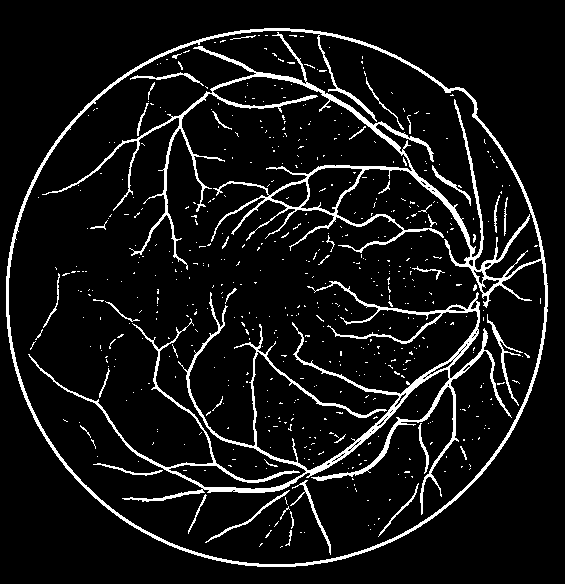

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# np.random.seed(0)
# farko_method(('/content/DRIVE/training/images/24_training.tif', '/content/DRIVE/training/mask/24_training_mask.gif'))

('/content/DRIVE/training/images/21_training.tif', '/content/DRIVE/training/mask/21_training_mask.gif')


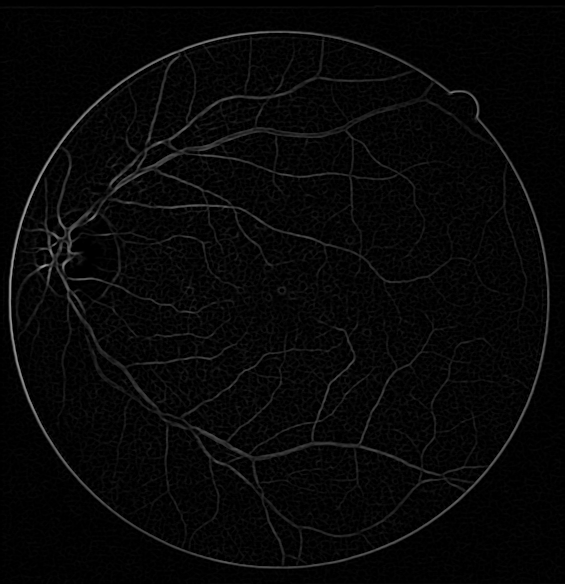

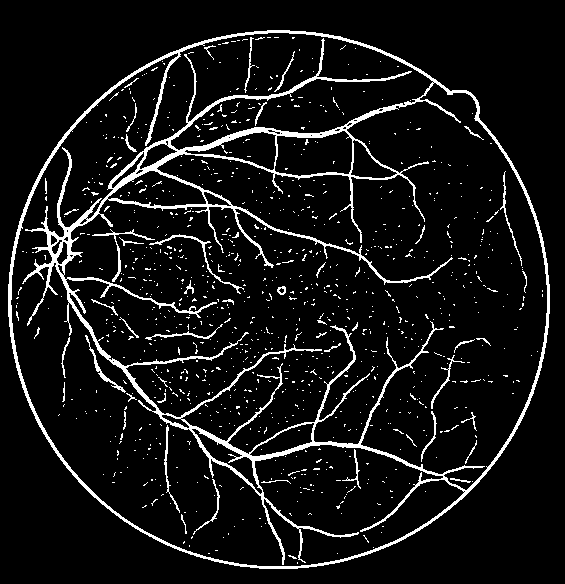

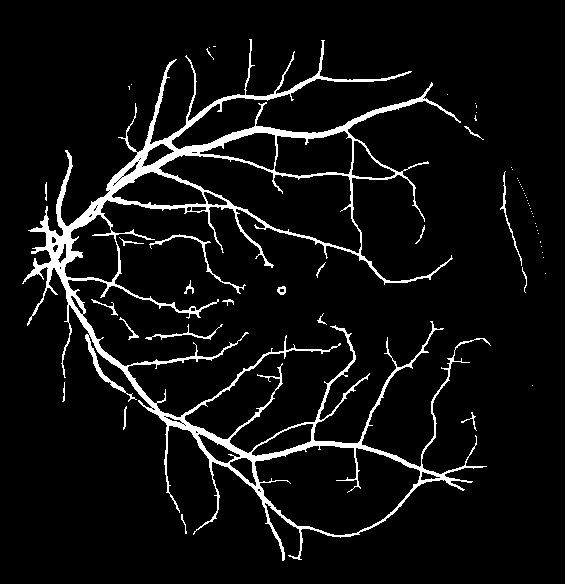

In [ ]:
farkoMethodPredictionList=[]
for data in zip(train_x,mask):
  np.random.seed(0)
  finalImage=farko_method(data)
  cv2_imshow(finalImage.astype(int))
  farkoMethodPredictionList.append(finalImage)
  break

In [ ]:
from sklearn.metrics import confusion_matrix
from copy import deepcopy
import numpy as np
from math import gamma
from scipy.special import xlogy


results=[]
for idx,data in enumerate(train_y):
  result=[]
  result.append(data.split('/')[-1].split('_')[0])
  
  imageTrue = read_gif(data)
  imageTrue=cv2.cvtColor(imageTrue,cv2.COLOR_BGR2GRAY)/255
  #TODO our prediction
  np.random.seed(0)

  imagePredict=farkoMethodPredictionList[idx].astype(int)/255
  
  tn, fp, fn, tp = confusion_matrix(imageTrue.reshape(-1), imagePredict.reshape(-1)).ravel()
  specificity = tn / (tn+fp)
  sensitivity= tp/(tp+fn)
  accuraccy=(tp+tn)/(tp+tn+fp+fn)
  dice= 2*np.sum(imagePredict*imageTrue)/(np.sum(imageTrue)+ np.sum(imagePredict))

  result.append(specificity)
  result.append(sensitivity)
  result.append(accuraccy)
  result.append(dice)

  results.append(result)

In [ ]:
import numpy as np
from tabulate import tabulate

header=['Image','Specificity','Sensitivity','Accuracy','Dice']
# tabulate data
tableList=results.append(['Average']+list(np.mean(np.array(results)[:,1:].astype(float),axis=0)))
table = tabulate(results, tablefmt="fancy_grid",headers=header)

# output
print(table)


╒═════════╤═══════════════╤═══════════════╤════════════╤══════════╕
│ Image   │   Specificity │   Sensitivity │   Accuracy │     Dice │
╞═════════╪═══════════════╪═══════════════╪════════════╪══════════╡
│ 21      │      0.988922 │      0.718509 │   0.968714 │ 0.774395 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 22      │      0.990298 │      0.661914 │   0.960632 │ 0.752345 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 23      │      0.960981 │      0.760622 │   0.947791 │ 0.657331 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 24      │      0.99251  │      0.583745 │   0.945151 │ 0.711494 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 25      │      0.99005  │      0.571347 │   0.949864 │ 0.686276 │
├─────────┼───────────────┼───────────────┼────────────┼──────────┤
│ 26      │      0.975151 │      0.734849 │   0.95507  │ 0.732154 │
├─────────┼───────────────┼───────────────┼─────

In [ ]:
def load_test(path):
    """ X = Images and Y = masks """

    test_x = sorted(glob(os.path.join(path, "test", "images", "*.tif")))
    mask = sorted(glob(os.path.join(path, "test", "mask", "*.gif")))


    return test_x, mask

In [ ]:
test_x,test_mask=load_test('/content/DRIVE/')

('/content/DRIVE/test/images/01_test.tif', '/content/DRIVE/test/mask/01_test_mask.gif')


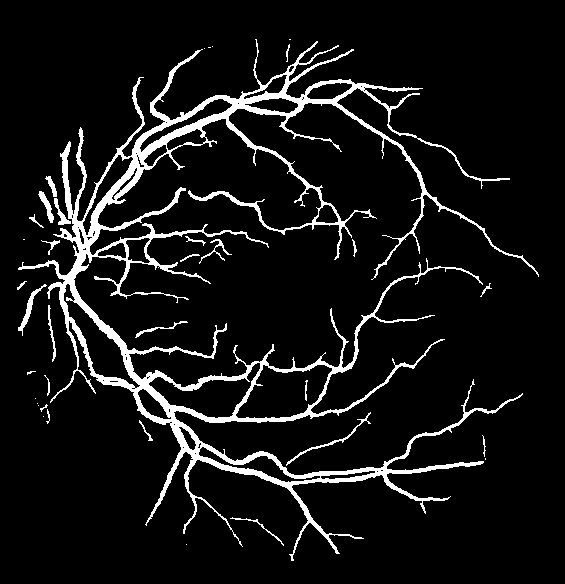

('/content/DRIVE/test/images/02_test.tif', '/content/DRIVE/test/mask/02_test_mask.gif')


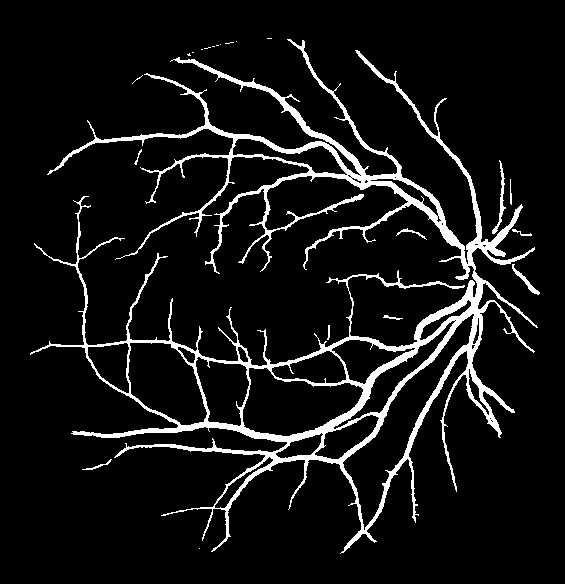

('/content/DRIVE/test/images/03_test.tif', '/content/DRIVE/test/mask/03_test_mask.gif')


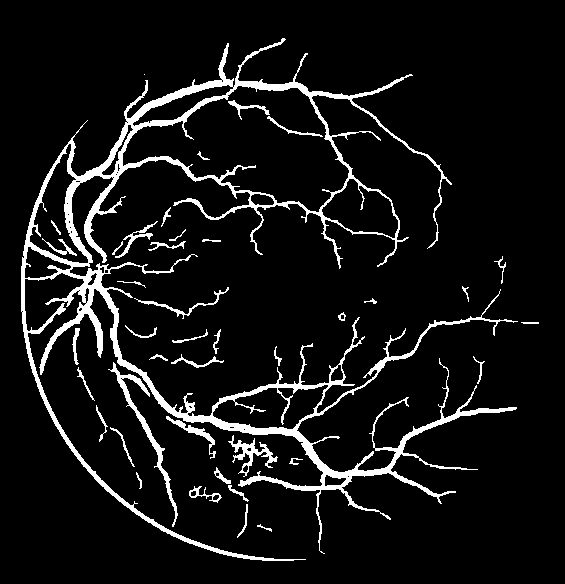

('/content/DRIVE/test/images/04_test.tif', '/content/DRIVE/test/mask/04_test_mask.gif')


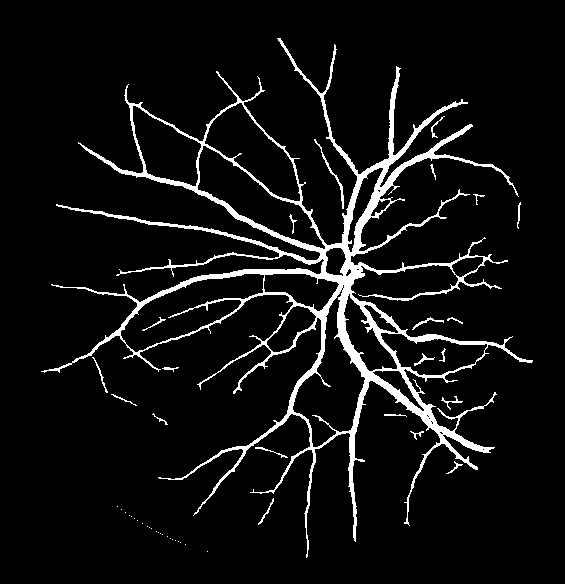

('/content/DRIVE/test/images/05_test.tif', '/content/DRIVE/test/mask/05_test_mask.gif')


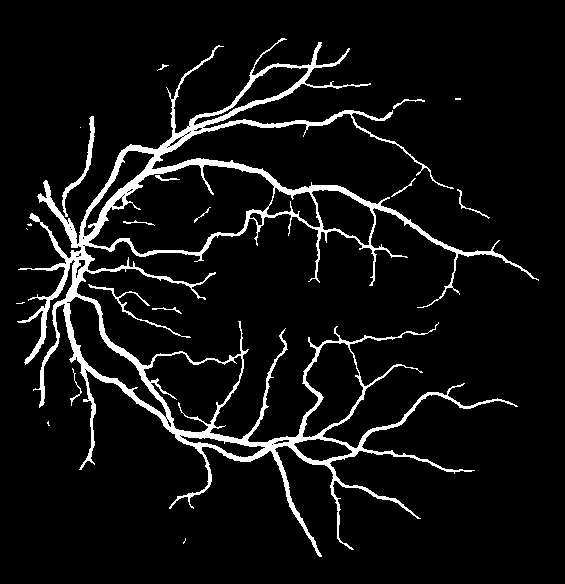

('/content/DRIVE/test/images/06_test.tif', '/content/DRIVE/test/mask/06_test_mask.gif')


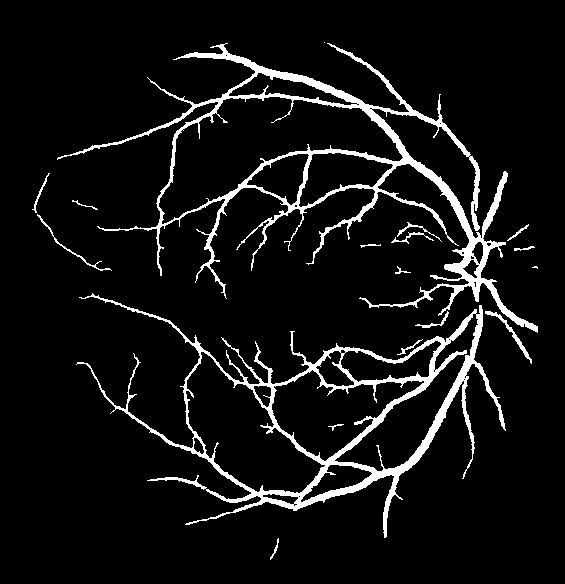

('/content/DRIVE/test/images/07_test.tif', '/content/DRIVE/test/mask/07_test_mask.gif')


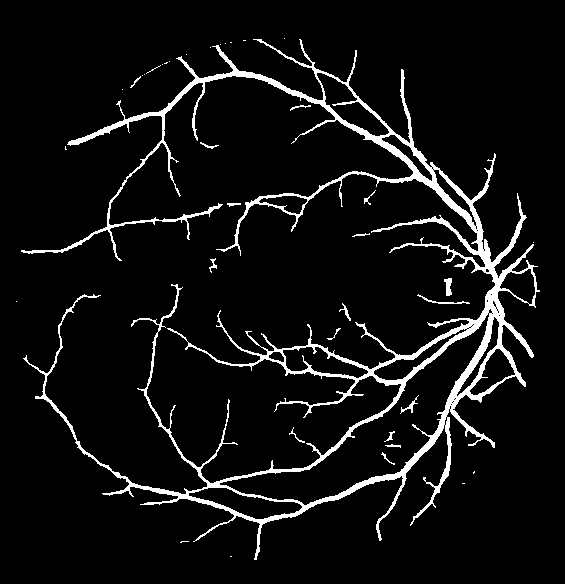

('/content/DRIVE/test/images/08_test.tif', '/content/DRIVE/test/mask/08_test_mask.gif')


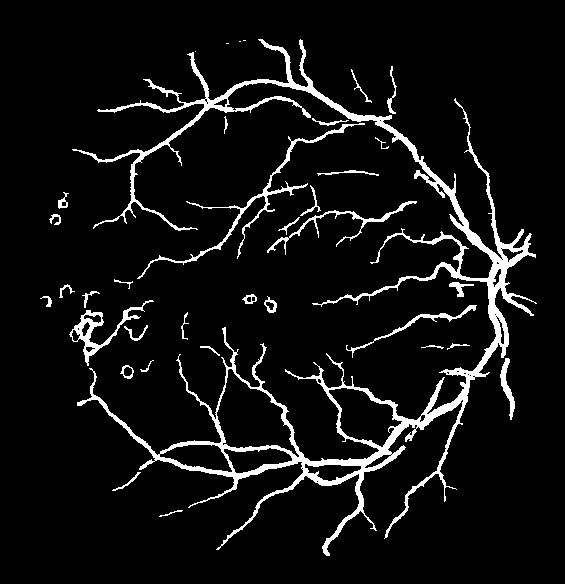

('/content/DRIVE/test/images/09_test.tif', '/content/DRIVE/test/mask/09_test_mask.gif')


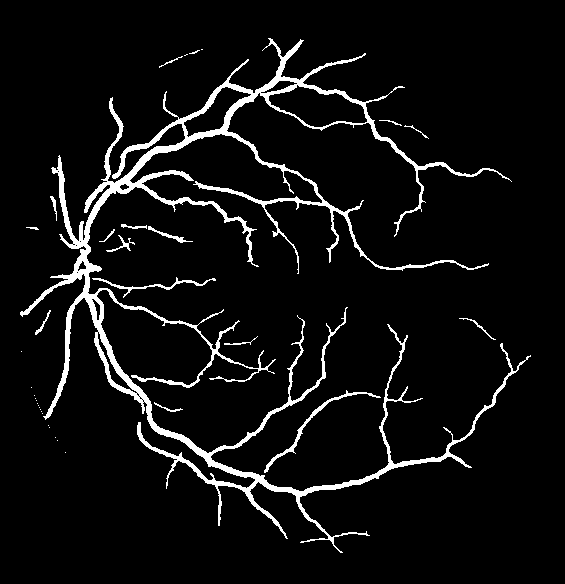

('/content/DRIVE/test/images/10_test.tif', '/content/DRIVE/test/mask/10_test_mask.gif')


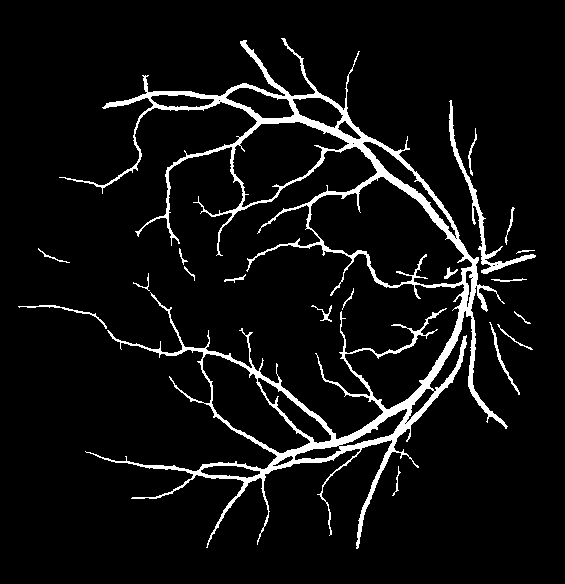

('/content/DRIVE/test/images/11_test.tif', '/content/DRIVE/test/mask/11_test_mask.gif')


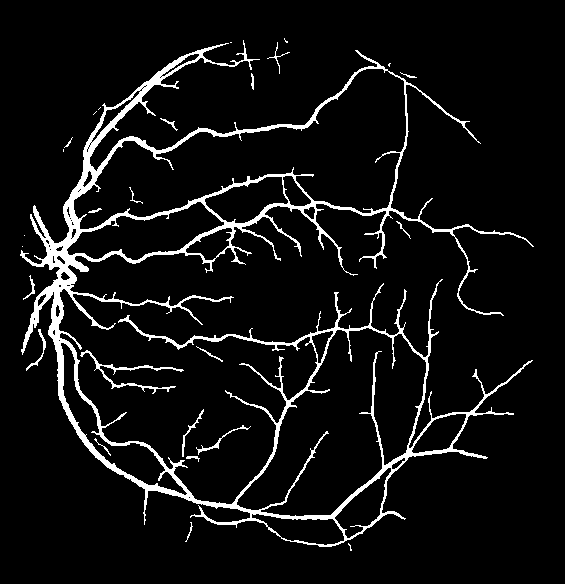

('/content/DRIVE/test/images/12_test.tif', '/content/DRIVE/test/mask/12_test_mask.gif')


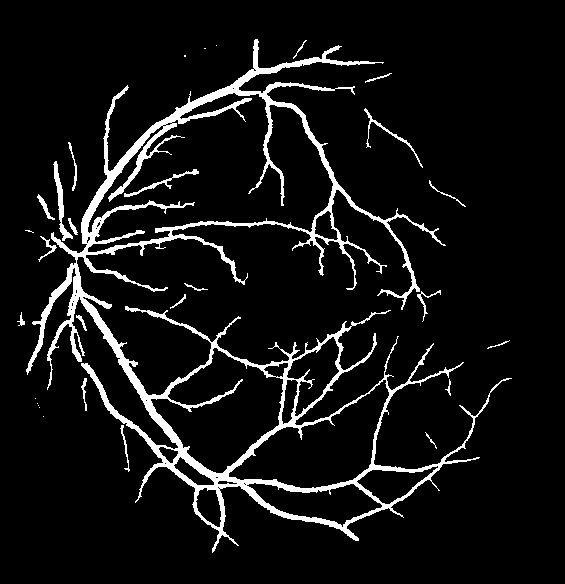

('/content/DRIVE/test/images/13_test.tif', '/content/DRIVE/test/mask/13_test_mask.gif')


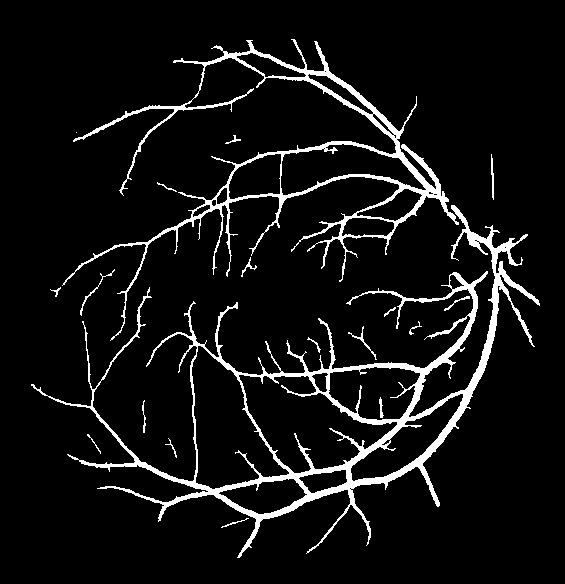

('/content/DRIVE/test/images/14_test.tif', '/content/DRIVE/test/mask/14_test_mask.gif')


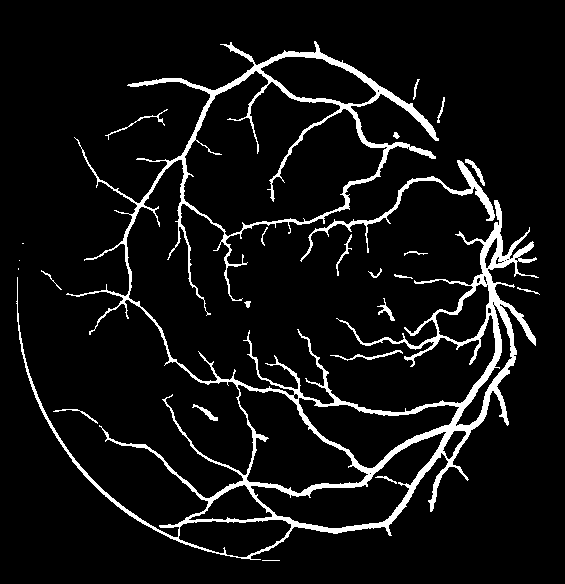

('/content/DRIVE/test/images/15_test.tif', '/content/DRIVE/test/mask/15_test_mask.gif')


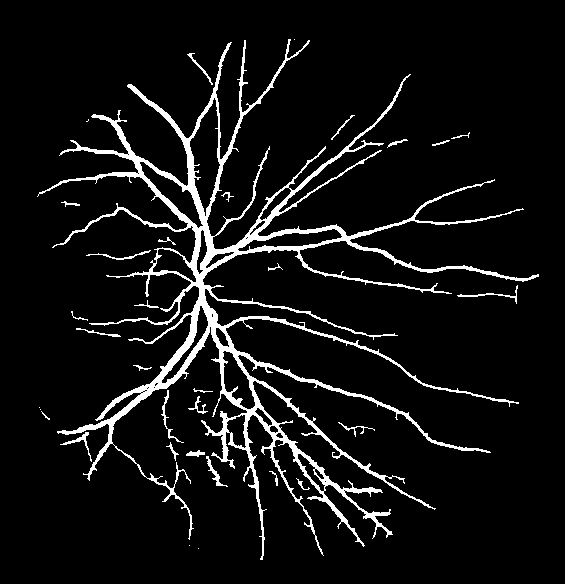

('/content/DRIVE/test/images/16_test.tif', '/content/DRIVE/test/mask/16_test_mask.gif')


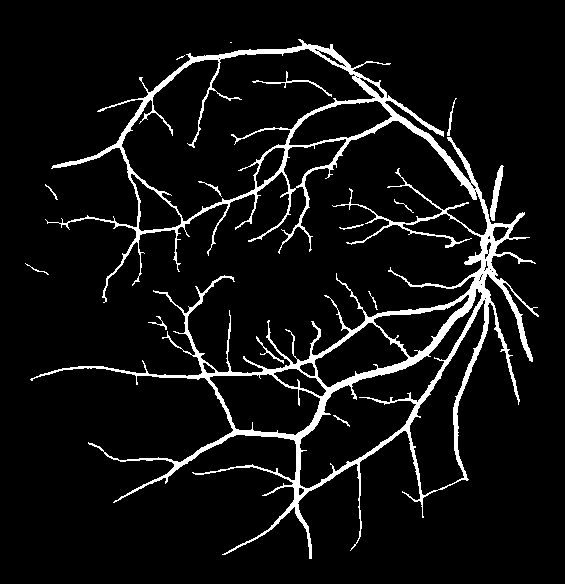

('/content/DRIVE/test/images/17_test.tif', '/content/DRIVE/test/mask/17_test_mask.gif')


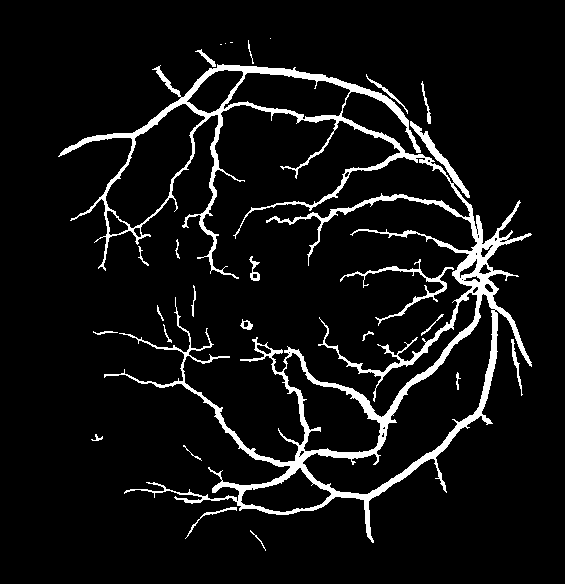

('/content/DRIVE/test/images/18_test.tif', '/content/DRIVE/test/mask/18_test_mask.gif')


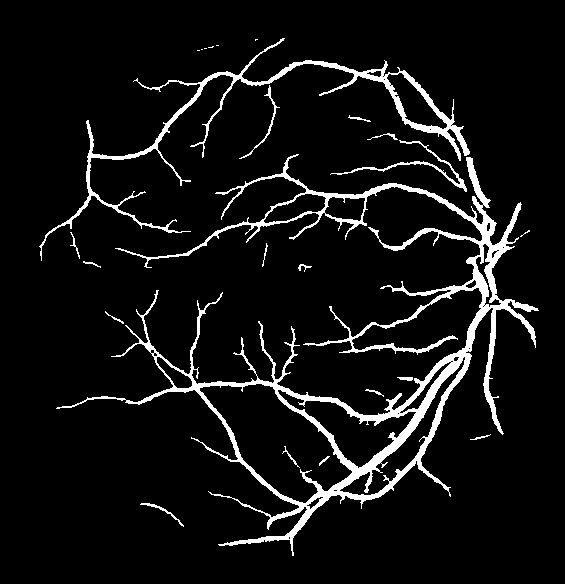

('/content/DRIVE/test/images/19_test.tif', '/content/DRIVE/test/mask/19_test_mask.gif')


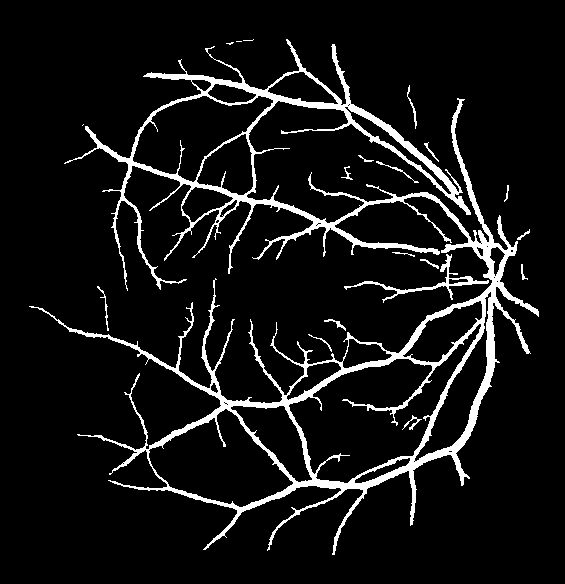

('/content/DRIVE/test/images/20_test.tif', '/content/DRIVE/test/mask/20_test_mask.gif')


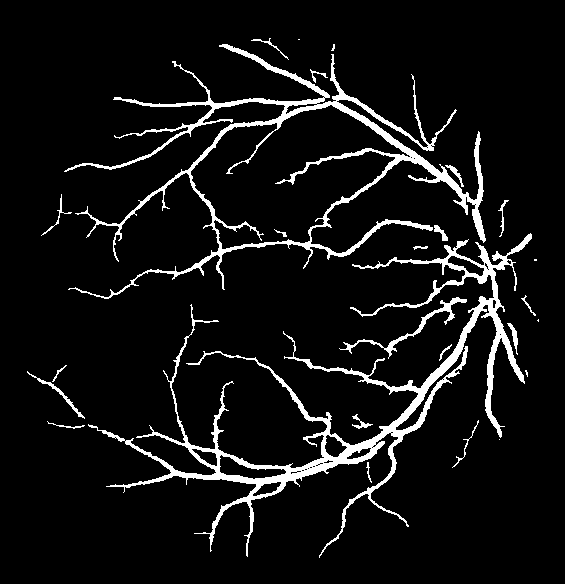

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

path='/content/test/'
create_dir(path)
for data in zip(test_x,test_mask):
  np.random.seed(0)
  finalImage=farko_method(data)
  cv2_imshow(finalImage)
  
  imagePredict=finalImage.astype(int)/255

  fileName=data[0].split('/')[-1].split('_')[0]

  plt.imsave(path+fileName+'.png', imagePredict, cmap=cm.gray)


In [ ]:
test_x,test_mask=load_test('/content/DRIVE/')

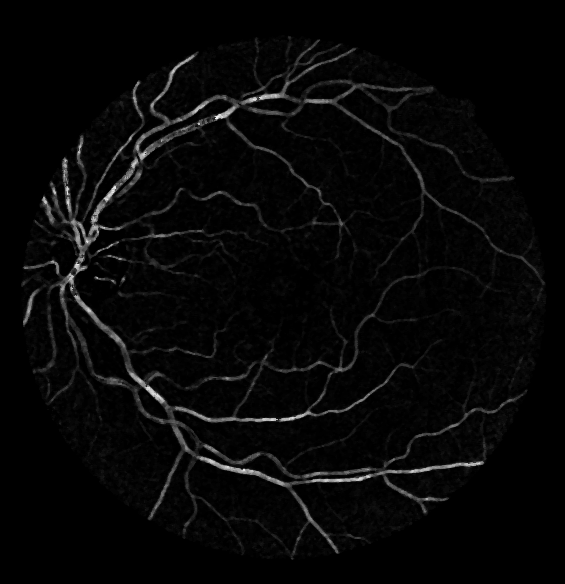

239 0


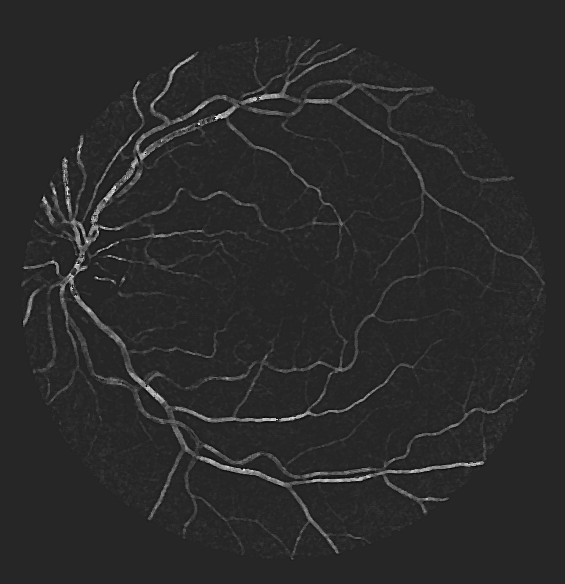

[55.155868120014, 109.89951641838121, 252.70493020966143]


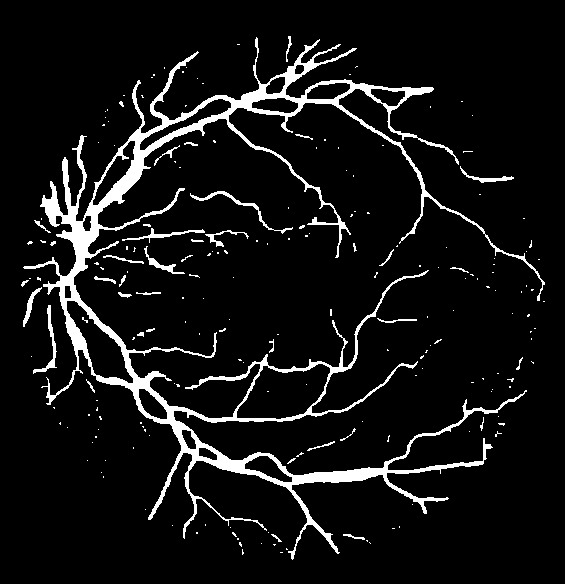

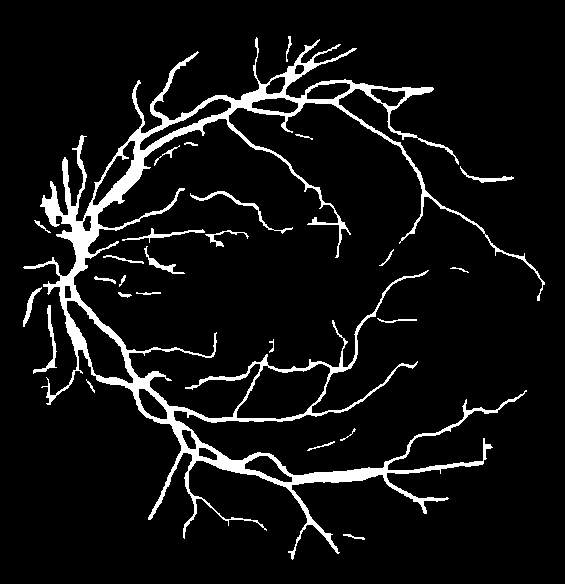

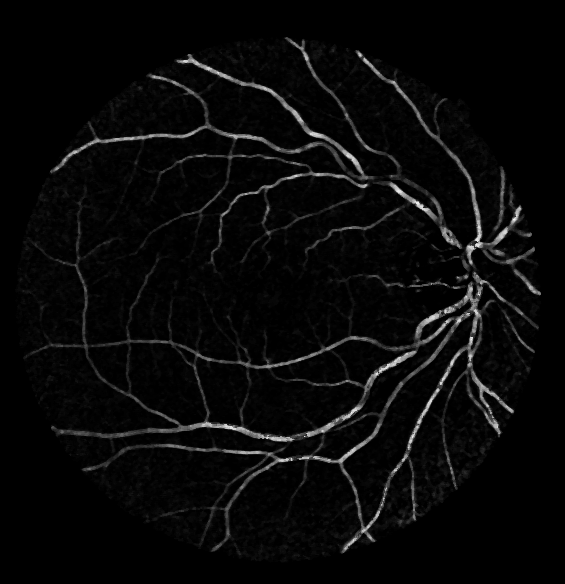

244 0


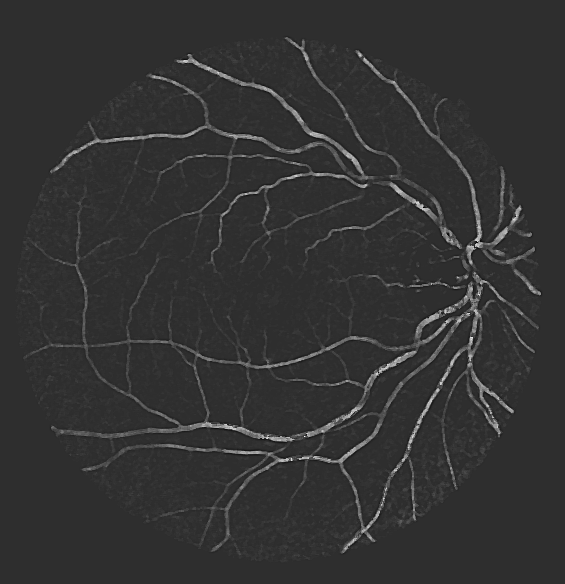

[63.08926516902662, 109.39206528449134, 240.18215030865818]


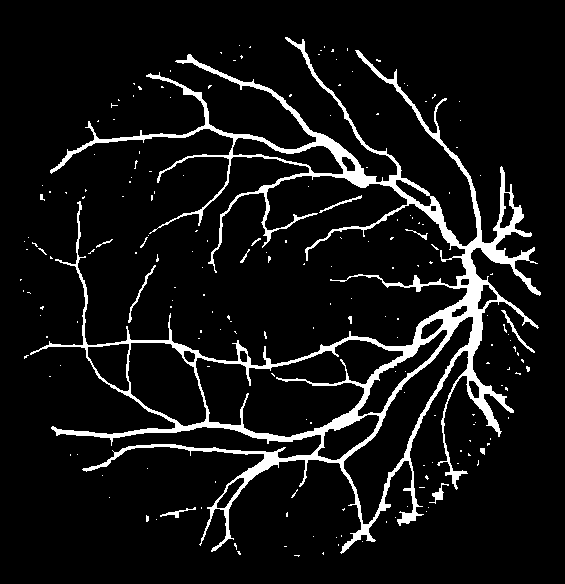

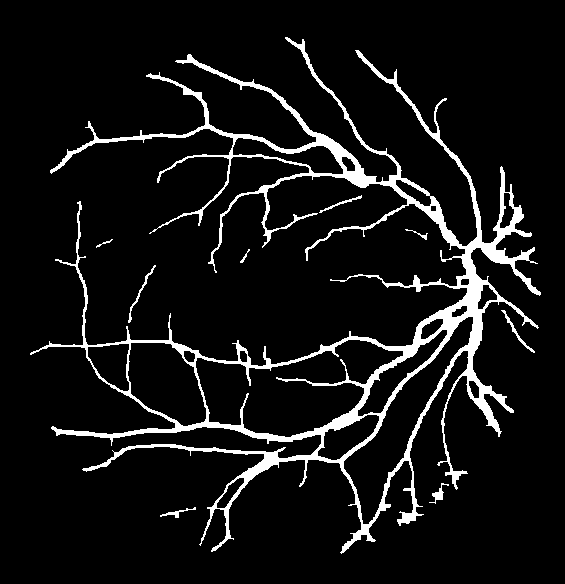

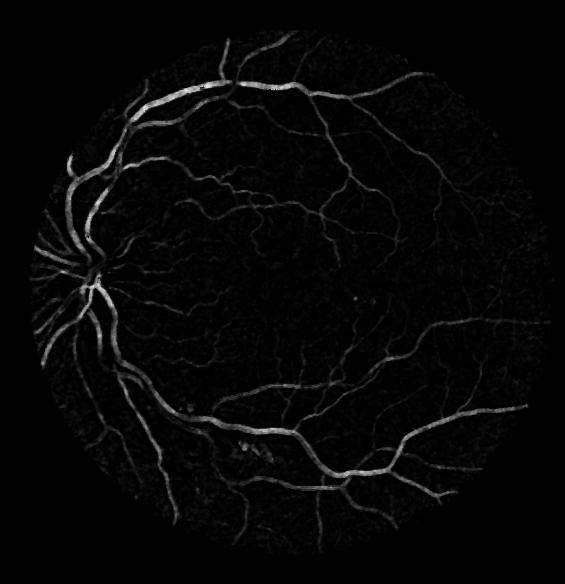

229 0


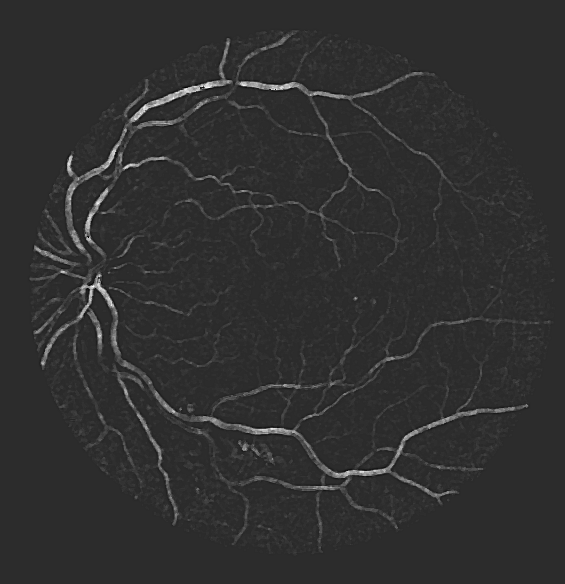

[59.46337117138439, 108.68940681613184, 255.0]


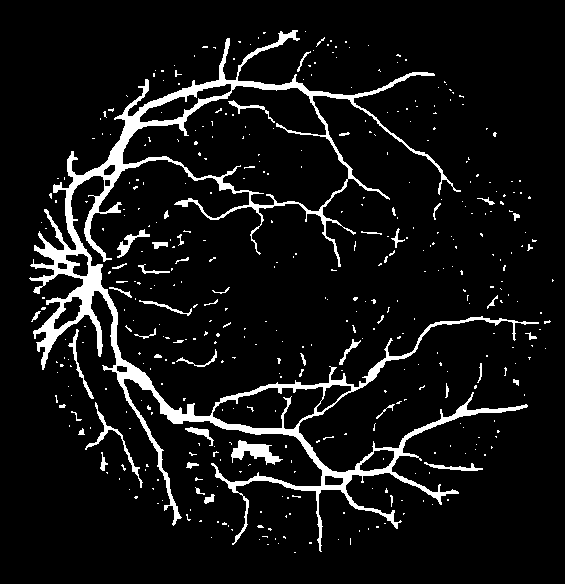

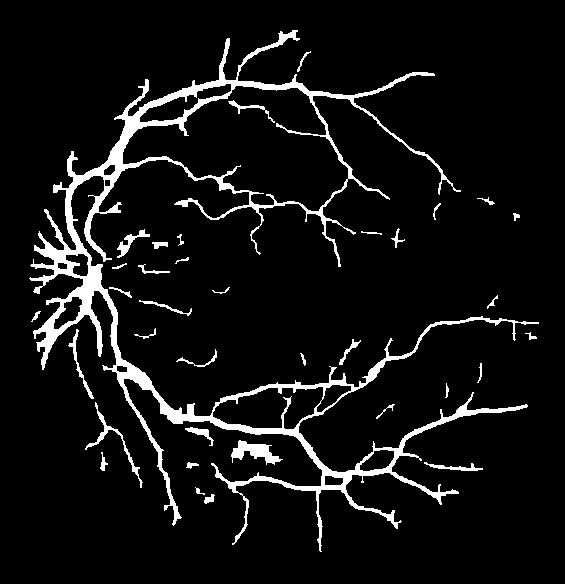

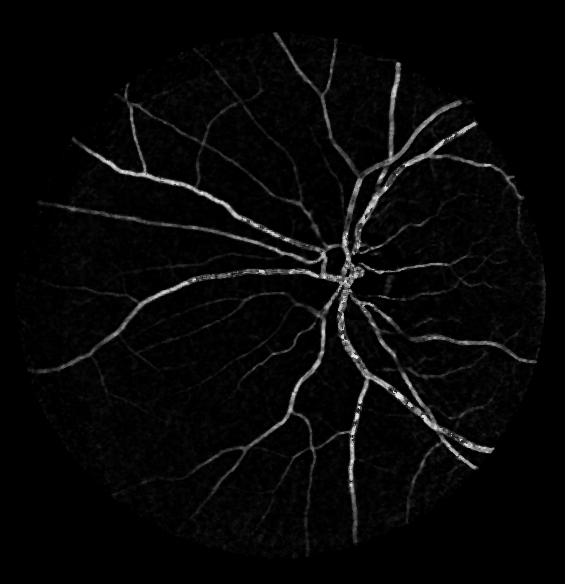

254 0


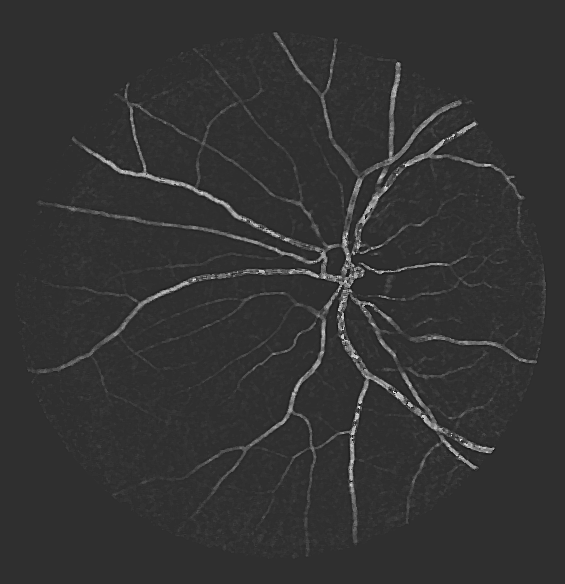

[64.67188176222146, 112.9560004493733, 238.36751607576198]


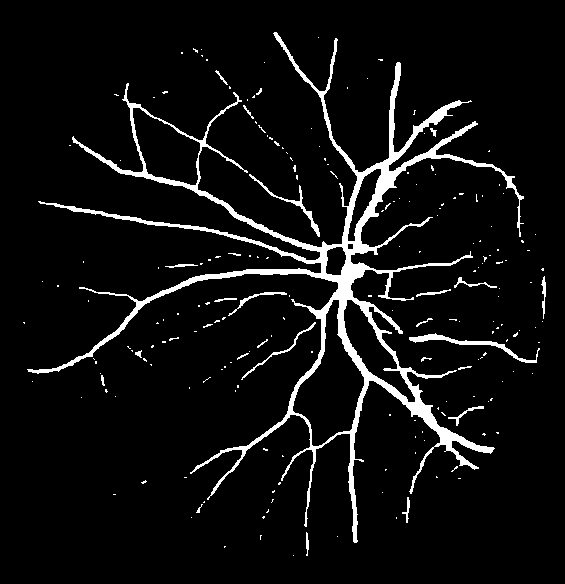

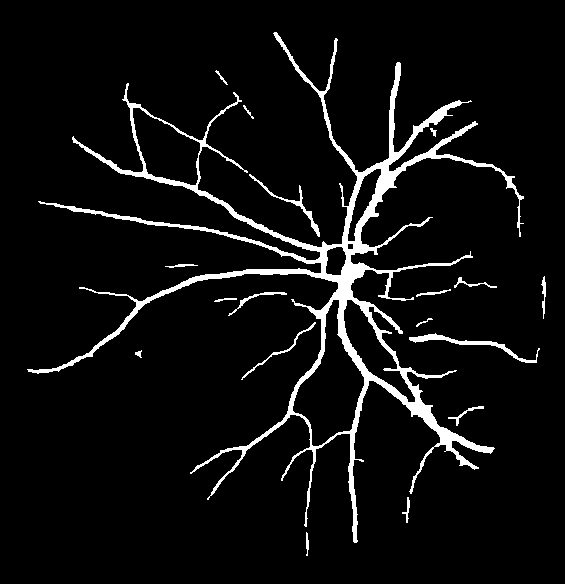

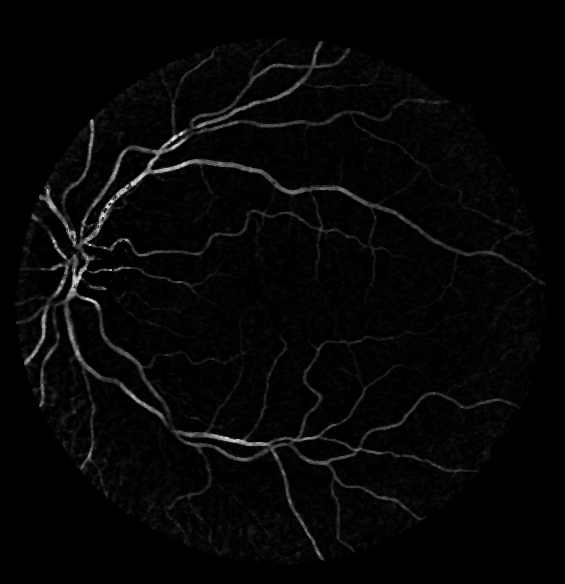

238 0


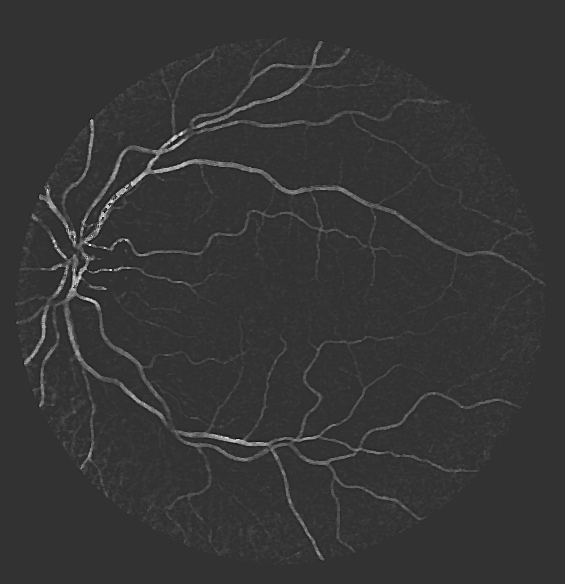

[65.34613599484803, 107.46618194946598, 255.0]


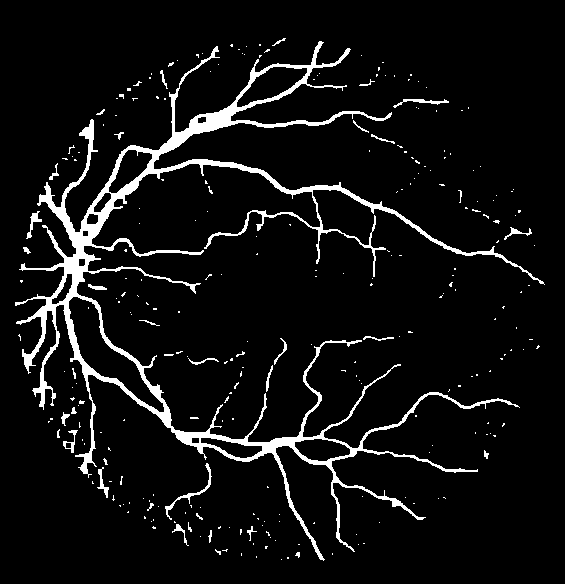

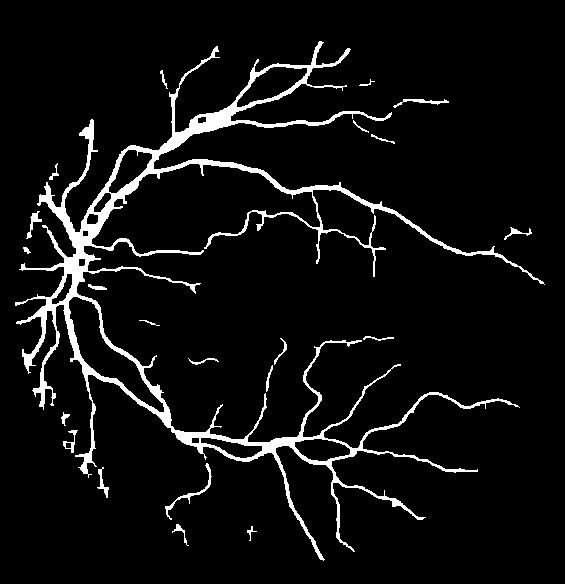

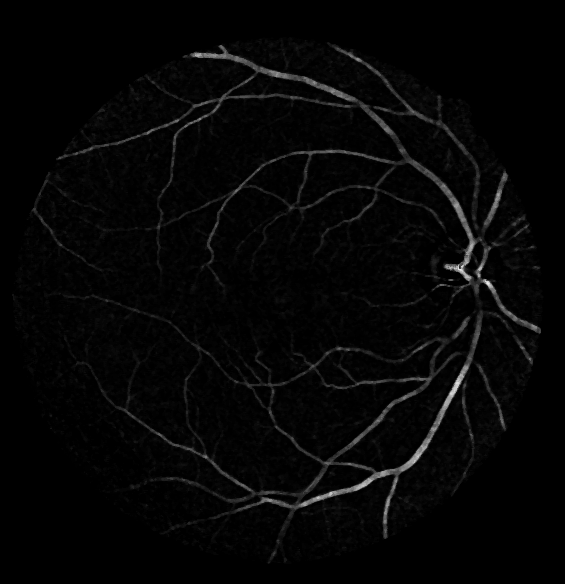

238 0


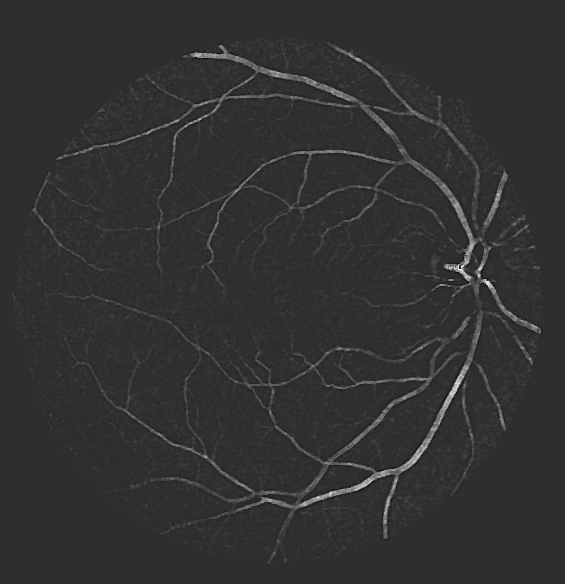

[63.499364106912665, 117.93172518644724, 255.0]


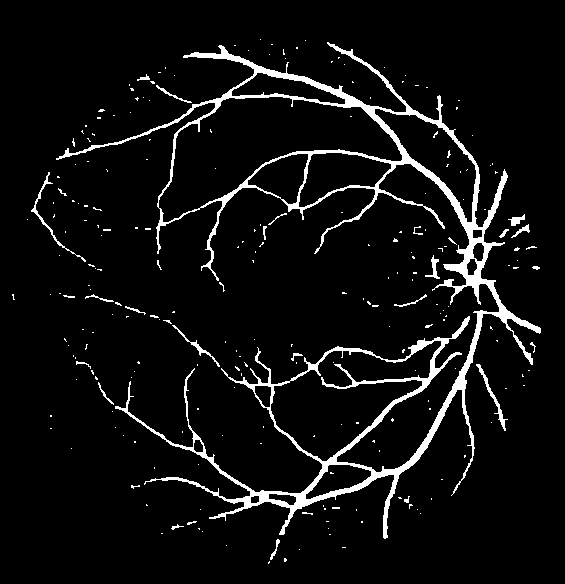

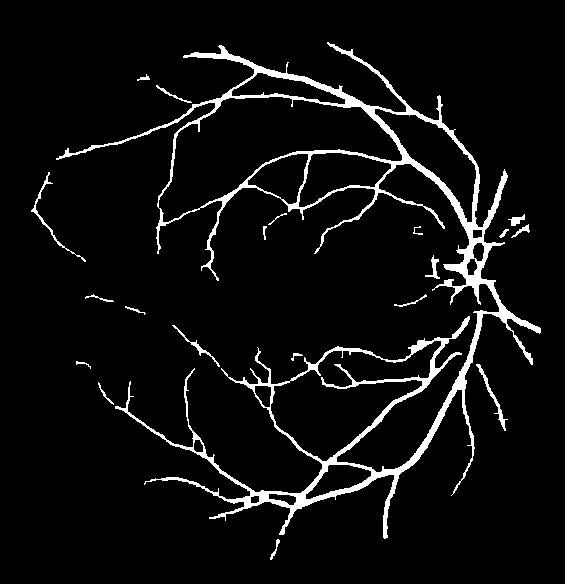

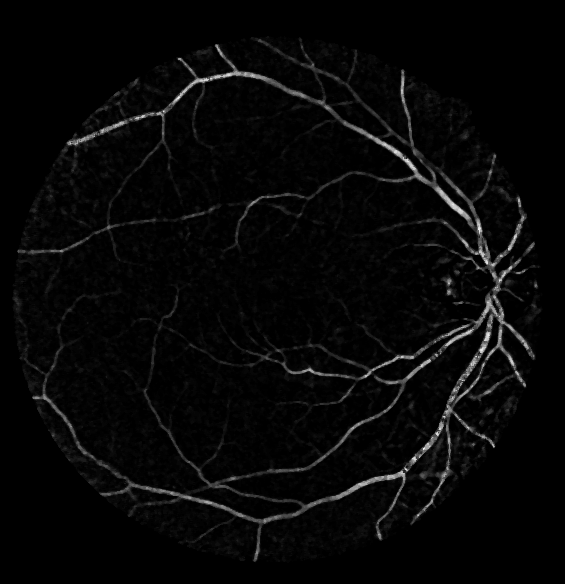

237 0


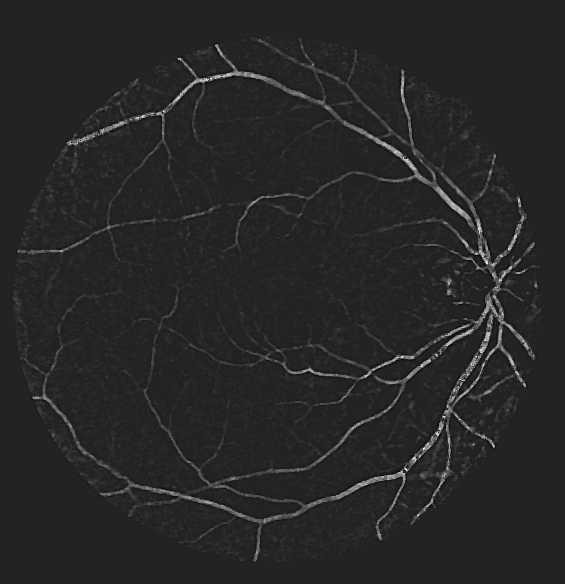

[53.384579069672824, 111.84353743245983, 249.1707972538543]


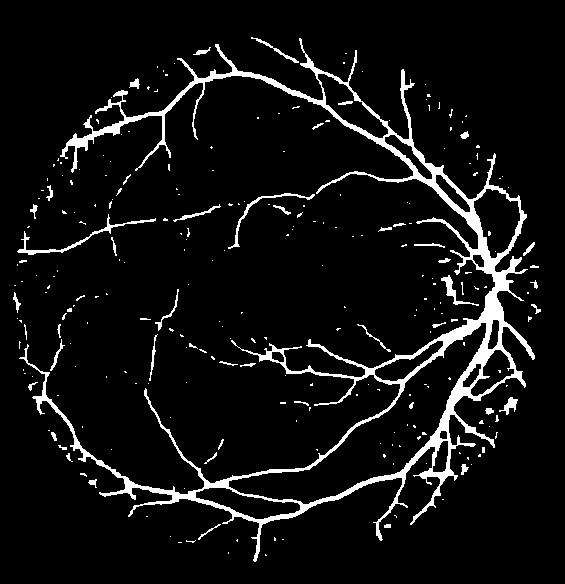

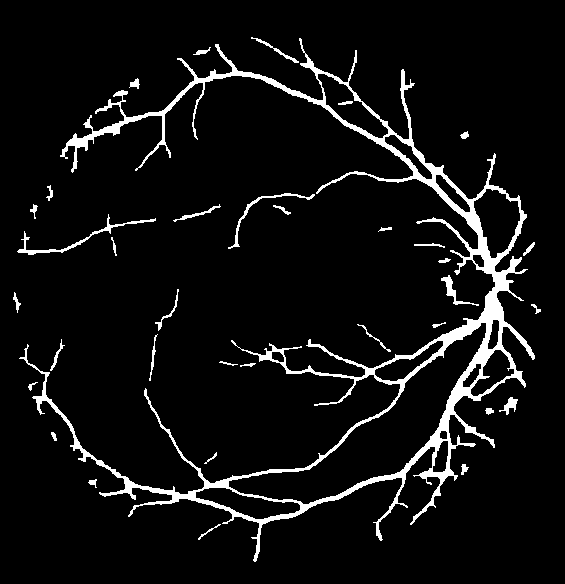

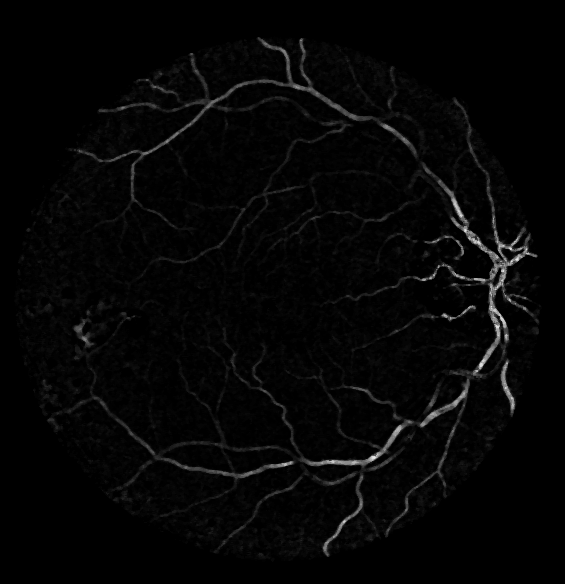

233 0


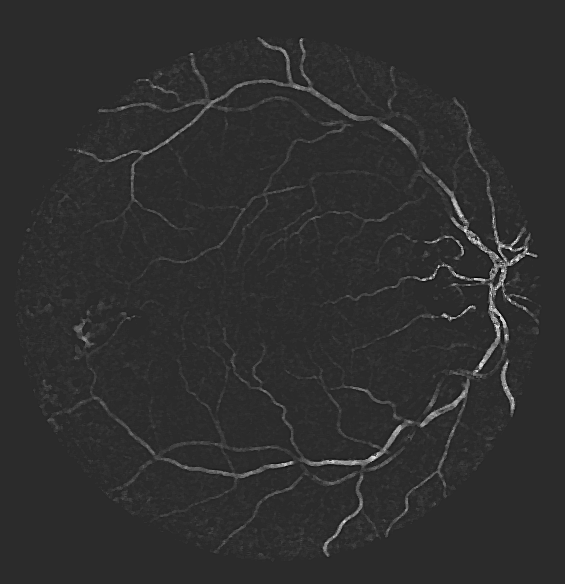

[59.361526434381005, 115.940154398825, 254.2171944961176]


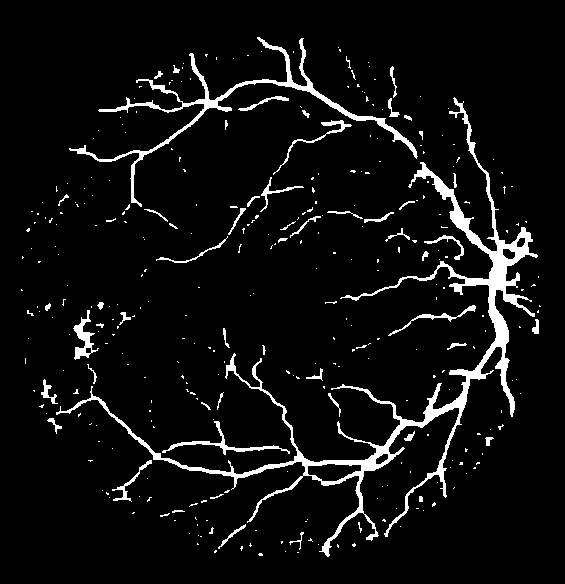

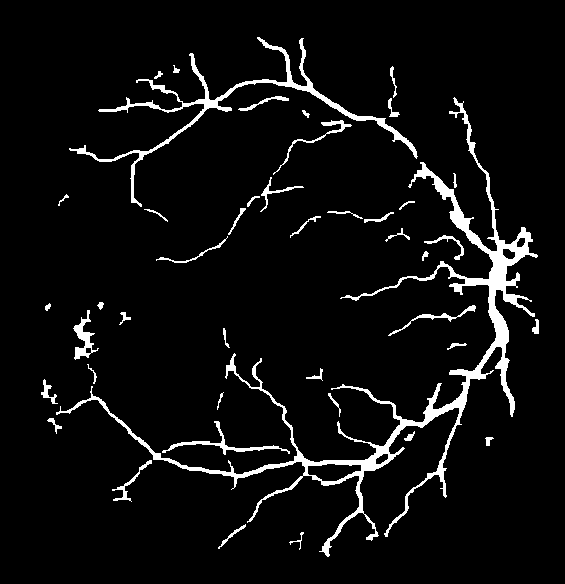

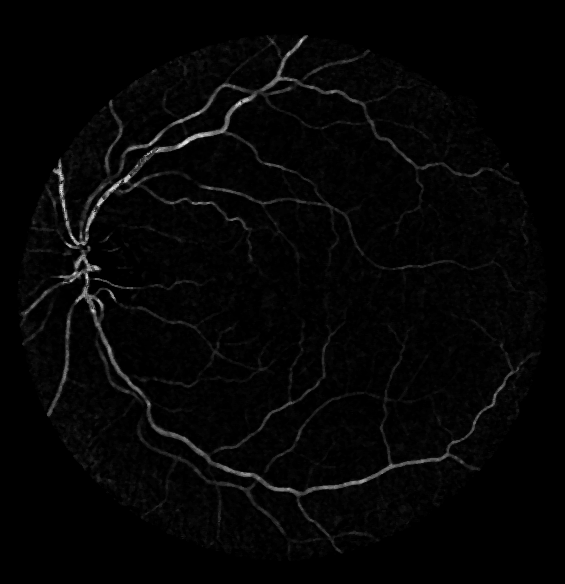

232 0


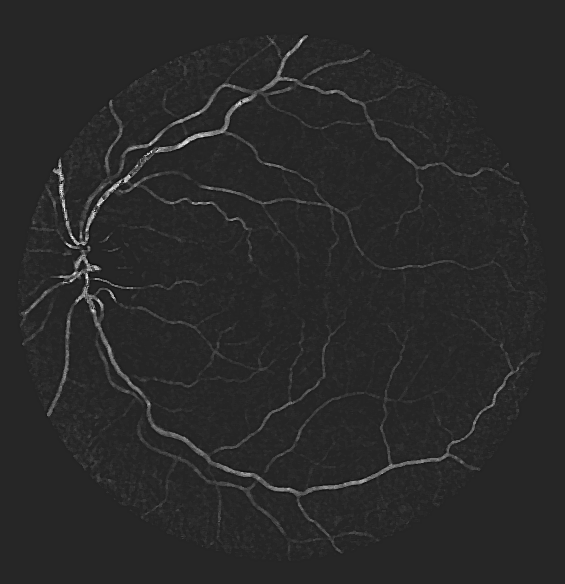

[52.33557007362405, 96.73603734796507, 255.0]


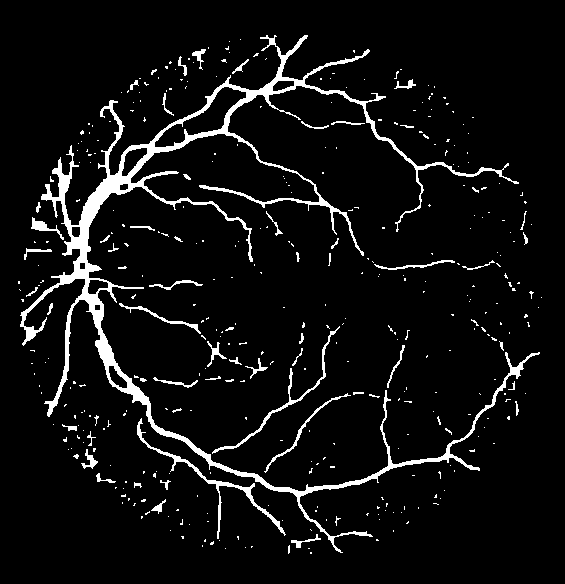

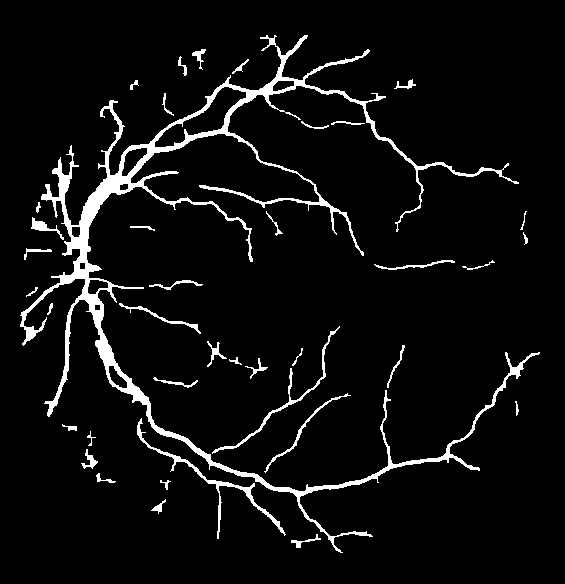

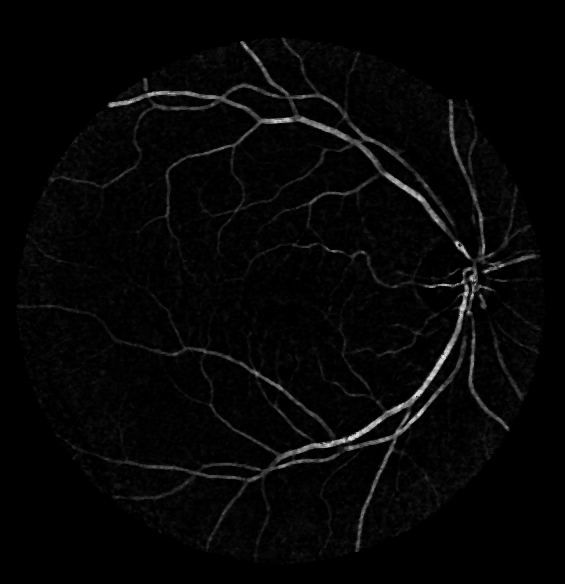

236 0


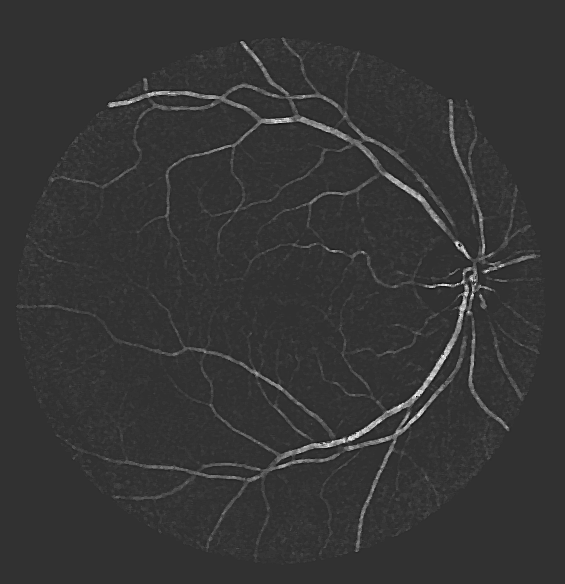

[64.05952755972574, 109.92942086169475, 252.72726491648996]


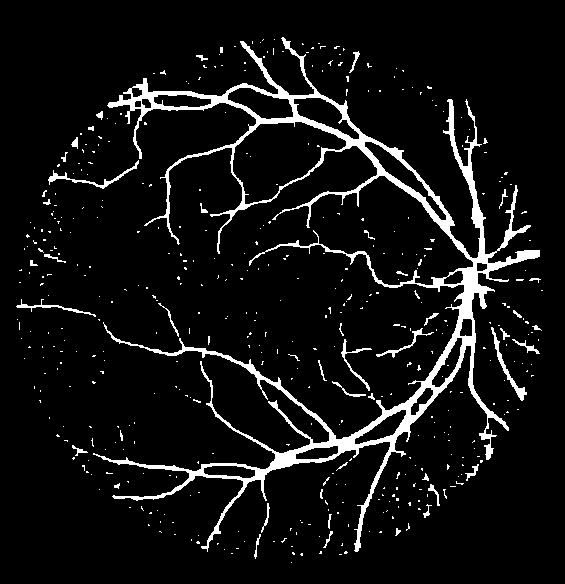

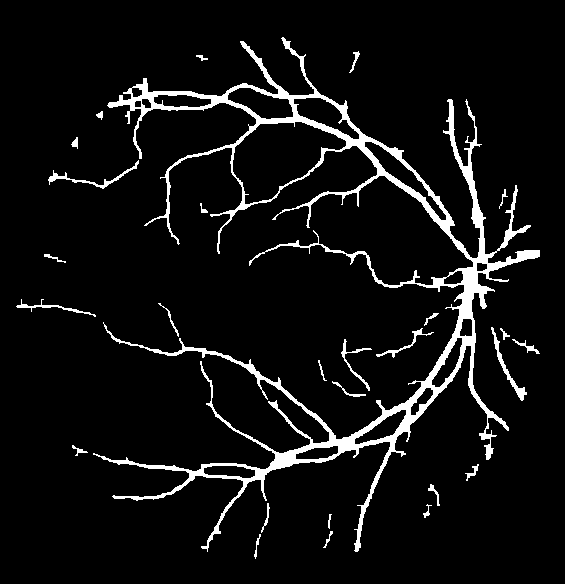

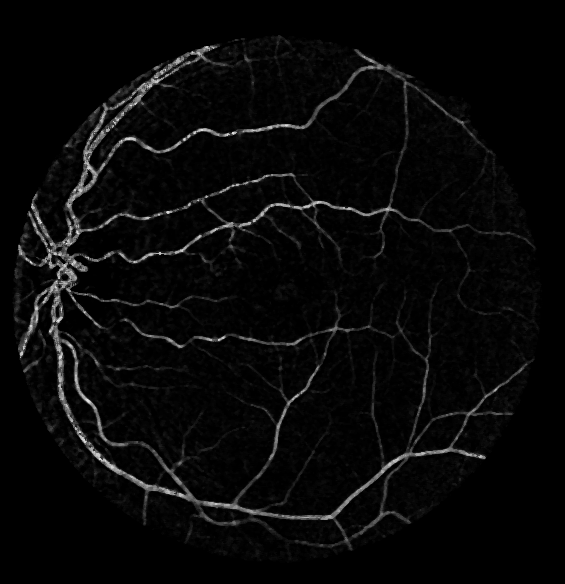

236 0


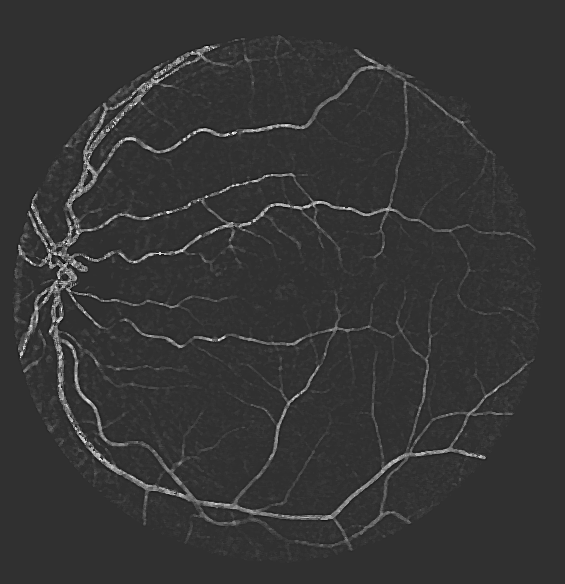

[65.58542930361001, 114.90738677949184, 255.0]


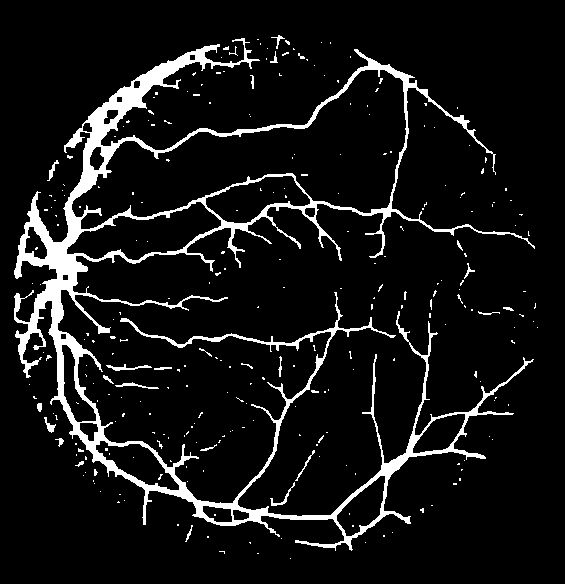

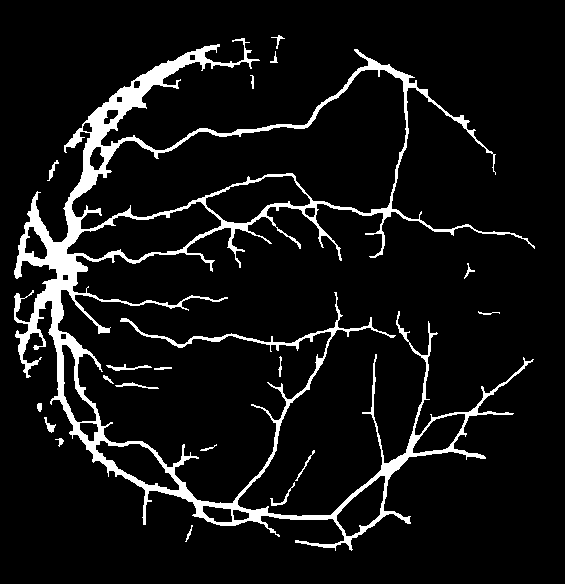

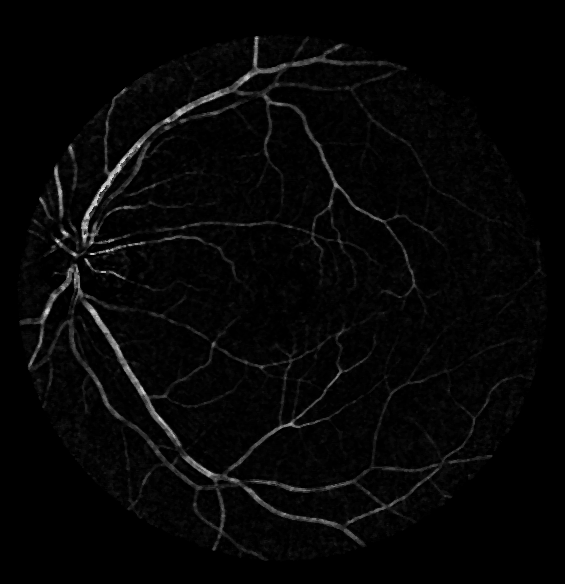

237 0


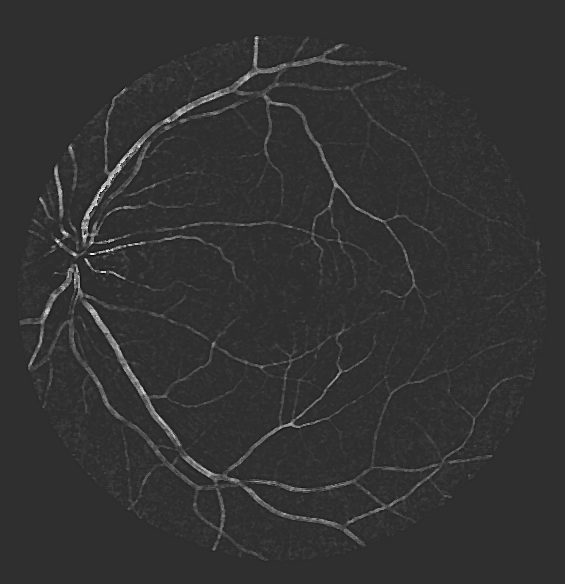

[63.94388583553801, 109.9567956063108, 255.0]


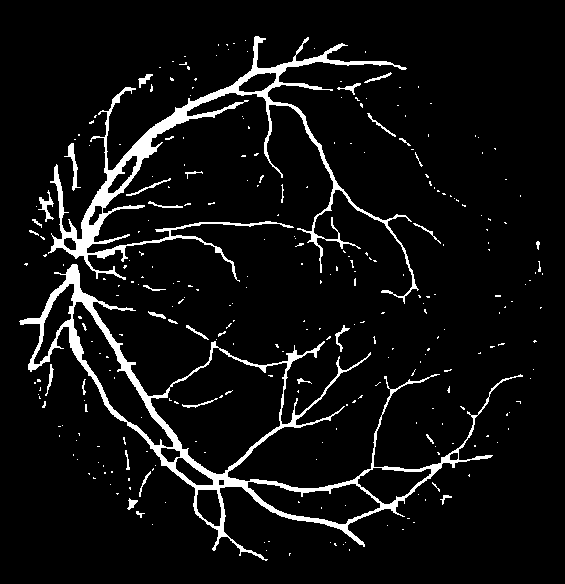

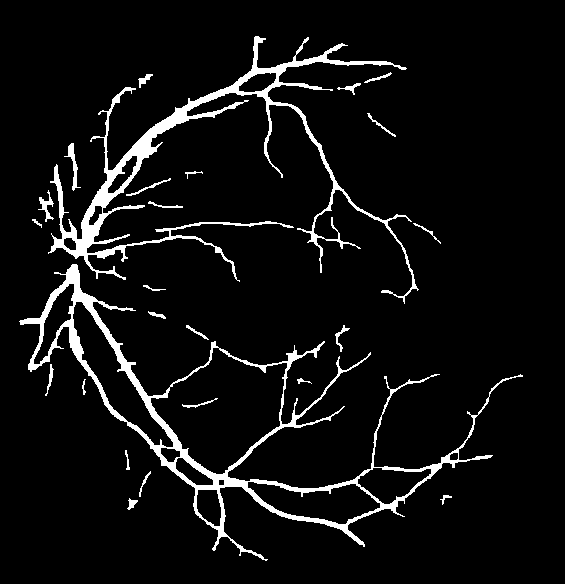

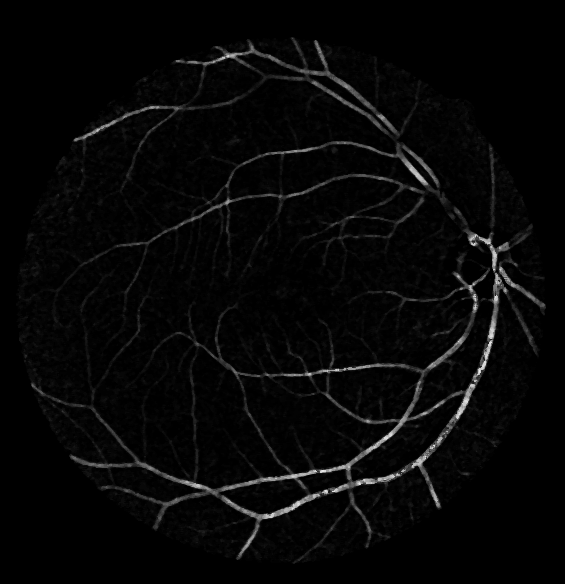

239 0


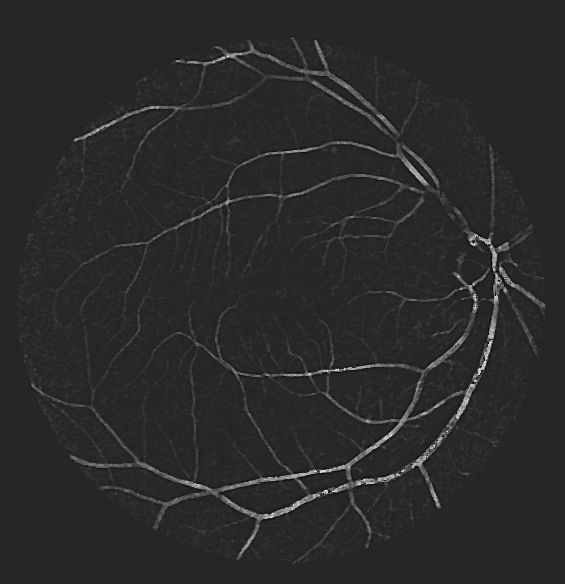

[54.234172361076865, 101.75132261042769, 244.50669975907755]


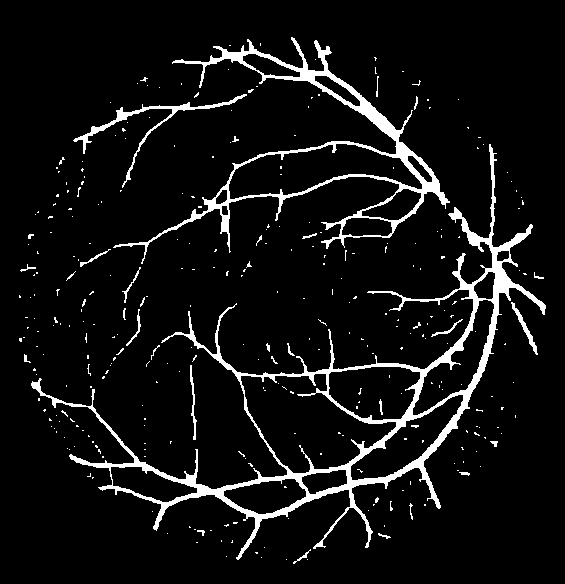

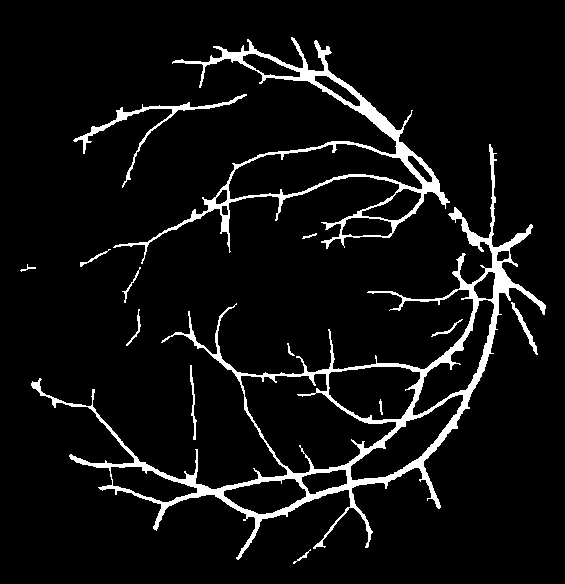

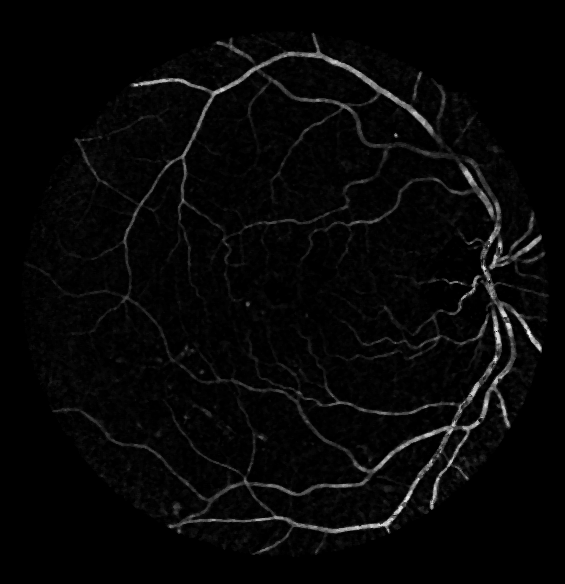

247 0


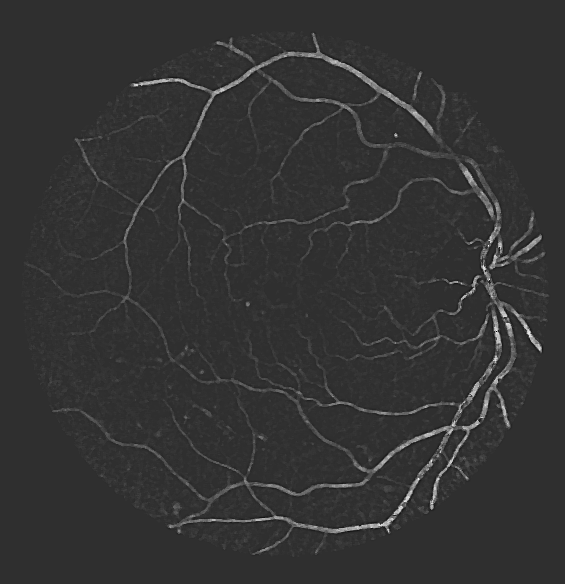

[63.40318194274379, 109.89506100854919, 253.284703353894]


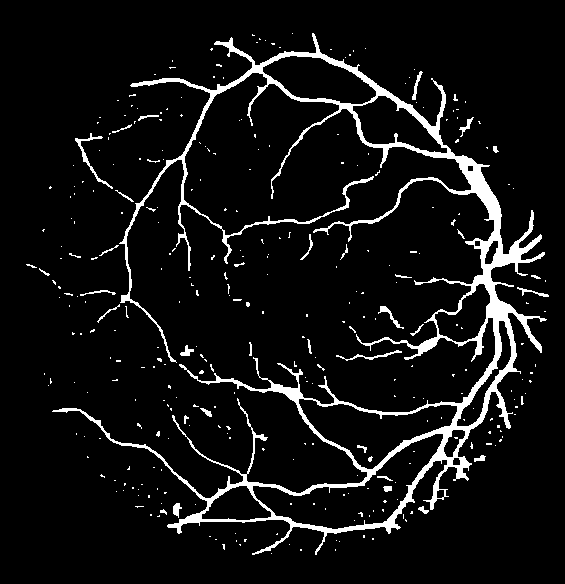

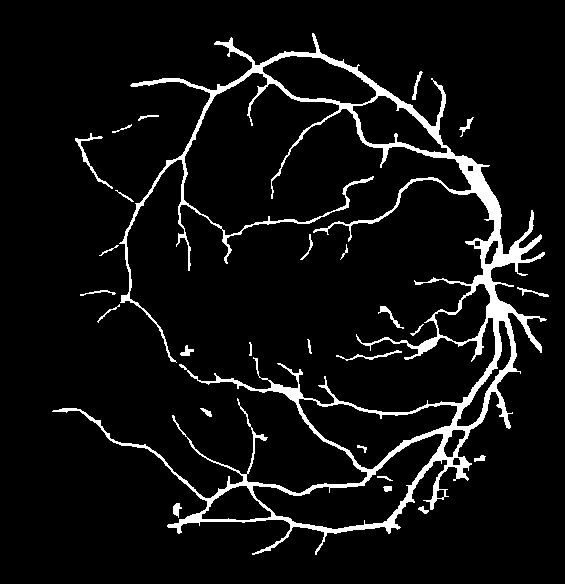

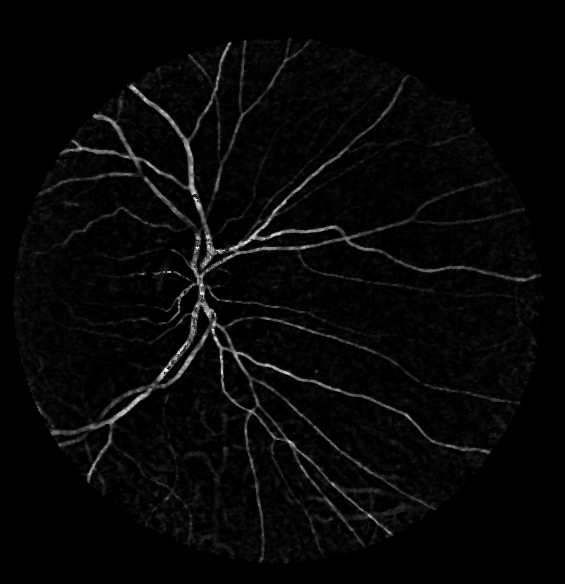

254 0


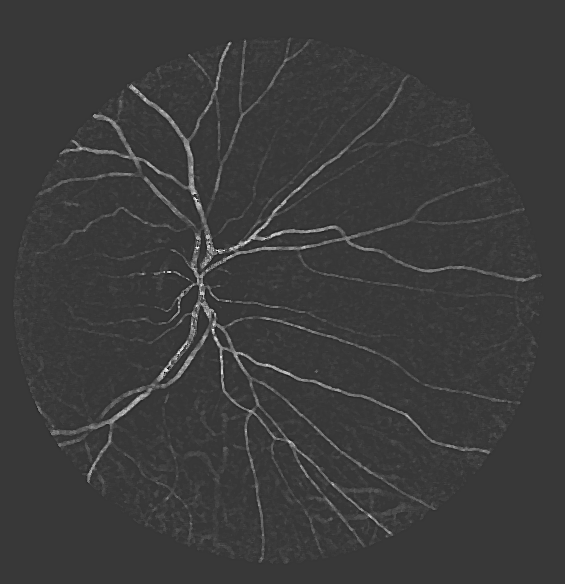

[68.15346534942445, 105.77944067180798, 255.0]


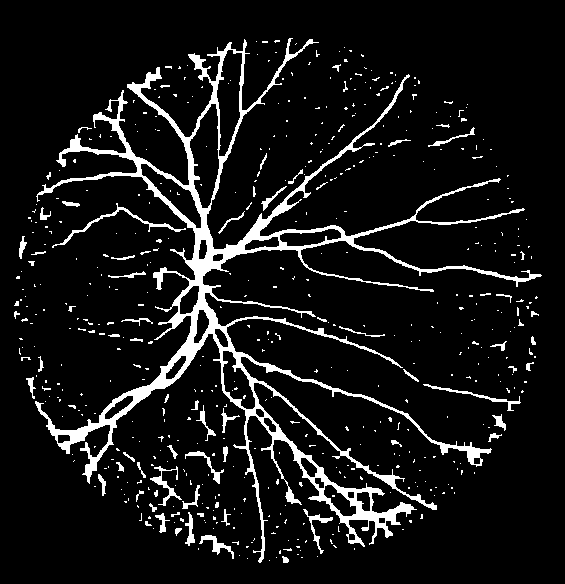

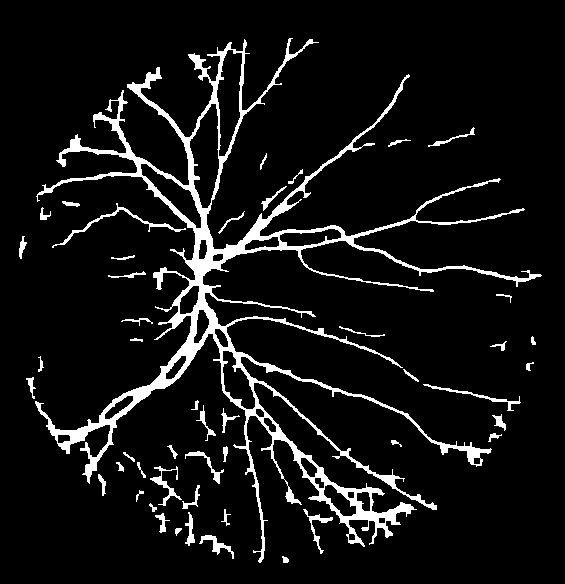

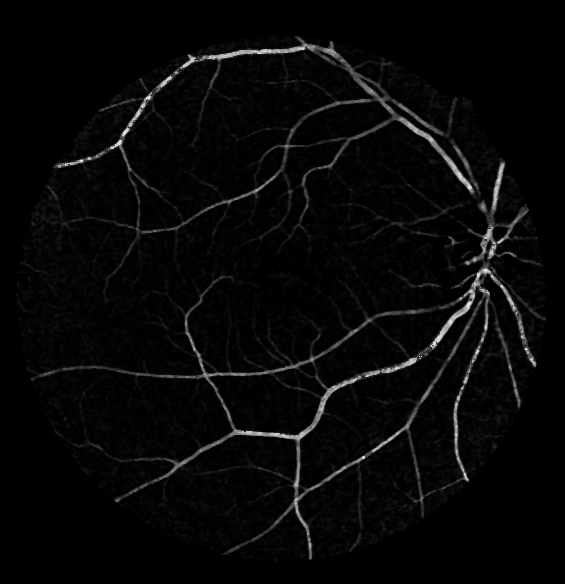

242 0


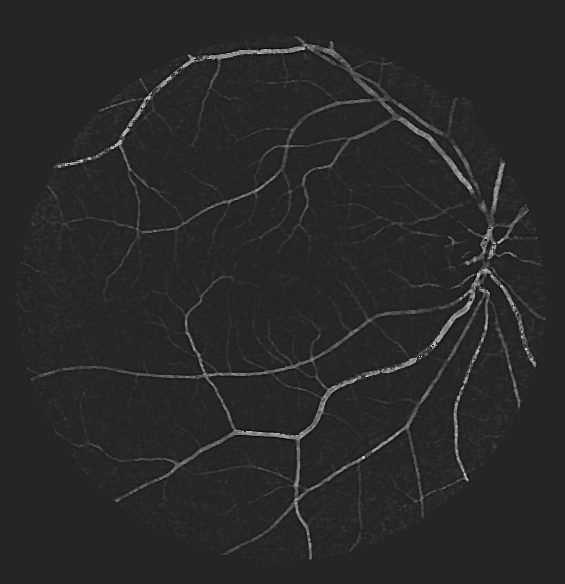

[52.43098240135956, 95.91626996891081, 220.2021773370524]


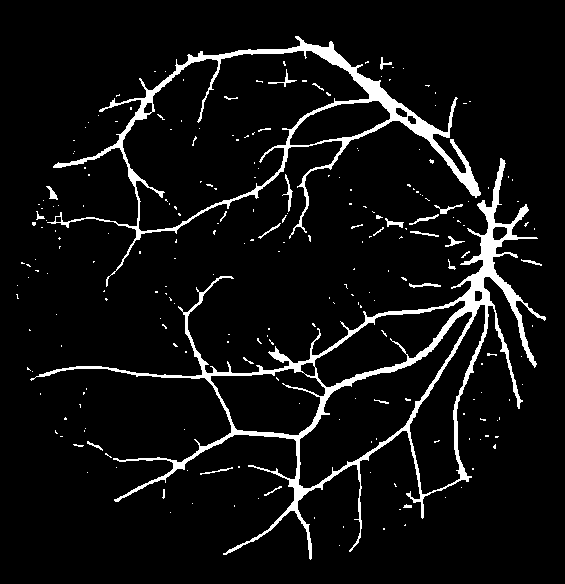

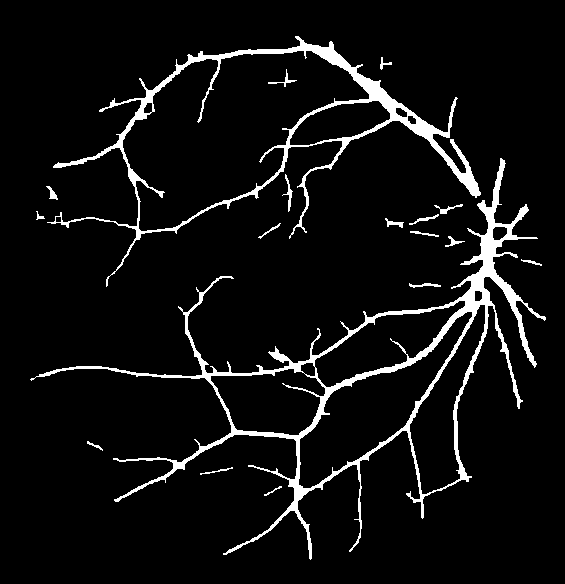

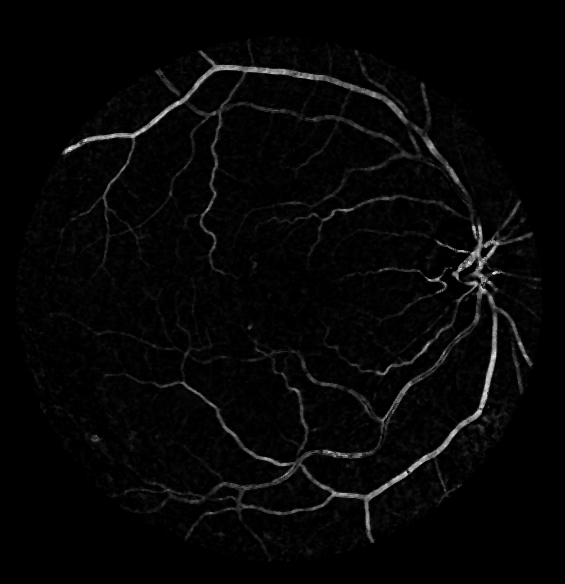

241 0


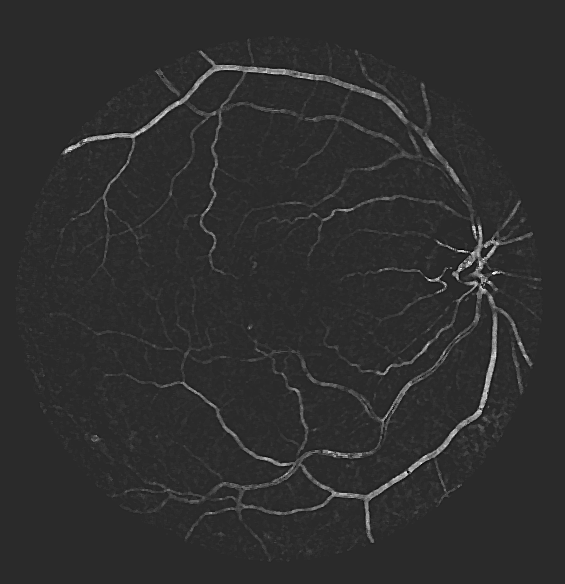

[59.259517366758125, 107.97930485285309, 255.0]


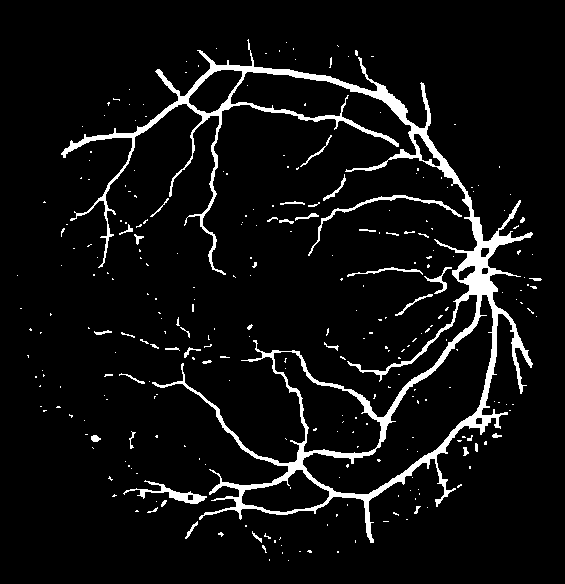

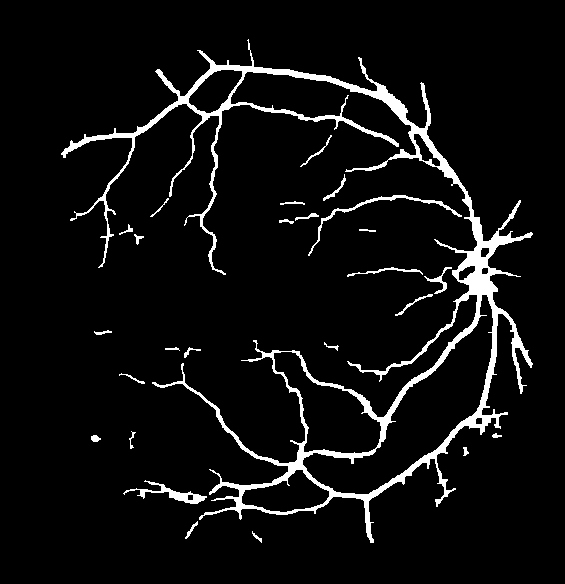

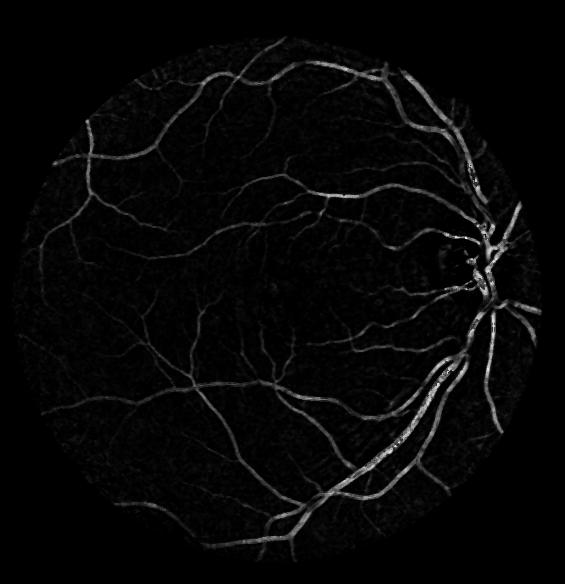

234 0


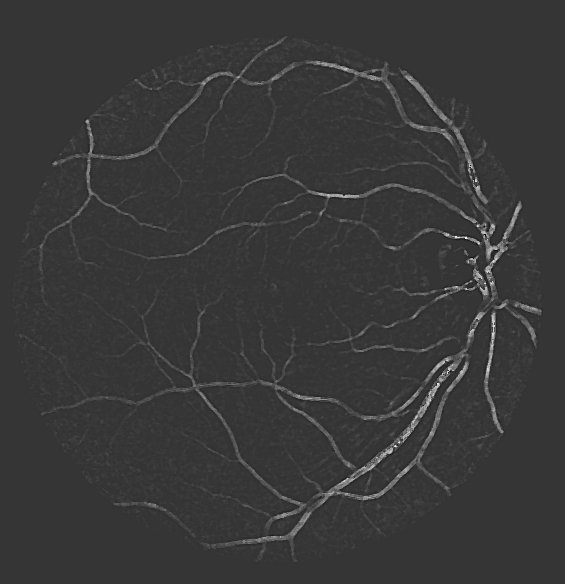

[69.05909724890789, 114.93255697680661, 255.0]


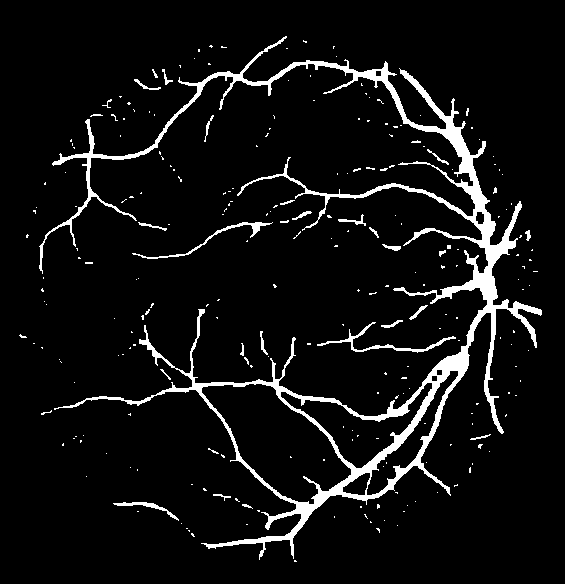

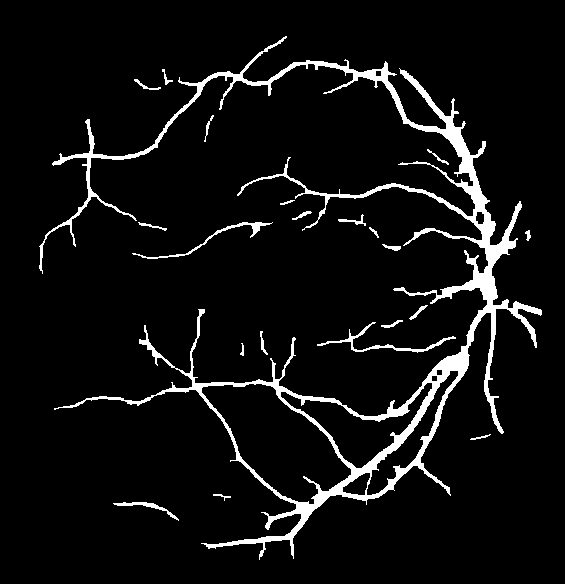

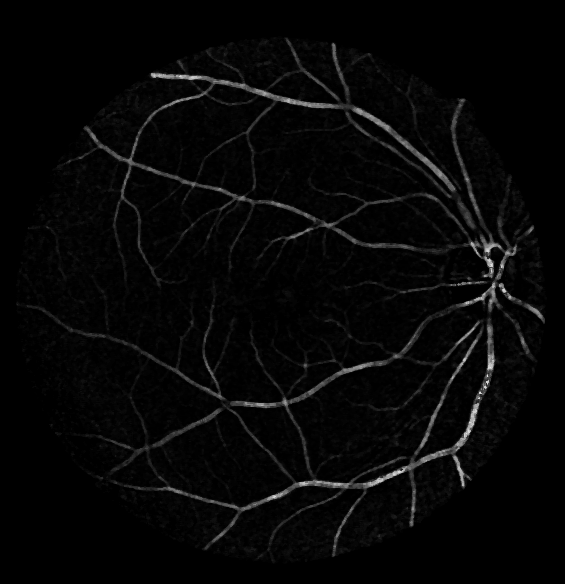

230 0


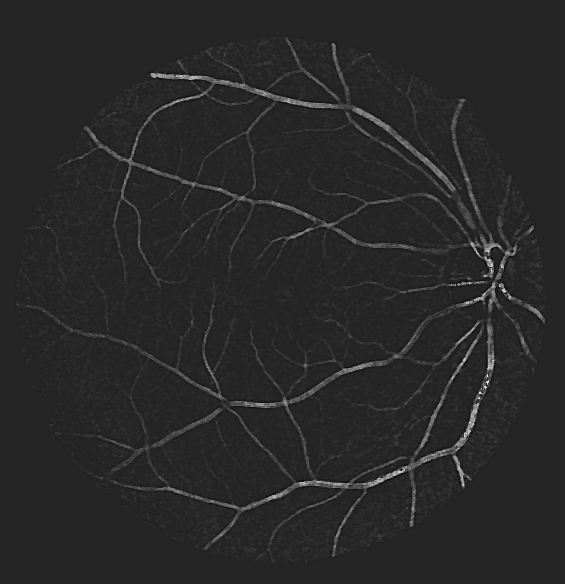

[54.057535985490055, 108.71893559329024, 238.42563260072706]


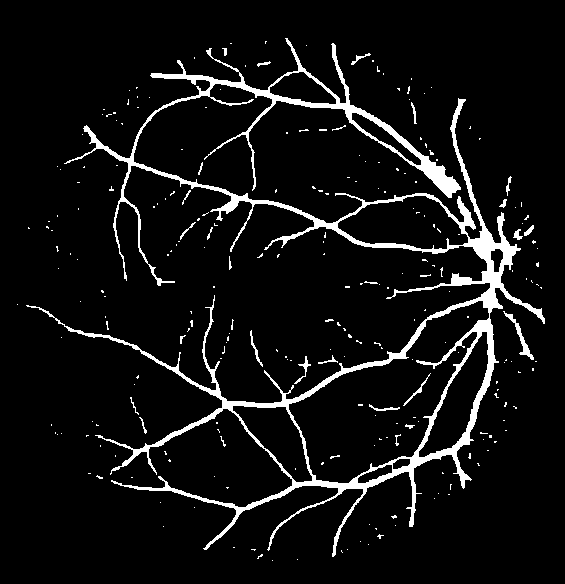

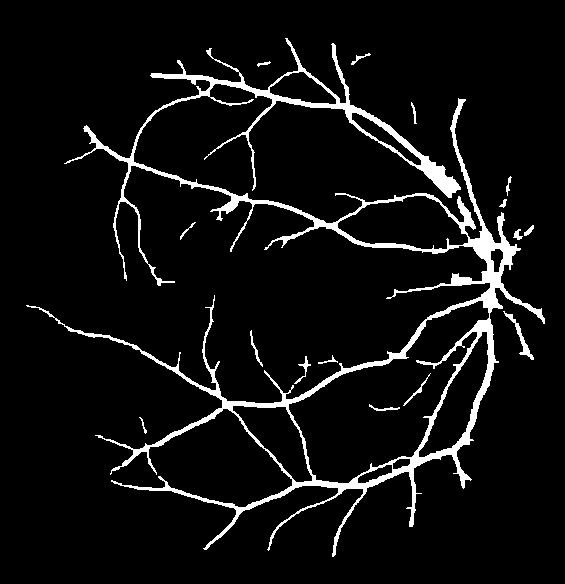

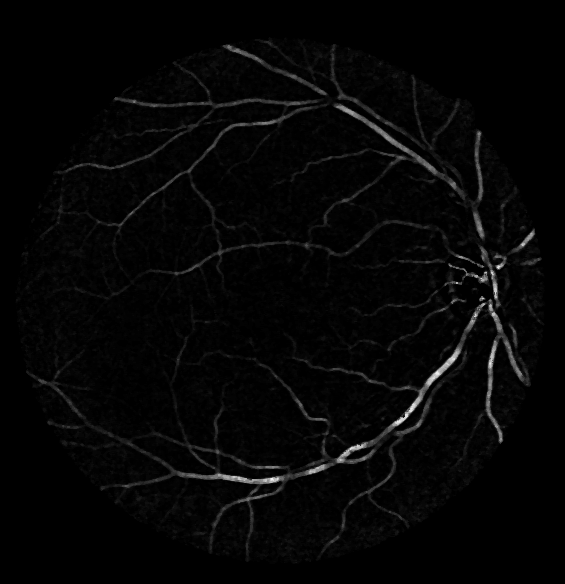

242 0


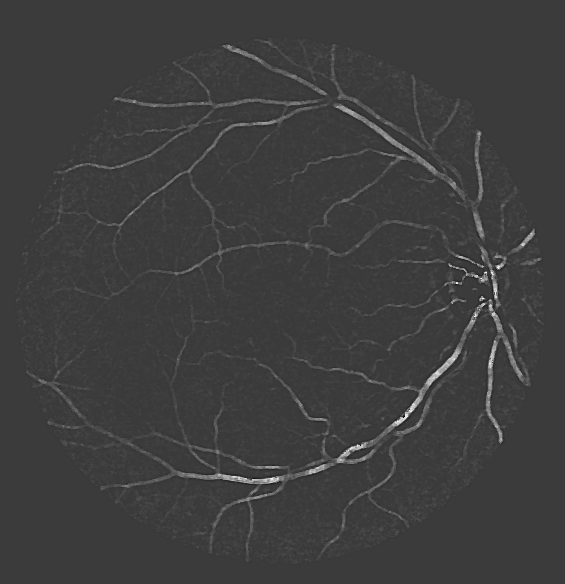

[73.16536818937048, 116.48864058989273, 255.0]


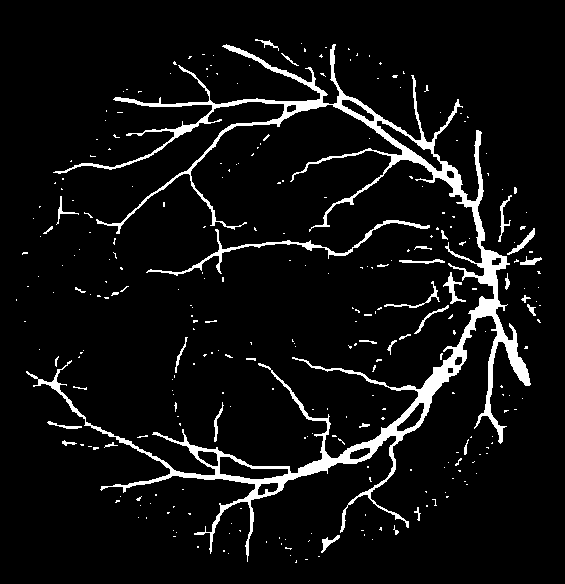

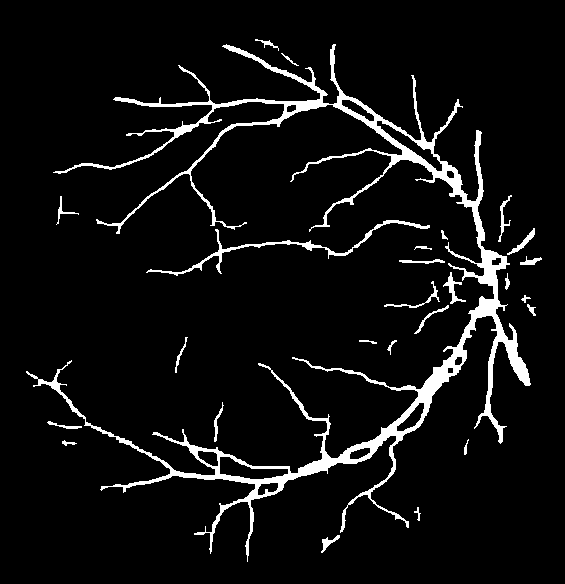

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

X_test_method2 = []
mask_test_method2 = []
for data in test_x:
  image = cv2.imread(data)
  # Extracting Green Channel
  green_channel = image[:,:,1]
  X_test_method2.append(green_channel)

for m in test_mask:
  maskImg=read_gif(m)
  maskImg=cv2.cvtColor(maskImg, cv2.COLOR_BGR2GRAY)
  mask_test_method2.append(maskImg/255)

path='/content/test/'
create_dir(path)

for i in range(len(X_test_method2)):
  np.random.seed(0)
  diazEtal = diazEtAl(X_test_method2[i],mask_test_method2[i])
  cv2_imshow(diazEtal)
 
  imagePredict=diazEtal.astype(int)/255

  fileName=str(i+1).zfill(2)
  plt.imsave(path+fileName+'.png', imagePredict, cmap=cm.gray)

  
  # break


In [ ]:
!zip -r /content/test.zip /content/test

  adding: content/test/ (stored 0%)
  adding: content/test/19.png (deflated 2%)
  adding: content/test/14.png (deflated 2%)
  adding: content/test/06.png (deflated 3%)
  adding: content/test/03.png (deflated 2%)
  adding: content/test/16.png (deflated 2%)
  adding: content/test/20.png (deflated 3%)
  adding: content/test/04.png (deflated 3%)
  adding: content/test/08.png (deflated 3%)
  adding: content/test/10.png (deflated 2%)
  adding: content/test/01.png (deflated 2%)
  adding: content/test/17.png (deflated 4%)
  adding: content/test/05.png (deflated 2%)
  adding: content/test/18.png (deflated 3%)
  adding: content/test/11.png (deflated 2%)
  adding: content/test/02.png (deflated 2%)
  adding: content/test/09.png (deflated 2%)
  adding: content/test/12.png (deflated 2%)
  adding: content/test/13.png (deflated 2%)
  adding: content/test/07.png (deflated 2%)
  adding: content/test/15.png (deflated 2%)


# STARE Dataset

In [ ]:
!wget https://cecas.clemson.edu/~ahoover/stare/probing/stare-images.tar
!wget https://cecas.clemson.edu/~ahoover/stare/probing/labels-ah.tar
!mkdir /content/stareGz/
!mkdir /content/stareTrueGz/

In [ ]:
!tar -xvf "/content/labels-ah.tar" -C "/content/stareTrueGz/" 

In [ ]:
!tar -xvf "/content/stare-images.tar" -C "/content/stareGz/" 

In [ ]:
from glob import glob
import os
train_y_gz = sorted(glob(os.path.join("/content/stareTrueGz/*")))
train_x_gz = sorted(glob(os.path.join("/content/stareGz/*")))  

In [ ]:
for content in train_x_gz:
  !gunzip $content
for content in train_y_gz:
  !gunzip $content

In [ ]:
train_y_stare = sorted(glob(os.path.join("/content/stareTrueGz/*")))
train_x_stare = sorted(glob(os.path.join("/content/stareGz/*")))

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
stareDataSetFaruko=[]
for img in train_x_stare:
  green=cv2.imread(img)[:,:,1]
  
  mask=255*(green>20)
  frako=farko_method_noMask(cv2.imread(img))
  stareDataSetFaruko.append(frako)
  cv2_imshow(frako)

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
diazEtAlStare=[]
for dataPath in train_x_stare:
  image=cv2.imread(dataPath)
  imgGreen=image[:,:,1]
  diazStare=diazEtAl_noMask(imgGreen)
  diazEtAlStare.append(diazStare)
  cv2_imshow(diazStare)

In [ ]:
from sklearn.metrics import confusion_matrix
from copy import deepcopy
import numpy as np
from math import gamma
from scipy.special import xlogy


results=[]
for idx,data in enumerate(train_y_stare):
  result=[]
  result.append(data.split('/')[-1])
  
  imageTrue = cv2.imread(data)
  imageTrue=cv2.cvtColor(imageTrue,cv2.COLOR_BGR2GRAY)/255
  #TODO our prediction
  np.random.seed(0)
  # imagePredict=imagePredictList[idx].astype(int)/255

  imagePredict=stareDataSetFaruko[idx].astype(int)/255
  # imagePredict=(imagePredictList[idx]/255).astype(int)
  
  tn, fp, fn, tp = confusion_matrix(imageTrue.reshape(-1), imagePredict.reshape(-1)).ravel()
  specificity = tn / (tn+fp)
  sensitivity= tp/(tp+fn)
  accuraccy=(tp+tn)/(tp+tn+fp+fn)
  dice= 2*np.sum(imagePredict*imageTrue)/(np.sum(imageTrue)+ np.sum(imagePredict))

  result.append(specificity)
  result.append(sensitivity)
  result.append(accuraccy)
  result.append(dice)

  results.append(result)

import numpy as np
from tabulate import tabulate

header=['Image','Specificity','Sensitivity','Accuracy','Dice']
# tabulate data
tableList=results.append(['Average']+list(np.mean(np.array(results)[:,1:].astype(float),axis=0)))
table = tabulate(results, tablefmt="fancy_grid",headers=header)

# output
print(table)

In [ ]:
from sklearn.metrics import confusion_matrix
from copy import deepcopy
import numpy as np
from math import gamma
from scipy.special import xlogy


results=[]
for idx,data in enumerate(train_y_stare):
  result=[]
  result.append(data.split('/')[-1])
  
  imageTrue = cv2.imread(data)
  imageTrue=cv2.cvtColor(imageTrue,cv2.COLOR_BGR2GRAY)/255
  #TODO our prediction
  np.random.seed(0)
  # imagePredict=imagePredictList[idx].astype(int)/255

  imagePredict=diazEtAlStare[idx].astype(int)/255
  # imagePredict=(imagePredictList[idx]/255).astype(int)
  
  tn, fp, fn, tp = confusion_matrix(imageTrue.reshape(-1), imagePredict.reshape(-1)).ravel()
  specificity = tn / (tn+fp)
  sensitivity= tp/(tp+fn)
  accuraccy=(tp+tn)/(tp+tn+fp+fn)
  dice= 2*np.sum(imagePredict*imageTrue)/(np.sum(imageTrue)+ np.sum(imagePredict))

  result.append(specificity)
  result.append(sensitivity)
  result.append(accuraccy)
  result.append(dice)

  results.append(result)

import numpy as np
from tabulate import tabulate

header=['Image','Specificity','Sensitivity','Accuracy','Dice']
# tabulate data
tableList=results.append(['Average']+list(np.mean(np.array(results)[:,1:].astype(float),axis=0)))
table = tabulate(results, tablefmt="fancy_grid",headers=header)

# output
print(table)